# **Imports**

In [1]:
# Cell 1
import subprocess, sys

pkgs = [
    "open_clip_torch", "transformers>=4.38.0", "sentencepiece",
    "sacrebleu", "bert-score", "rouge-score",
    "ftfy", "regex", "matplotlib", "seaborn", "Pillow",
    "pycocoevalcap", "pycocotools", "scipy", "protobuf", "nltk",
]
result = subprocess.run(
    [sys.executable, "-m", "pip", "install"] + pkgs + ["--quiet"],
    capture_output=True, text=True
)
print(result.stdout[-300:] if result.stdout else "")
if result.returncode != 0:
    print("INSTALL ERRORS:", result.stderr[-500:])

import nltk
for pkg in ["punkt", "punkt_tab", "wordnet", "omw-1.4"]:
    nltk.download(pkg, quiet=True)
print("Install done.")

━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 85.9 MB/s eta 0:00:00

Install done.


# **Fonts**

In [2]:
# Cell 2 — System fonts
import subprocess, os

print("Installing system fonts (Bengali, Devanagari, Latin)...")
subprocess.run(["apt-get", "update", "-y", "-q"], capture_output=True, timeout=60)
subprocess.run(["apt-get", "install", "-y", "-q",
                "fonts-noto-core", "fonts-noto-extra", "fonts-liberation"],
               capture_output=True, timeout=180)
subprocess.run(["fc-cache", "-f"], capture_output=True, timeout=30)

FONT_PATHS = {
    "bn":      "/usr/share/fonts/truetype/noto/NotoSansBengali-Regular.ttf",
    "bn_bold": "/usr/share/fonts/truetype/noto/NotoSansBengali-Bold.ttf",
    "hi":      "/usr/share/fonts/truetype/noto/NotoSansDevanagari-Regular.ttf",
    "hi_bold": "/usr/share/fonts/truetype/noto/NotoSansDevanagari-Bold.ttf",
    "en":      "/usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf",
    "en_bold": "/usr/share/fonts/truetype/liberation/LiberationSans-Bold.ttf",
}
for k, p in FONT_PATHS.items():
    print(f"  {k:8s}: {'OK' if os.path.exists(p) else 'MISSING'} -> {p}")
print("Font setup done.")

Installing system fonts (Bengali, Devanagari, Latin)...
  bn      : OK -> /usr/share/fonts/truetype/noto/NotoSansBengali-Regular.ttf
  bn_bold : OK -> /usr/share/fonts/truetype/noto/NotoSansBengali-Bold.ttf
  hi      : OK -> /usr/share/fonts/truetype/noto/NotoSansDevanagari-Regular.ttf
  hi_bold : OK -> /usr/share/fonts/truetype/noto/NotoSansDevanagari-Bold.ttf
  en      : OK -> /usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf
  en_bold : OK -> /usr/share/fonts/truetype/liberation/LiberationSans-Bold.ttf
Font setup done.


# **Imports and Setup**

In [3]:
# Cell 3 — Imports, Setup, PIL rendering helpers
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

import gc, sys, json, time, math, random, re, warnings, shutil, unicodedata, zipfile
import numpy as np
import pandas as pd
from pathlib import Path
from PIL import Image, ImageDraw, ImageFont
from collections import Counter, defaultdict

warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import AdamW
import torchvision.transforms as transforms
import open_clip

import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
from matplotlib import rcParams
from IPython.display import display as ipy_display

rcParams["axes.unicode_minus"] = False
rcParams["font.family"] = "sans-serif"

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {DEVICE}")
if torch.cuda.is_available():
    p = torch.cuda.get_device_properties(0)
    print(f"GPU: {p.name}  VRAM: {p.total_memory/1e9:.1f} GB")

# ── PIL font helpers (proper Bangla/Hindi rendering — no boxes/garbled glyphs) ──
def get_font(lang, size, bold=False):
    key = f"{lang}_bold" if bold and f"{lang}_bold" in FONT_PATHS else lang
    try:
        return ImageFont.truetype(FONT_PATHS[key], size)
    except Exception:
        return ImageFont.load_default()

def is_ascii(s):
    try:
        s.encode("ascii"); return True
    except Exception:
        return False

def pick_font(text, lang, size, bold=False):
    return get_font("en", size, bold) if is_ascii(text) else get_font(lang, size, bold)

def text_wh(draw, text, font):
    b = draw.textbbox((0, 0), text, font=font)
    return b[2]-b[0], b[3]-b[1], b

def draw_center(draw, text, cx, cy, font, fill=(20,20,20)):
    w,h,b = text_wh(draw, text, font)
    draw.text((cx-w//2, cy-h//2-b[1]), text, font=font, fill=fill)

def draw_left(draw, text, x, cy, font, fill=(20,20,20)):
    w,h,b = text_wh(draw, text, font)
    draw.text((x, cy-h//2-b[1]), text, font=font, fill=fill)

def save_show_dual(obj, path_noext):
    """Save a matplotlib Figure or a PIL Image as BOTH .png and .pdf, then display it."""
    if isinstance(obj, plt.Figure):
        obj.savefig(path_noext+".png", dpi=150, bbox_inches="tight")
        obj.savefig(path_noext+".pdf", bbox_inches="tight")
        ipy_display(obj)
        plt.close(obj)
    else:
        obj.save(path_noext+".png", dpi=(150,150))
        obj.save(path_noext+".pdf", "PDF", resolution=150.0)
        ipy_display(obj)
    print(f"  Saved: {Path(path_noext).name}.png + .pdf")

print("Setup complete.")

Device: cuda
GPU: Tesla T4  VRAM: 15.6 GB
Setup complete.


In [4]:
!ls /kaggle/input/datasets/adityajn105
!ls /kaggle/input/datasets/almominfaruk
!ls /kaggle/input/datasets/hsmcaju

flickr8k
bnaturebengali-image-captioning-dataset
pascal-1k-hindi-image-captioning


In [5]:
!ls /kaggle/input/datasets/adityajn105/flickr8k
!ls /kaggle/input/datasets/almominfaruk/bnaturebengali-image-captioning-dataset
!ls /kaggle/input/datasets/hsmcaju/pascal-1k-hindi-image-captioning

captions.txt  Images
caption  Pictures
PASCAL_Hindi


# **Config**

In [6]:
# Cell 4 — Config
class CFG:
    EMBED_DIR  = "/tmp/clip_cls_embeds"
    OUTPUT_DIR = "/kaggle/working/outputs"
    CKPT_DIR   = "/kaggle/working/checkpoints"
    FIG_DIR    = "/kaggle/working/figures"
    SPLIT_DIR  = "/kaggle/working/splits"

    BNATURE_DIR = "/kaggle/input/datasets/almominfaruk/bnaturebengali-image-captioning-dataset"
    FLICKR_DIR  = "/kaggle/input/datasets/adityajn105/flickr8k"
    PASCAL_DIR  = "/kaggle/input/datasets/hsmcaju/pascal-1k-hindi-image-captioning/PASCAL_Hindi"

    TRAIN_R = 0.80
    VAL_R   = 0.10
    TEST_R  = 0.10

    CLIP_MODEL      = "ViT-L-14"
    CLIP_PRETRAINED = "openai"
    CLIP_DIM        = 768
    IMG_SIZE        = 224

    DECODER = {
        "bn": "shahidul034/BanglaGPT",
        "hi": "surajp/gpt2-hindi",
        "en": "gpt2",
    }
    GPT2_DIM = 768

    PREFIX_LEN = 10
    MLP_HIDDEN = 2048

    MAX_SEQ      = 80
    BATCH        = 8
    GRAD_ACCUM   = 4
    LR           = 2e-5
    WARMUP_STEPS = 5000
    LR_MIN       = 0.10
    WEIGHT_DECAY = 1e-4
    GRAD_CLIP    = 1.0

    EPOCHS   = {"bn": 10, "hi": 14, "en": 10}
    PATIENCE = 4

    MLP_WARMUP_EPOCHS = 1

    NO_REPEAT_NGRAM = {"bn": 0, "hi": 0, "en": 2}

    REPETITION_PENALTY = {"bn": 1.0, "hi": 1.2, "en": 1.2}
    LENGTH_PENALTY     = 1.0

    GEN_MAX_NEW_TOKENS = {"bn": 40, "hi": 40, "en": 25}

    BEST_BEAM  = {"bn": 5, "hi": 5, "en": 5}
    BEAMS_TEST = [1, 2, 3, 4, 5, 6]

    MAX_CKPT  = 3
    TIMEOUT_H = 10.5

    EPOCH_EVAL_N = 200
    ABL_FRAC     = 0.10
    SEEDS_ROB    = [42, 7, 123]
    PREFIX_VALS  = [6, 10, 14]

for d in [CFG.EMBED_DIR, CFG.OUTPUT_DIR, CFG.CKPT_DIR, CFG.FIG_DIR, CFG.SPLIT_DIR]:
    os.makedirs(d, exist_ok=True)

def get_free_gb(path):
    _, _, free = shutil.disk_usage(path)
    return free / 1e9

print("Config ready.")
print(f"  NO_REPEAT_NGRAM : {CFG.NO_REPEAT_NGRAM}")
print(f"  GEN_MAX_TOKENS  : {CFG.GEN_MAX_NEW_TOKENS}")
print(f"  WARMUP_STEPS    : {CFG.WARMUP_STEPS} (flat, not capped)")
print(f"  MLP_WARMUP_EPOCHS: {CFG.MLP_WARMUP_EPOCHS}")
print(f"  /kaggle/working free: {get_free_gb('/kaggle/working'):.1f} GB")

LANG_NAMES = {"bn": "Bengali", "hi": "Hindi", "en": "English"}
LANG_COLS  = {"bn": "#1565C0", "hi": "#E65100", "en": "#2E7D32"}

Config ready.
  NO_REPEAT_NGRAM : {'bn': 0, 'hi': 0, 'en': 2}
  GEN_MAX_TOKENS  : {'bn': 40, 'hi': 40, 'en': 25}
  WARMUP_STEPS    : 5000 (flat, not capped)
  MLP_WARMUP_EPOCHS: 1
  /kaggle/working free: 20.9 GB


# **Data loading Utils & Data Preprocessing**

Loading datasets...
[BN] img_dir=Pictures  cap=caption.txt
  Parsed:38852 → valid:38852 → deduped:38787
[EN] img_dir=Images  cap=captions.txt
  Parsed:40428 → valid:40428 → deduped:40409
[HI] img_dir=Images  cap=captions.txt
  Parsed:4989 → valid:4989 → deduped:4983

Counts: BN=38,787  EN=40,409  HI=4,983


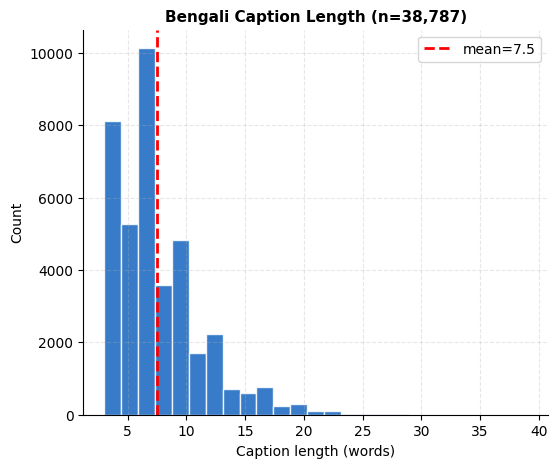

  Saved: preprocess_lengths_bn.png + .pdf


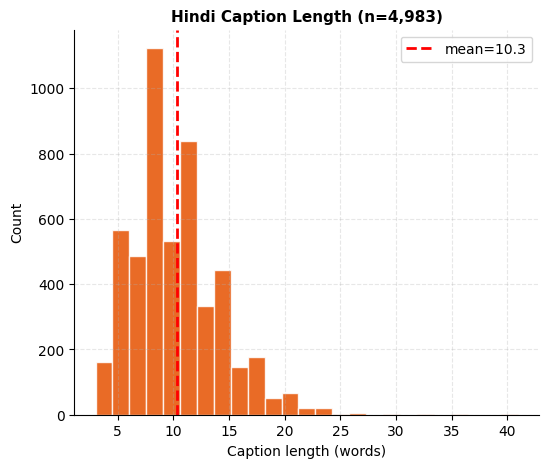

  Saved: preprocess_lengths_hi.png + .pdf


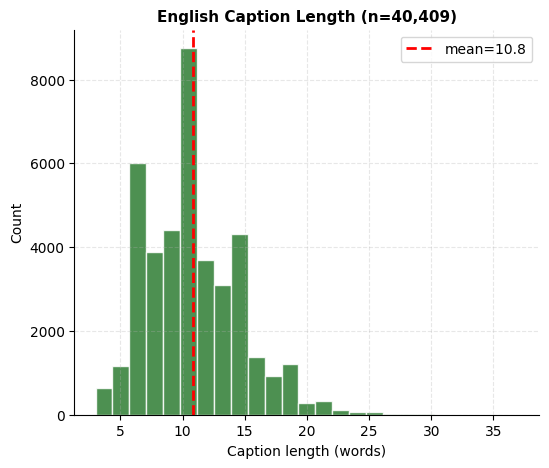

  Saved: preprocess_lengths_en.png + .pdf
Preprocessing figures saved.


In [7]:
# Cell 5 — Data loading utils & preprocessing
def normalise_bengali(text):
    text = unicodedata.normalize("NFC", text)
    text = text.replace("\u200c", "").replace("\u200d", "")
    text = re.sub(r"[\x00-\x08\x0b-\x0c\x0e-\x1f\x7f]", " ", text)
    return re.sub(r"\s+", " ", text).strip()

def normalise_hindi(text):
    text = unicodedata.normalize("NFC", text)
    text = text.replace("\u200c", "").replace("\u200d", "")
    text = re.sub(r"[\x00-\x08\x0b-\x0c\x0e-\x1f\x7f]", " ", text)
    return re.sub(r"\s+", " ", text).strip()

def normalise_english(text):
    text = text.lower().strip()
    text = re.sub(r"[^\w\s']", " ", text)
    return re.sub(r"\s+", " ", text).strip()

NORMALISE = {"bn": normalise_bengali, "hi": normalise_hindi, "en": normalise_english}
MIN_W, MAX_W = 3, 60

def is_valid(text, lang):
    n = NORMALISE[lang](text)
    return MIN_W <= len(n.split()) <= MAX_W and len(n) > 5

def _find_file(root, names):
    for n in names:
        p = Path(root) / n
        if p.exists(): return p
    for n in names:
        hits = list(Path(root).rglob(Path(n).name))
        if hits: return hits[0]
    return None

def _find_imgdir(root, cands):
    for n in cands:
        p = Path(root) / n
        if p.is_dir(): return p
    for p in sorted(Path(root).rglob("*.jpg")):
        return p.parent
    return Path(root)

def _smart_split(line):
    line = line.strip()
    if not line: return None
    if "\t" in line:
        parts = line.split("\t", 1)
        img = parts[0].split("#")[0].strip()
        cap = parts[1].strip() if len(parts) > 1 else ""
        return (img, cap) if cap else None
    m = re.match(r"^(\S+\.(?:jpg|jpeg|png)(?:#\d+)?)[,\s]\s*(.+)$", line, re.IGNORECASE)
    if m: return (m.group(1).split("#")[0].strip(), m.group(2).strip())
    return None

def _parse_file(path, img_dir, lang):
    records = []
    with open(path, encoding="utf-8") as f:
        for line in f:
            res = _smart_split(line)
            if res is None: continue
            img_name, cap_raw = res
            cap = NORMALISE[lang](cap_raw)
            if not is_valid(cap, lang): continue
            ip = img_dir / img_name
            if not ip.exists():
                hits = list(img_dir.rglob(img_name)); ip = hits[0] if hits else ip
            records.append({"image": str(ip), "caption": cap, "lang": lang})
    return records

def _parse_csv(path, img_dir, lang):
    records = []
    df = pd.read_csv(path)
    ic = next((c for c in df.columns if any(k in c.lower() for k in ["image","file","img"])), df.columns[0])
    cc = next((c for c in df.columns if any(k in c.lower() for k in ["caption","text","hindi","bangla"])), df.columns[1])
    for _, row in df.iterrows():
        cap = NORMALISE[lang](str(row[cc]).strip())
        if not cap or cap == "nan" or not is_valid(cap, lang): continue
        ip = img_dir / str(row[ic]).strip()
        if not ip.exists():
            hits = list(img_dir.rglob(str(row[ic]).strip())); ip = hits[0] if hits else ip
        records.append({"image": str(ip), "caption": cap, "lang": lang})
    return records

def load_dataset(root, lang, img_dirs, txt_names, csv_names=[]):
    root = Path(root)
    if not root.exists():
        print(f"[{lang.upper()}] WARNING: {root} not found"); return []
    img_dir  = _find_imgdir(root, img_dirs)
    cap_file = _find_file(root, txt_names) or _find_file(root, csv_names)
    if cap_file is None:
        raise FileNotFoundError(f"No caption file in {root}")
    print(f"[{lang.upper()}] img_dir={img_dir.name}  cap={cap_file.name}")
    recs  = _parse_file(cap_file, img_dir, lang) if cap_file.suffix != ".csv" \
            else _parse_csv(cap_file, img_dir, lang)
    valid = [r for r in recs if Path(r["image"]).exists()]
    seen, deduped = set(), []
    for r in valid:
        k = (r["image"], r["caption"])
        if k not in seen: seen.add(k); deduped.append(r)
    print(f"  Parsed:{len(recs)} → valid:{len(valid)} → deduped:{len(deduped)}")
    return deduped

print("Loading datasets...")
bnature = load_dataset(
    CFG.BNATURE_DIR, "bn", ["Pictures","Images","images"],
    ["caption/caption.txt","caption.txt","captions.txt"], ["caption.csv"])
flickr = load_dataset(
    CFG.FLICKR_DIR, "en", ["Images","images"],
    ["captions.txt","Flickr8k.token.txt"], ["captions.csv"])
pascal = load_dataset(
    CFG.PASCAL_DIR, "hi", ["Images","images","JPEGImages"],
    ["captions.txt","hindi_captions.txt","annotations.txt"], ["captions.csv"])

print(f"\nCounts: BN={len(bnature):,}  EN={len(flickr):,}  HI={len(pascal):,}")

# ── Separate caption-length-distribution figures (one per language) ──
for name, recs, col, lang in [
    ("Bengali", bnature, "#1565C0", "bn"),
    ("Hindi",   pascal,  "#E65100", "hi"),
    ("English", flickr,  "#2E7D32", "en"),
]:
    fig, ax = plt.subplots(figsize=(6,5))
    if not recs:
        ax.text(0.5,0.5,"No data",ha="center",transform=ax.transAxes)
    else:
        lens = [len(r["caption"].split()) for r in recs]
        ax.hist(lens, bins=25, color=col, edgecolor="white", alpha=0.85)
        ax.axvline(np.mean(lens), color="red", lw=2, ls="--", label=f"mean={np.mean(lens):.1f}")
        ax.legend()
    ax.set_title(f"{name} Caption Length (n={len(recs):,})", fontsize=11, fontweight="bold")
    ax.set_xlabel("Caption length (words)"); ax.set_ylabel("Count")
    ax.grid(alpha=0.3, ls="--"); ax.spines[["top","right"]].set_visible(False)
    save_show_dual(fig, f"{CFG.FIG_DIR}/preprocess_lengths_{lang}")
print("Preprocessing figures saved.")

# **Dataset Merge & Splits**

  [Bengali] Train:31,026 (6,398 imgs)  Val:3,873  Test:3,888
  [Hindi] Train:3,987 (800 imgs)  Val:499  Test:497
  [English] Train:32,326 (6,472 imgs)  Val:4,041  Test:4,042


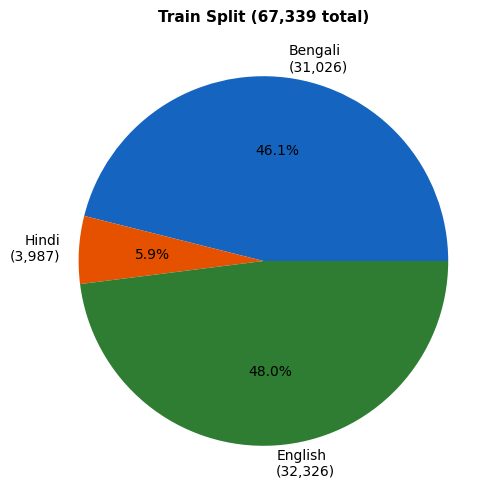

  Saved: dataset_split_train.png + .pdf


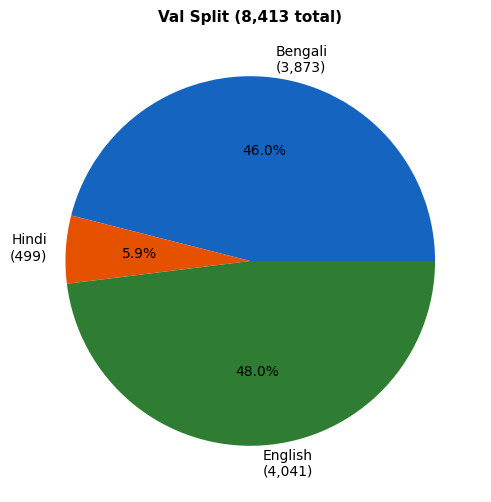

  Saved: dataset_split_val.png + .pdf


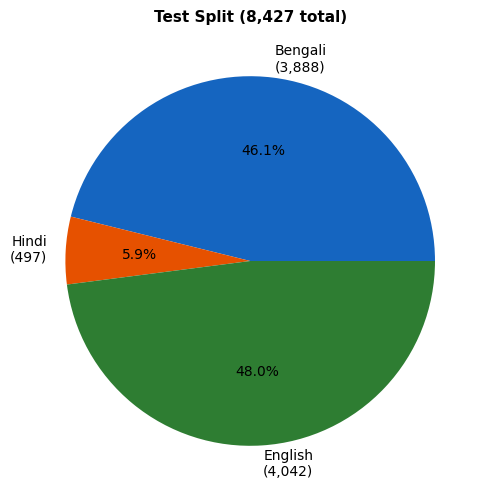

  Saved: dataset_split_test.png + .pdf
Split figures saved.


In [8]:
# Cell 6 — Dataset merge & splits
def split_by_image(records, train_r=0.80, val_r=0.10, seed=42):
    img2r = defaultdict(list)
    for r in records: img2r[r["image"]].append(r)
    imgs = sorted(img2r.keys()); random.Random(seed).shuffle(imgs)
    n = len(imgs); n_tr = int(n*train_r); n_va = int(n*val_r)
    tr = [r for img in imgs[:n_tr]           for r in img2r[img]]
    va = [r for img in imgs[n_tr:n_tr+n_va]  for r in img2r[img]]
    te = [r for img in imgs[n_tr+n_va:]      for r in img2r[img]]
    return tr, va, te

def build_img2caps(records):
    d = defaultdict(list)
    for r in records: d[r["image"]].append(r["caption"])
    return dict(d)

tr_bn, va_bn, te_bn = split_by_image(bnature, CFG.TRAIN_R, CFG.VAL_R, SEED)
tr_hi, va_hi, te_hi = split_by_image(pascal,  CFG.TRAIN_R, CFG.VAL_R, SEED)
tr_en, va_en, te_en = split_by_image(flickr,  CFG.TRAIN_R, CFG.VAL_R, SEED)

te_all         = te_bn + te_hi + te_en
te_bn_img2caps = build_img2caps(te_bn)
te_hi_img2caps = build_img2caps(te_hi)
te_en_img2caps = build_img2caps(te_en)
va_bn_img2caps = build_img2caps(va_bn)
va_hi_img2caps = build_img2caps(va_hi)
va_en_img2caps = build_img2caps(va_en)

for tag, recs in [
    ("tr_bn",tr_bn),("va_bn",va_bn),("te_bn",te_bn),
    ("tr_hi",tr_hi),("va_hi",va_hi),("te_hi",te_hi),
    ("tr_en",tr_en),("va_en",va_en),("te_en",te_en),
]:
    with open(f"{CFG.SPLIT_DIR}/{tag}.json","w",encoding="utf-8") as f:
        json.dump(recs, f, ensure_ascii=False)

for lang, (tr, va, te) in [
    ("Bengali",(tr_bn,va_bn,te_bn)),
    ("Hindi",  (tr_hi,va_hi,te_hi)),
    ("English",(tr_en,va_en,te_en)),
]:
    tr_imgs = len(set(r["image"] for r in tr))
    print(f"  [{lang}] Train:{len(tr):,} ({tr_imgs:,} imgs)  Val:{len(va):,}  Test:{len(te):,}")

# ── Separate split-composition pies (one per split) ──
for split_name, bn_r, hi_r, en_r in [
    ("train", tr_bn, tr_hi, tr_en),
    ("val",   va_bn, va_hi, va_en),
    ("test",  te_bn, te_hi, te_en),
]:
    fig, ax = plt.subplots(figsize=(6,6))
    sizes  = [len(bn_r), len(hi_r), len(en_r)]
    labels = [f"Bengali\n({len(bn_r):,})", f"Hindi\n({len(hi_r):,})", f"English\n({len(en_r):,})"]
    ax.pie(sizes, labels=labels, colors=["#1565C0","#E65100","#2E7D32"], autopct="%1.1f%%")
    ax.set_title(f"{split_name.capitalize()} Split ({sum(sizes):,} total)", fontsize=11, fontweight="bold")
    save_show_dual(fig, f"{CFG.FIG_DIR}/dataset_split_{split_name}")
print("Split figures saved.")

# **Batched embedding precompute(ViT-L/14) and Augmentation**

Loading CLIP ViT-L/14 ...


open_clip_model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

  CLIP CLS dim: 768
  Total images: 17,089  To compute: 17,089
  [   64/17089] 0.1min ETA:14.4min
  [ 1984/17089] 1.8min ETA:13.6min
  [ 3904/17089] 3.7min ETA:12.6min
  [ 5824/17089] 5.7min ETA:11.0min
  [ 7744/17089] 7.7min ETA:9.3min
  [ 9664/17089] 9.7min ETA:7.4min
  [11584/17089] 11.7min ETA:5.5min
  [13504/17089] 13.6min ETA:3.6min
  [15424/17089] 15.6min ETA:1.7min

  Cached: 17,089  Failed: 0


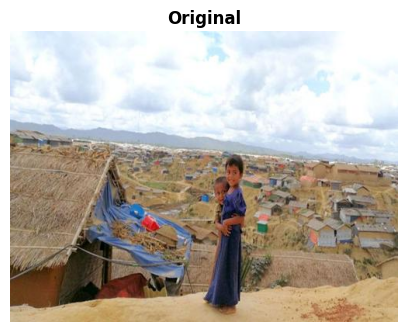

  Saved: augmentation_original.png + .pdf


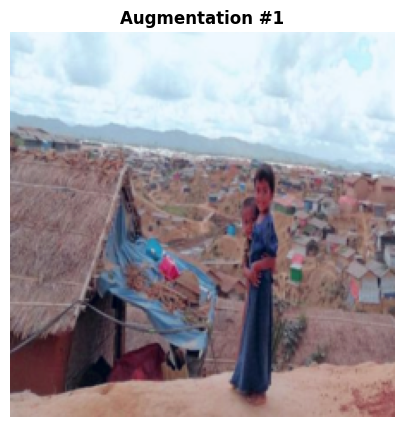

  Saved: augmentation_1.png + .pdf


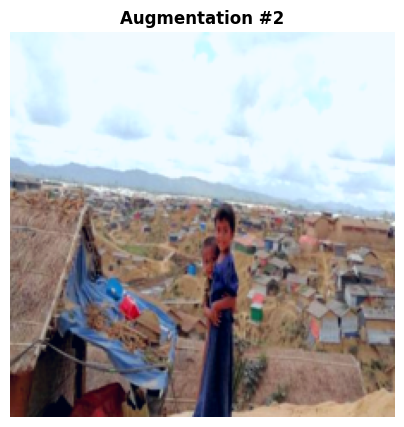

  Saved: augmentation_2.png + .pdf


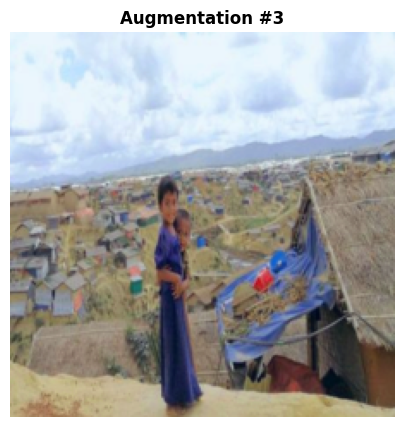

  Saved: augmentation_3.png + .pdf


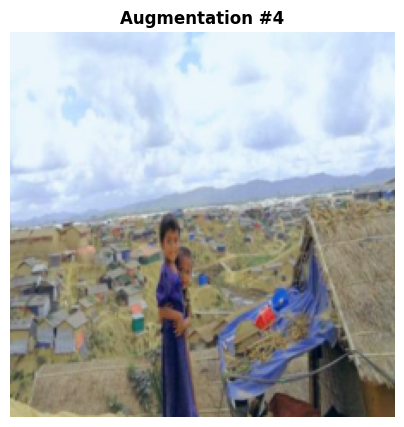

  Saved: augmentation_4.png + .pdf

GLOBAL_START set. Timeout at 10.5h.


In [9]:
# Cell 7 — Batched embedding precompute (ViT-L/14) and augmentation
CLIP_MEAN = [0.48145466, 0.4578275, 0.40821073]
CLIP_STD  = [0.26862954, 0.26130258, 0.27577711]

TFM_EVAL = transforms.Compose([
    transforms.Resize((CFG.IMG_SIZE, CFG.IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(CLIP_MEAN, CLIP_STD),
])

def get_emb_path(img_path):
    return Path(CFG.EMBED_DIR) / f"{Path(img_path).stem}.pt"

print("Loading CLIP ViT-L/14 ...")
gc.collect(); torch.cuda.empty_cache()
clip_model_full, _, _ = open_clip.create_model_and_transforms(
    CFG.CLIP_MODEL, pretrained=CFG.CLIP_PRETRAINED)
clip_model_full = clip_model_full.to(DEVICE).eval()
for p in clip_model_full.parameters():
    p.requires_grad_(False)

with torch.no_grad():
    _t = torch.zeros(1, 3, CFG.IMG_SIZE, CFG.IMG_SIZE).to(DEVICE)
    _f = clip_model_full.encode_image(_t)
    CFG.CLIP_DIM = _f.shape[-1]
    print(f"  CLIP CLS dim: {CFG.CLIP_DIM}")
del _t, _f; gc.collect()

all_records = bnature + flickr + pascal
all_imgs    = list(set(r["image"] for r in all_records))
to_process  = [p for p in all_imgs if Path(p).exists() and not get_emb_path(p).exists()]
print(f"  Total images: {len(all_imgs):,}  To compute: {len(to_process):,}")

EMBED_BATCH = 64; failed = 0; t0 = time.time()
for i in range(0, len(to_process), EMBED_BATCH):
    batch = to_process[i:i+EMBED_BATCH]; imgs = []; valid = []
    for p in batch:
        try:
            img = Image.open(p).convert("RGB"); imgs.append(TFM_EVAL(img)); valid.append(p)
        except Exception: pass
    if not imgs: failed += len(batch); continue
    with torch.no_grad():
        tensor = torch.stack(imgs).to(DEVICE)
        feats  = clip_model_full.encode_image(tensor).cpu().float()
    for pth, feat in zip(valid, feats):
        torch.save(feat, str(get_emb_path(pth)))
    failed += len(batch) - len(valid)
    if (i // EMBED_BATCH) % 30 == 0:
        done    = min(i + EMBED_BATCH, len(to_process))
        elapsed = (time.time() - t0) / 60
        eta     = (len(to_process) - done) / max(done, 1) * elapsed
        print(f"  [{done:5d}/{len(to_process):5d}] {elapsed:.1f}min ETA:{eta:.1f}min")

cached = len(list(Path(CFG.EMBED_DIR).glob("*.pt")))
print(f"\n  Cached: {cached:,}  Failed: {failed}")

# ── Separate augmentation figures (original + 4 augmented, one PNG+PDF each) ──
_sp = next((r["image"] for r in all_records if Path(r["image"]).exists()), None)
if _sp:
    TFM_AUG = transforms.Compose([
        transforms.Resize((CFG.IMG_SIZE+32, CFG.IMG_SIZE+32)),
        transforms.RandomCrop(CFG.IMG_SIZE), transforms.RandomHorizontalFlip(0.5),
        transforms.ColorJitter(0.2, 0.2, 0.2, 0.05), transforms.ToTensor(),
        transforms.Normalize(CLIP_MEAN, CLIP_STD),
    ])
    pil = Image.open(_sp).convert("RGB")

    fig, ax = plt.subplots(figsize=(5,5))
    ax.imshow(pil); ax.set_title("Original", fontweight="bold"); ax.axis("off")
    save_show_dual(fig, f"{CFG.FIG_DIR}/augmentation_original")

    for idx in range(1, 5):
        aug = TFM_AUG(pil)
        aug = (aug - aug.min()) / (aug.max() - aug.min() + 1e-8)
        fig, ax = plt.subplots(figsize=(5,5))
        ax.imshow(aug.permute(1, 2, 0).numpy())
        ax.set_title(f"Augmentation #{idx}", fontweight="bold"); ax.axis("off")
        save_show_dual(fig, f"{CFG.FIG_DIR}/augmentation_{idx}")

del clip_model_full; gc.collect(); torch.cuda.empty_cache()
GLOBAL_START = time.time()
print(f"\nGLOBAL_START set. Timeout at {CFG.TIMEOUT_H}h.")

# **Tokenizer and Dataloaders**

In [10]:
# Cell 8 — Tokenizer and DataLoaders
from transformers import AutoTokenizer

tokenizers = {}
for lang, model_id in CFG.DECODER.items():
    tok = AutoTokenizer.from_pretrained(model_id)
    if tok.pad_token is None:
        tok.pad_token = tok.eos_token
    tokenizers[lang] = tok
    print(f"  [{lang}] vocab={len(tok):,}  pad={tok.pad_token_id}  eos={tok.eos_token_id}")

assert tokenizers["bn"].eos_token_id == 2, \
    f"BanglaGPT EOS should be 2, got {tokenizers['bn'].eos_token_id}"
print("  BanglaGPT EOS=2 verified.")


class CaptionDataset(Dataset):
    def __init__(self, records, lang, max_len=CFG.MAX_SEQ):
        tok = tokenizers[lang]
        self.recs = [r for r in records
                     if r["lang"] == lang and get_emb_path(r["image"]).exists()]
        missing = len([r for r in records if r["lang"] == lang]) - len(self.recs)
        if missing: print(f"  [{lang}] Skipped {missing} missing embeddings")
        self.tok = tok; self.max_len = max_len; self.lang = lang

    def __len__(self): return len(self.recs)

    def __getitem__(self, idx):
        r = self.recs[idx]
        try:
            emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
        except Exception:
            emb = torch.zeros(CFG.CLIP_DIM)
        enc = self.tok(r["caption"], max_length=self.max_len,
                       padding="max_length", truncation=True, return_tensors="pt")
        input_ids = enc.input_ids.squeeze(0)
        labels    = input_ids.clone()
        labels[labels == self.tok.pad_token_id] = -100
        return emb, input_ids, labels

    def collate(self, batch):
        embs, ids, labs = zip(*batch)
        return torch.stack(embs), torch.stack(ids), torch.stack(labs)


kw_tr = dict(shuffle=True,  num_workers=2, pin_memory=True, drop_last=True,  batch_size=CFG.BATCH)
kw_ev = dict(shuffle=False, num_workers=2, pin_memory=True, batch_size=CFG.BATCH)

datasets = {}
for lang in ["bn", "hi", "en"]:
    tr_recs = {"bn":tr_bn,"hi":tr_hi,"en":tr_en}[lang]
    va_recs = {"bn":va_bn,"hi":va_hi,"en":va_en}[lang]
    te_recs = {"bn":te_bn,"hi":te_hi,"en":te_en}[lang]
    tr_ds = CaptionDataset(tr_recs, lang); va_ds = CaptionDataset(va_recs, lang)
    te_ds = CaptionDataset(te_recs, lang)
    tr_dl = DataLoader(tr_ds, **kw_tr, collate_fn=tr_ds.collate)
    va_dl = DataLoader(va_ds, **kw_ev, collate_fn=va_ds.collate)
    te_dl = DataLoader(te_ds, **kw_ev, collate_fn=te_ds.collate)
    datasets[lang] = {"tr_ds":tr_ds,"va_ds":va_ds,"te_ds":te_ds,
                      "tr_dl":tr_dl,"va_dl":va_dl,"te_dl":te_dl}
    print(f"  [{lang}] train:{len(tr_ds):,}  val:{len(va_ds):,}  test:{len(te_ds):,}")

print("DataLoaders ready.")

config.json:   0%|          | 0.00/898 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

added_tokens.json:   0%|          | 0.00/47.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/692 [00:00<?, ?B/s]

  [bn] vocab=50,002  pad=1  eos=2


config.json:   0%|          | 0.00/597 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/87.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

added_tokens.json:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/120 [00:00<?, ?B/s]

  [hi] vocab=50,258  pad=50257  eos=50257


config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

  [en] vocab=50,257  pad=50256  eos=50256
  BanglaGPT EOS=2 verified.
  [bn] train:31,026  val:3,873  test:3,888
  [hi] train:3,987  val:499  test:497
  [en] train:32,326  val:4,041  test:4,042
DataLoaders ready.


# **Models**

In [11]:
# Cell 9 — Models
from transformers import AutoModelForCausalLM
import re as _re


def _clean_caption(text, lang):
    if not text or not text.strip():
        return "."
    text = text.strip().split("\n")[0].strip()

    if lang == "bn":
        parts = [p.strip() for p in text.split("।") if p.strip()]
        if parts:
            out = parts[0].strip()
            if len(out.split()) >= 3:
                return out + "।"
        return text if len(text.split()) >= 3 else "."

    elif lang == "hi":
        parts = [p.strip() for p in text.split("।") if p.strip()]
        if parts and len(parts[0].split()) >= 3:
            return parts[0].strip() + "।"
        parts2 = [p.strip() for p in text.split(".") if p.strip()]
        if parts2 and len(parts2[0].split()) >= 3:
            return parts2[0].strip() + "."
        return text if len(text.split()) >= 3 else "."

    else:
        m = _re.match(r'^([^.!?]+[.!?])', text)
        if m:
            words = m.group(1).split()
            if 3 <= len(words) <= 15:
                return m.group(1).strip()
        words = text.split()
        if len(words) > 15:
            return " ".join(words[:15]) + "."
        return text.rstrip(".") + "." if text else "."


class MLP(nn.Module):
    def __init__(self, clip_dim, gpt2_dim, prefix_len, hidden=CFG.MLP_HIDDEN):
        super().__init__()
        self.prefix_len = prefix_len
        self.out_dim    = prefix_len * gpt2_dim
        self.fc1 = nn.Linear(clip_dim, hidden)
        self.act  = nn.Tanh()
        self.fc2  = nn.Linear(hidden, self.out_dim)
        nn.init.normal_(self.fc1.weight, 0, 0.02)
        nn.init.zeros_(self.fc1.bias)
        nn.init.normal_(self.fc2.weight, 0, 0.02)
        nn.init.zeros_(self.fc2.bias)

    def forward(self, x):
        return self.fc2(self.act(self.fc1(x))).view(x.size(0), self.prefix_len, -1)


class CLIPCapModel(nn.Module):
    def __init__(self, lang, clip_dim=CFG.CLIP_DIM, prefix_len=CFG.PREFIX_LEN,
                 mlp_frozen=False):
        super().__init__()
        self.lang        = lang
        self.prefix_len  = prefix_len
        self.mlp_frozen  = mlp_frozen
        tok              = tokenizers[lang]
        self.pad_id      = tok.pad_token_id
        self.eos_id      = tok.eos_token_id

        print(f"  [{lang}] Loading {CFG.DECODER[lang]} ...")
        self.gpt2 = AutoModelForCausalLM.from_pretrained(
            CFG.DECODER[lang], dtype=torch.float32).to(DEVICE)
        self.gpt2.resize_token_embeddings(len(tok))

        gpt2_dim    = self.gpt2.config.hidden_size
        self.mapper = MLP(clip_dim, gpt2_dim, prefix_len).to(DEVICE)

        if mlp_frozen:
            for p in self.mapper.parameters():
                p.requires_grad_(False)
            print(f"  [{lang}] MLP frozen.")
        else:
            print(f"  [{lang}] MLP trainable (warmup phase).")

        tr  = sum(p.numel() for p in self.parameters() if p.requires_grad)
        tot = sum(p.numel() for p in self.parameters())
        print(f"  [{lang}] Total:{tot/1e6:.1f}M  Trainable:{tr/1e6:.1f}M")

    def freeze_mlp(self):
        for p in self.mapper.parameters():
            p.requires_grad_(False)
        self.mlp_frozen = True

    def _get_prefix_embeds(self, clip_emb):
        return self.mapper(clip_emb.to(DEVICE).float())

    def forward(self, clip_emb, input_ids, labels):
        B          = clip_emb.size(0)
        prefix     = self._get_prefix_embeds(clip_emb)
        tok_embeds = self.gpt2.get_input_embeddings()(input_ids.to(DEVICE))
        inputs_embeds = torch.cat([prefix, tok_embeds], dim=1)
        prefix_labs = torch.full((B, self.prefix_len), -100,
                                  dtype=labels.dtype, device=DEVICE)
        full_labels = torch.cat([prefix_labs, labels.to(DEVICE)], dim=1)
        return self.gpt2(inputs_embeds=inputs_embeds, labels=full_labels).loss

    @torch.no_grad()
    def generate(self, clip_emb, beam=None):
        if beam is None:
            beam = CFG.BEST_BEAM.get(self.lang, 5)
        rep_pen  = CFG.REPETITION_PENALTY.get(self.lang, 1.0)
        no_rep   = CFG.NO_REPEAT_NGRAM.get(self.lang, 0)
        max_new  = CFG.GEN_MAX_NEW_TOKENS.get(self.lang, 40)
        self.eval()
        if clip_emb.dim() == 1:
            clip_emb = clip_emb.unsqueeze(0)
        prefix    = self._get_prefix_embeds(clip_emb)
        attn_mask = torch.ones(prefix.shape[:2], dtype=torch.long, device=DEVICE)
        out = self.gpt2.generate(
            inputs_embeds        = prefix,
            attention_mask       = attn_mask,
            max_new_tokens       = max_new,
            min_length           = 4,
            num_beams            = beam,
            no_repeat_ngram_size = no_rep,
            repetition_penalty   = rep_pen,
            length_penalty       = CFG.LENGTH_PENALTY,
            early_stopping       = True,
            pad_token_id         = self.pad_id,
            eos_token_id         = self.eos_id,
        )
        text = tokenizers[self.lang].decode(out[0], skip_special_tokens=True).strip()
        return _clean_caption(text, self.lang)


print("=" * 60)
print("Building three CLIPCap models (MLP trainable at init)")
print("=" * 60)
gc.collect(); torch.cuda.empty_cache()
models = {}
for lang in ["bn", "hi", "en"]:
    models[lang] = CLIPCapModel(lang, mlp_frozen=False)
    _emb  = torch.zeros(2, CFG.CLIP_DIM).to(DEVICE)
    _ids  = torch.ones(2, CFG.MAX_SEQ, dtype=torch.long).to(DEVICE)
    _labs = _ids.clone(); _labs[:, 20:] = -100
    with torch.no_grad():
        _loss = models[lang](_emb, _ids, _labs)
    print(f"  [{lang}] Forward OK. loss={_loss.item():.4f}")
    del _emb, _ids, _labs, _loss
gc.collect(); torch.cuda.empty_cache()
print("All models ready.")

Building three CLIPCap models (MLP trainable at init)
  [bn] Loading shahidul034/BanglaGPT ...


model.safetensors:   0%|          | 0.00/497M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/111 [00:00<?, ?B/s]

`loss_type=None` was set in the config but it is unrecognized. Using the default loss: `ForCausalLMLoss`.


  [bn] MLP trainable (warmup phase).
  [bn] Total:141.6M  Trainable:141.6M
  [bn] Forward OK. loss=13.4003
  [hi] Loading surajp/gpt2-hindi ...


model.safetensors:   0%|          | 0.00/334M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

GPT2LMHeadModel LOAD REPORT from: surajp/gpt2-hindi
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
transformer.h.{0, 1, 2, 3, 4, 5}.attn.bias        | UNEXPECTED |  | 
transformer.h.{0, 1, 2, 3, 4, 5}.attn.masked_bias | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`


  [hi] MLP trainable (warmup phase).
  [hi] Total:99.2M  Trainable:99.2M
  [hi] Forward OK. loss=5.7422
  [en] Loading gpt2 ...


model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

GPT2LMHeadModel LOAD REPORT from: gpt2
Key                  | Status     |  | 
---------------------+------------+--+-
h.{0...11}.attn.bias | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

  [en] MLP trainable (warmup phase).
  [en] Total:141.8M  Trainable:141.8M
  [en] Forward OK. loss=16.3003
All models ready.


# **Metric functions**

In [12]:
# Cell 10 — Metric functions
from nltk.translate.bleu_score import corpus_bleu as nltk_corpus_bleu
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score as nltk_meteor
from rouge_score import rouge_scorer as rouge_lib
from bert_score import score as bert_score_fn
from sacrebleu.metrics import BLEU as SacreBLEU

try:
    from pycocoevalcap.cider.cider import Cider as _CiderBase
    _has_cider = True; print("CIDEr available.")
except Exception as e:
    _has_cider = False; print(f"CIDEr not available: {e}")

print("Warming up BERTScore ...")
try:
    bert_score_fn(["a dog"], ["a cat"], lang="en", model_type="roberta-large",
                  verbose=False, batch_size=4)
    print("  BERTScore ready.")
except Exception as e:
    print(f"  BERTScore warmup: {e}")


def compute_bleu_nltk(refs_per, hyps, n=4):
    if not hyps: return 0.
    weights = tuple([1.0/n] * n)
    try:
        list_of_refs = [[r.split() for r in rl] for rl in refs_per]
        list_of_hyps = [h.split() for h in hyps]
        score = nltk_corpus_bleu(list_of_refs, list_of_hyps, weights=weights)
        return float(score * 100)
    except Exception: return 0.

def compute_bleu_sacre(refs_per, hyps, n=4):
    if not hyps: return 0.
    max_r  = max(len(r) for r in refs_per)
    refs_T = [[refs_per[j][min(ri, len(refs_per[j])-1)] for j in range(len(refs_per))]
               for ri in range(max_r)]
    try:
        return SacreBLEU(max_ngram_order=n, effective_order=True).corpus_score(hyps, refs_T).score
    except Exception: return 0.

def compute_meteor(refs_per, hyps):
    sc = []
    for rl, h in zip(refs_per, hyps):
        ht = h.split()
        if not ht or not rl: sc.append(0.); continue
        sc.append(max(
            (nltk_meteor([r.split()], ht) for r in rl if r.split()),
            default=0.
        ))
    return float(np.mean(sc) * 100) if sc else 0.

def compute_rougeL(refs_per, hyps, lang="en"):
    if lang in ("bn", "hi"):
        def _lcs(s1, s2):
            s1 = list(s1.replace(" ", "")); s2 = list(s2.replace(" ", ""))
            if not s1 or not s2: return 0
            prev = [0] * (len(s2) + 1)
            for a in s1:
                curr = [0] * (len(s2) + 1)
                for j, b in enumerate(s2, 1):
                    curr[j] = prev[j-1]+1 if a == b else max(curr[j-1], prev[j])
                prev = curr
            return prev[len(s2)]
        sc = []
        for rl, h in zip(refs_per, hyps):
            if not h.strip() or not rl: sc.append(0.); continue
            best = 0.
            for r in rl:
                if not r.strip(): continue
                lcs = _lcs(r, h)
                p   = lcs / max(len(h.replace(" ", "")), 1)
                rc  = lcs / max(len(r.replace(" ", "")), 1)
                f   = 2*p*rc / (p+rc) if (p+rc) > 0 else 0.
                best = max(best, f)
            sc.append(best)
        return float(np.mean(sc) * 100) if sc else 0.
    else:
        s = rouge_lib.RougeScorer(["rougeL"], use_stemmer=False)
        sc = []
        for rl, h in zip(refs_per, hyps):
            if not h.strip() or not rl: sc.append(0.); continue
            best = max(
                (s.score(r, h)["rougeL"].fmeasure for r in rl if r.strip()),
                default=0.
            )
            sc.append(best)
        return float(np.mean(sc) * 100) if sc else 0.

def compute_bertscore(refs, hyps, lang="en"):
    if not refs: return 0.
    model_type = "bert-base-multilingual-cased" if lang in ("bn","hi") else "roberta-large"
    try:
        _, _, F = bert_score_fn(hyps, refs, lang=lang, model_type=model_type,
                                verbose=False, batch_size=8, device=str(DEVICE))
        return float(F.mean().item() * 100)
    except Exception:
        try:
            _, _, F = bert_score_fn(hyps, refs, lang="en", model_type="roberta-large",
                                    verbose=False, batch_size=8, device=str(DEVICE))
            return float(F.mean().item() * 100)
        except Exception: return 0.

def compute_cider(img_ids, refs_d, hyps_d):
    if not _has_cider or not img_ids: return 0.
    try:
        sc, _ = _CiderBase().compute_score(
            {i: refs_d[i] for i in img_ids},
            {i: [hyps_d[i]] for i in img_ids}
        )
        return float(sc * 100)
    except Exception: return 0.

def compute_token_prf(refs_per, hyps):
    p_all, r_all, f_all = [], [], []
    for rl, h in zip(refs_per, hyps):
        ht = set(h.split())
        if not ht or not rl: continue
        best_r = max(rl, key=lambda rv: len(set(rv.split()) & ht) / max(len(set(rv.split())), 1))
        rt = set(best_r.split())
        if not rt: continue
        inter = rt & ht
        p  = len(inter) / max(len(ht), 1)
        rc = len(inter) / max(len(rt), 1)
        f  = 2*p*rc / (p+rc) if (p+rc) > 0 else 0.
        p_all.append(p); r_all.append(rc); f_all.append(f)
    if not p_all: return 0., 0., 0.
    return (float(np.mean(p_all)*100),
            float(np.mean(r_all)*100),
            float(np.mean(f_all)*100))

def compute_sent_bleu4(refs, hyp):
    sf = SmoothingFunction().method1
    try:
        list_refs = [r.split() for r in refs if r.strip()]
        return float(sentence_bleu(list_refs, hyp.split(),
                                    weights=(0.25, 0.25, 0.25, 0.25),
                                    smoothing_function=sf) * 100)
    except Exception: return 0.

print("All metric functions ready.")
print(f"  NO_REPEAT_NGRAM per lang: {CFG.NO_REPEAT_NGRAM}")

CIDEr available.
Warming up BERTScore ...


config.json:   0%|          | 0.00/482 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.42G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/389 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-large
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  BERTScore ready.
All metric functions ready.
  NO_REPEAT_NGRAM per lang: {'bn': 0, 'hi': 0, 'en': 2}


# **Reusable Training Function**

In [13]:
# Cell 11 — Reusable training function
_best_paths  = {"bn": "", "hi": "", "en": ""}
_epoch_pools = {"bn": [], "hi": [], "en": []}

def _write_ckpt(model, path):
    torch.save({
        "mapper":     model.mapper.state_dict(),
        "gpt2":       model.gpt2.state_dict(),
        "lang":       model.lang,
        "prefix_len": model.prefix_len,
        "mlp_frozen": model.mlp_frozen,
    }, path)

def save_best(model, path):
    _write_ckpt(model, path)
    _best_paths[model.lang] = path
    print(f"  [BEST] [{model.lang}] {Path(path).name}")

def save_epoch(model, path, ep):
    lang = model.lang
    _write_ckpt(model, path)
    _epoch_pools[lang].append((ep, path))
    non_ep1 = [(e, p) for e, p in _epoch_pools[lang] if e != 1]
    while len(non_ep1) > CFG.MAX_CKPT:
        ep_i, old = non_ep1.pop(0)
        if old == _best_paths[lang]: continue
        if os.path.exists(old): os.remove(old)
    _epoch_pools[lang] = [(e, p) for e, p in _epoch_pools[lang] if e == 1 or os.path.exists(p)]

def load_ckpt(model, path):
    if not Path(path).exists():
        print(f"  WARNING: {path} not found"); return False
    ck = torch.load(path, map_location="cpu", weights_only=True)
    model.mapper.load_state_dict(ck["mapper"])
    model.gpt2.load_state_dict(ck["gpt2"])
    if ck.get("mlp_frozen", False):
        model.freeze_mlp()
    del ck; gc.collect()
    print(f"  Loaded: {Path(path).name}")
    return True

def make_optimizer(model):
    trainable = [p for p in model.parameters() if p.requires_grad]
    return AdamW(trainable, lr=CFG.LR, weight_decay=CFG.WEIGHT_DECAY,
                 eps=1e-8, betas=(0.9, 0.98))

def make_scheduler(opt, total_steps):
    warmup = min(CFG.WARMUP_STEPS, total_steps // 2)
    mf     = CFG.LR_MIN
    def f(step):
        if step < warmup:
            return (step + 1) / max(warmup, 1)
        p = (step - warmup) / max(total_steps - warmup, 1)
        return mf + (1 - mf) * 0.5 * (1 + math.cos(math.pi * p))
    return torch.optim.lr_scheduler.LambdaLR(opt, f), warmup

def train_one_epoch(model, dl, opt, sched, grad_accum, step_ctr):
    model.train()
    total_loss = 0.; total_tok = 0
    opt.zero_grad(set_to_none=True)
    for step, (embs, ids, labs) in enumerate(dl):
        try:
            loss = model(embs.to(DEVICE), ids.to(DEVICE), labs.to(DEVICE))
            if torch.isnan(loss) or torch.isinf(loss):
                opt.zero_grad(set_to_none=True); continue
            (loss / grad_accum).backward()
            n = (labs != -100).sum().item()
            total_loss += loss.item() * n; total_tok += n
        except RuntimeError as e:
            if "out of memory" in str(e).lower():
                opt.zero_grad(set_to_none=True)
                gc.collect(); torch.cuda.empty_cache(); continue
            raise
        if (step + 1) % grad_accum == 0 or (step + 1) == len(dl):
            nn.utils.clip_grad_norm_(model.parameters(), CFG.GRAD_CLIP)
            opt.step(); opt.zero_grad(set_to_none=True); sched.step()
            step_ctr += 1
        if (step + 1) % 200 == 0:
            print(f"    [{model.lang}] step {step+1}/{len(dl)}"
                  f"  loss={total_loss/max(total_tok,1):.4f}"
                  f"  lr={opt.param_groups[0]['lr']:.2e}"
                  f"  {(time.time()-GLOBAL_START)/3600:.2f}h")
    return total_loss / max(total_tok, 1), step_ctr

@torch.no_grad()
def eval_loss(model, dl):
    model.eval(); vl = 0.; vt = 0
    for embs, ids, labs in dl:
        try:
            loss = model(embs.to(DEVICE), ids.to(DEVICE), labs.to(DEVICE))
            if torch.isnan(loss) or torch.isinf(loss): continue
            n = (labs != -100).sum().item()
            vl += loss.item() * n; vt += n
        except RuntimeError as e:
            if "out of memory" in str(e).lower():
                gc.collect(); torch.cuda.empty_cache(); continue
            raise
    return vl / max(vt, 1)

@torch.no_grad()
def sample_preds(model, records, n=2, tag=""):
    model.eval()
    print(f"\n  {'─'*50} [{tag}]")
    pool  = [r for r in records
             if r["lang"] == model.lang and get_emb_path(r["image"]).exists()]
    picks = random.sample(pool, min(n, len(pool)))
    for r in picks:
        try:
            emb = torch.load(str(get_emb_path(r["image"])),
                              map_location="cpu", weights_only=True).float()
            gen = model.generate(emb)
        except Exception as e:
            gen = f"[ERR:{e}]"
        print(f"  Ref: {r['caption'][:80]}")
        print(f"  Gen: {gen[:80]}")
    print()

@torch.no_grad()
def quick_eval(model, records, val_img2caps, lang, n=CFG.EPOCH_EVAL_N):
    model.eval()
    pool  = [r for r in records
             if r["lang"] == lang and get_emb_path(r["image"]).exists()]
    picks = random.Random(42).sample(pool, min(n, len(pool)))
    seen  = set(); unique_imgs = []
    for r in picks:
        if r["image"] not in seen:
            seen.add(r["image"]); unique_imgs.append(r)
    if not unique_imgs: return {}

    hyps = []; refs_per = []; img_ids = []; refs_d = {}; hyps_d = {}
    for r in unique_imgs:
        try:
            emb = torch.load(str(get_emb_path(r["image"])),
                              map_location="cpu", weights_only=True).float()
            gen = model.generate(emb)
        except Exception:
            gen = "."
        gen = gen or "."
        all_refs = val_img2caps.get(r["image"], [r["caption"]])
        hyps.append(gen); refs_per.append(all_refs)
        img_ids.append(r["image"])
        refs_d[r["image"]] = all_refs; hyps_d[r["image"]] = gen

    diversity = len(set(hyps)) / len(hyps)
    print(f"  [{lang}] n={len(hyps)}"
          f"  Diversity:{len(set(hyps))}/{len(hyps)} ({diversity:.0%})")
    if diversity < 0.5:
        print(f"  WARNING: Low diversity")

    best_refs = [rp[0] for rp in refs_per]
    p, rc, f  = compute_token_prf(refs_per, hyps)
    bs        = compute_bertscore(best_refs, hyps, lang=lang)
    nltk_b4   = compute_bleu_nltk(refs_per, hyps, 4)
    sacre_b4  = compute_bleu_sacre(refs_per, hyps, 4)

    return {
        "BLEU-1":       compute_bleu_nltk(refs_per, hyps, 1),
        "BLEU-2":       compute_bleu_nltk(refs_per, hyps, 2),
        "BLEU-3":       compute_bleu_nltk(refs_per, hyps, 3),
        "BLEU-4":       nltk_b4,
        "BLEU-4-sacre": sacre_b4,
        "METEOR":       compute_meteor(refs_per, hyps),
        "ROUGE-L":      compute_rougeL(refs_per, hyps, lang),
        "CIDEr":        compute_cider(img_ids, refs_d, hyps_d),
        "BERTScore-F1": bs,
        "Precision": p, "Recall": rc, "F1": f,
        "N": len(unique_imgs),
    }

print("Training utilities ready.")

Training utilities ready.


# **Main Training**


  [BN] MLP WARMUP: 1 epoch(s) with MLP trainable...
    [bn] step 200/3878  loss=2.4536  lr=1.05e-06  0.02h
    [bn] step 400/3878  loss=2.2633  lr=2.09e-06  0.04h
    [bn] step 600/3878  loss=2.0963  lr=3.12e-06  0.05h
    [bn] step 800/3878  loss=1.9724  lr=4.15e-06  0.06h
    [bn] step 1000/3878  loss=1.8848  lr=5.19e-06  0.07h
    [bn] step 1200/3878  loss=1.8148  lr=6.22e-06  0.08h
    [bn] step 1400/3878  loss=1.7609  lr=7.25e-06  0.10h
    [bn] step 1600/3878  loss=1.7162  lr=8.29e-06  0.11h
    [bn] step 1800/3878  loss=1.6786  lr=9.32e-06  0.12h
    [bn] step 2000/3878  loss=1.6463  lr=9.98e-06  0.13h
    [bn] step 2200/3878  loss=1.6172  lr=9.59e-06  0.14h
    [bn] step 2400/3878  loss=1.5912  lr=8.79e-06  0.16h
    [bn] step 2600/3878  loss=1.5678  lr=7.64e-06  0.17h
    [bn] step 2800/3878  loss=1.5471  lr=6.27e-06  0.18h
    [bn] step 3000/3878  loss=1.5287  lr=4.82e-06  0.19h
    [bn] step 3200/3878  loss=1.5110  lr=3.44e-06  0.20h
    [bn] step 3400/3878  loss=1.4957  l

config.json:   0%|          | 0.00/625 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/714M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=10.16  sacre B4=10.19  B1=44.84  METEOR=28.66  CIDEr=25.47

  ────────────────────────────────────────────────── [BN Ep1]
  Ref: জলাশয়ে দুইটি নৌকায় কয়েকজন মানুষ আছে।
  Gen: একটি নৌকায় কয়েকজন মানুষ আছে।
  Ref: একজন মানুষ মাইকে গান গাচ্ছে।
  Gen: একজন পুরুষ দাড়িয়ে আছে।

  [BEST] [bn] clipcap_bn_best.pt
  New best NLTK BLEU-4=10.16
    [bn] step 200/3878  loss=1.1737  lr=4.21e-06  0.52h
    [bn] step 400/3878  loss=1.1837  lr=4.42e-06  0.53h
    [bn] step 600/3878  loss=1.1831  lr=4.63e-06  0.55h
    [bn] step 800/3878  loss=1.1815  lr=4.83e-06  0.56h
    [bn] step 1000/3878  loss=1.1822  lr=5.04e-06  0.57h
    [bn] step 1200/3878  loss=1.1824  lr=5.24e-06  0.58h
    [bn] step 1400/3878  loss=1.1811  lr=5.45e-06  0.59h
    [bn] step 1600/3878  loss=1.1785  lr=5.66e-06  0.60h
    [bn] step 1800/3878  loss=1.1775  lr=5.86e-06  0.62h
    [bn] step 2000/3878  loss=1.1760  lr=6.07e-06  0.63h
    [bn] step 2200/3878  loss=1.1763  lr=6.28e-06  0.64h
    [bn] step 2400/3878  loss

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=11.54  sacre B4=11.67  B1=44.85  METEOR=28.40  CIDEr=29.61

  ────────────────────────────────────────────────── [BN Ep2]
  Ref: তিনজন শিশু মাঠে দাড়িয়ে আছে।
  Gen: দুইজন মানুষ দেখা যাচ্ছে।
  Ref: সৈকতে একটি ছেলে ও একটি মেয়ে দাড়িয়ে আছে
  Gen: সমুদ্রের পারে কয়েকজন মানুষ দেখা যাচ্ছে।

  [BEST] [bn] clipcap_bn_best.pt
  New best NLTK BLEU-4=11.54
    [bn] step 200/3878  loss=1.1083  lr=8.22e-06  0.78h
    [bn] step 400/3878  loss=1.1129  lr=8.42e-06  0.80h
    [bn] step 600/3878  loss=1.1111  lr=8.63e-06  0.81h
    [bn] step 800/3878  loss=1.1112  lr=8.83e-06  0.82h
    [bn] step 1000/3878  loss=1.1080  lr=9.04e-06  0.83h
    [bn] step 1200/3878  loss=1.1081  lr=9.25e-06  0.84h
    [bn] step 1400/3878  loss=1.1091  lr=9.45e-06  0.85h
    [bn] step 1600/3878  loss=1.1073  lr=9.66e-06  0.87h
    [bn] step 1800/3878  loss=1.1056  lr=9.87e-06  0.88h
    [bn] step 2000/3878  loss=1.1048  lr=1.01e-05  0.89h
    [bn] step 2200/3878  loss=1.1057  lr=1.03e-05  0.90h
    [bn] step 24

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=12.46  sacre B4=12.71  B1=47.69  METEOR=30.16  CIDEr=33.07

  ────────────────────────────────────────────────── [BN Ep3]
  Ref: কিছু ছেলে সমুদ্র পাড়ে ক্রিকেট খেলছেন
  Gen: সমুদ্রের পারে কয়েকজন মানুষ আছে।
  Ref: একজন কৃষক মাটির রাস্তায় ফসল নিয়ে এটা যাচ্ছে।
  Gen: একজন পুরুষ মাথায় বোঝা নিয়ে হেঁটে যাচ্ছে।

  [BEST] [bn] clipcap_bn_best.pt
  New best NLTK BLEU-4=12.46
    [bn] step 200/3878  loss=1.0331  lr=1.22e-05  1.05h
    [bn] step 400/3878  loss=1.0306  lr=1.24e-05  1.06h
    [bn] step 600/3878  loss=1.0330  lr=1.26e-05  1.07h
    [bn] step 800/3878  loss=1.0373  lr=1.28e-05  1.08h
    [bn] step 1000/3878  loss=1.0366  lr=1.30e-05  1.09h
    [bn] step 1200/3878  loss=1.0378  lr=1.32e-05  1.10h
    [bn] step 1400/3878  loss=1.0375  lr=1.35e-05  1.12h
    [bn] step 1600/3878  loss=1.0351  lr=1.37e-05  1.13h
    [bn] step 1800/3878  loss=1.0338  lr=1.39e-05  1.14h
    [bn] step 2000/3878  loss=1.0340  lr=1.41e-05  1.15h
    [bn] step 2200/3878  loss=1.0333  lr=1.43e-05 

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=15.20  sacre B4=15.29  B1=49.88  METEOR=34.98  CIDEr=45.13

  ────────────────────────────────────────────────── [BN Ep4]
  Ref: নৌকা বোঝাই করে মানুষ যাচ্ছে
  Gen: একটি নৌকায় কয়েকজন মানুষ আছে।
  Ref: একজন পুরুষ কোর্ট এবং চশমা পড়ে বক্তৃতা দিচ্ছে পাশে কয়েকজন মানুষ বসে আছে।
  Gen: একজন পুরুষ দাড়িয়ে আছে।

  [BEST] [bn] clipcap_bn_best.pt
  New best NLTK BLEU-4=15.20
    [bn] step 200/3878  loss=0.9615  lr=1.62e-05  1.31h
    [bn] step 400/3878  loss=0.9590  lr=1.64e-05  1.32h
    [bn] step 600/3878  loss=0.9651  lr=1.66e-05  1.33h
    [bn] step 800/3878  loss=0.9661  lr=1.68e-05  1.34h
    [bn] step 1000/3878  loss=0.9624  lr=1.70e-05  1.35h
    [bn] step 1200/3878  loss=0.9622  lr=1.73e-05  1.37h
    [bn] step 1400/3878  loss=0.9630  lr=1.75e-05  1.38h
    [bn] step 1600/3878  loss=0.9639  lr=1.77e-05  1.39h
    [bn] step 1800/3878  loss=0.9639  lr=1.79e-05  1.40h
    [bn] step 2000/3878  loss=0.9645  lr=1.81e-05  1.41h
    [bn] step 2200/3878  loss=0.9644  lr=1.83e-05  1.

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=14.84  sacre B4=15.08  B1=50.40  METEOR=35.77  CIDEr=45.54

  ────────────────────────────────────────────────── [BN Ep5]
  Ref: একজন মানুষ বালির ওপর দাড়িয়ে আছে।
  Gen: সমুদ্রের পারে একজন পুরুষ দাড়িয়ে আছে।
  Ref: একটি রেললাইনের ধারে একটি গাছ আছে।
  Gen: একটি রাস্তা দেখা যাচ্ছে।

  Patience 1/4  (best NLTK BLEU-4=15.20)
    [bn] step 200/3878  loss=0.8837  lr=2.00e-05  1.57h
    [bn] step 400/3878  loss=0.8869  lr=2.00e-05  1.58h
    [bn] step 600/3878  loss=0.8922  lr=2.00e-05  1.59h
    [bn] step 800/3878  loss=0.8918  lr=1.99e-05  1.60h
    [bn] step 1000/3878  loss=0.8942  lr=1.99e-05  1.62h
    [bn] step 1200/3878  loss=0.8939  lr=1.98e-05  1.63h
    [bn] step 1400/3878  loss=0.8926  lr=1.98e-05  1.64h
    [bn] step 1600/3878  loss=0.8923  lr=1.97e-05  1.65h
    [bn] step 1800/3878  loss=0.8913  lr=1.96e-05  1.66h
    [bn] step 2000/3878  loss=0.8897  lr=1.95e-05  1.68h
    [bn] step 2200/3878  loss=0.8901  lr=1.94e-05  1.69h
    [bn] step 2400/3878  loss=0.8914  lr=1

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=16.92  sacre B4=17.19  B1=50.34  METEOR=37.04  CIDEr=53.72

  ────────────────────────────────────────────────── [BN Ep6]
  Ref: একজন মানুষ দেয়ালে পিঠ লাগিয়ে বসে আছে।
  Gen: একজন পুরুষ বসে আছে।
  Ref: দুইজন মানুষ আছে
  Gen: সমুদ্রের পারে একজন মানুষ দাড়িয়ে আছে।

  [BEST] [bn] clipcap_bn_best.pt
  New best NLTK BLEU-4=16.92
    [bn] step 200/3878  loss=0.8033  lr=1.81e-05  1.83h
    [bn] step 400/3878  loss=0.8068  lr=1.79e-05  1.84h
    [bn] step 600/3878  loss=0.8122  lr=1.77e-05  1.85h
    [bn] step 800/3878  loss=0.8180  lr=1.75e-05  1.87h
    [bn] step 1000/3878  loss=0.8176  lr=1.73e-05  1.88h
    [bn] step 1200/3878  loss=0.8192  lr=1.71e-05  1.89h
    [bn] step 1400/3878  loss=0.8189  lr=1.69e-05  1.90h
    [bn] step 1600/3878  loss=0.8187  lr=1.67e-05  1.91h
    [bn] step 1800/3878  loss=0.8194  lr=1.64e-05  1.93h
    [bn] step 2000/3878  loss=0.8204  lr=1.62e-05  1.94h
    [bn] step 2200/3878  loss=0.8199  lr=1.60e-05  1.95h
    [bn] step 2400/3878  loss=0.8198  l

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=18.12  sacre B4=18.33  B1=52.08  METEOR=38.22  CIDEr=53.75

  ────────────────────────────────────────────────── [BN Ep7]
  Ref: কাঠের রাস্তার উপর একটি কালো রঙের ছাগল বসে আছে।
  Gen: একজন পুরুষ ও একটি শিশু দাড়িয়ে আছে।
  Ref: একটি সবুজ পাহাড়ের ঘেরা গ্রাম।
  Gen: মেঘে ঢাকা পাহাড়ের চুরা মেঘে ঢাকা পাহাড়ের চুরা মে।

  [BEST] [bn] clipcap_bn_best.pt
  New best NLTK BLEU-4=18.12
    [bn] step 200/3878  loss=0.7635  lr=1.35e-05  2.09h
    [bn] step 400/3878  loss=0.7623  lr=1.32e-05  2.11h
    [bn] step 600/3878  loss=0.7591  lr=1.29e-05  2.12h
    [bn] step 800/3878  loss=0.7600  lr=1.26e-05  2.13h
    [bn] step 1000/3878  loss=0.7605  lr=1.23e-05  2.14h
    [bn] step 1200/3878  loss=0.7621  lr=1.21e-05  2.15h
    [bn] step 1400/3878  loss=0.7602  lr=1.18e-05  2.16h
    [bn] step 1600/3878  loss=0.7616  lr=1.15e-05  2.18h
    [bn] step 1800/3878  loss=0.7616  lr=1.12e-05  2.19h
    [bn] step 2000/3878  loss=0.7628  lr=1.09e-05  2.20h
    [bn] step 2200/3878  loss=0.7618  lr=1.0

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=22.75  sacre B4=23.15  B1=55.79  METEOR=41.70  CIDEr=69.80

  ────────────────────────────────────────────────── [BN Ep8]
  Ref: তিনজন ছছেলে সরিষা ক্ষেতের মাঝে দাড়িয়ে ঘুড়ি উড়াচ্ছেন।
  Gen: সরিষা ক্ষেতের মাঝ দিয়ে দুইজন বালক হেঁটে যাচ্ছে।
  Ref: অনেক গুলা মৌমাছির চাক চাষ করছে।
  Gen: অনেকগুলো মানুষ আছে।

  [BEST] [bn] clipcap_bn_best.pt
  New best NLTK BLEU-4=22.75
    [bn] step 200/3878  loss=0.7239  lr=7.92e-06  2.36h
    [bn] step 400/3878  loss=0.7231  lr=7.65e-06  2.37h
    [bn] step 600/3878  loss=0.7215  lr=7.38e-06  2.38h
    [bn] step 800/3878  loss=0.7175  lr=7.11e-06  2.39h
    [bn] step 1000/3878  loss=0.7181  lr=6.85e-06  2.40h
    [bn] step 1200/3878  loss=0.7168  lr=6.60e-06  2.41h
    [bn] step 1400/3878  loss=0.7181  lr=6.34e-06  2.43h
    [bn] step 1600/3878  loss=0.7185  lr=6.10e-06  2.44h
    [bn] step 1800/3878  loss=0.7192  lr=5.86e-06  2.45h
    [bn] step 2000/3878  loss=0.7195  lr=5.62e-06  2.46h
    [bn] step 2200/3878  loss=0.7198  lr=5.39e-06  2.

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=20.80  sacre B4=21.04  B1=54.74  METEOR=41.24  CIDEr=65.10

  ────────────────────────────────────────────────── [BN Ep9]
  Ref: একটি ছেলে ও একটি মেয়ে বসে আছে আর তাদের পেছনে ২ জন ছেলে ও একজন মহিলা দাঁড়িয়ে আ
  Gen: একজন পুরুষ ও একজন নারী পাশাপাশি দাড়িয়ে আছে।
  Ref: নদীর পাড়ে একটি বড় নৌকা বাঁধা আছে।
  Gen: একটি নৌকায় কয়েকজন মানুষ আছে।

  Patience 1/4  (best NLTK BLEU-4=22.75)
    [bn] step 200/3878  loss=0.7040  lr=3.54e-06  2.62h
    [bn] step 400/3878  loss=0.7015  lr=3.38e-06  2.63h
    [bn] step 600/3878  loss=0.6996  lr=3.23e-06  2.64h
    [bn] step 800/3878  loss=0.6985  lr=3.08e-06  2.65h
    [bn] step 1000/3878  loss=0.7003  lr=2.95e-06  2.66h
    [bn] step 1200/3878  loss=0.6999  lr=2.82e-06  2.68h
    [bn] step 1400/3878  loss=0.6982  lr=2.71e-06  2.69h
    [bn] step 1600/3878  loss=0.6984  lr=2.60e-06  2.70h
    [bn] step 1800/3878  loss=0.6984  lr=2.50e-06  2.71h
    [bn] step 2000/3878  loss=0.6978  lr=2.41e-06  2.72h
    [bn] step 2200/3878  loss=0.6977  

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=18.51  sacre B4=18.66  B1=51.59  METEOR=38.05  CIDEr=60.27

  ────────────────────────────────────────────────── [BN Ep10]
  Ref: ছয়জন রঙ্গিন জামা পরিধান করা পুরুষ পানি ছিটাচ্ছে।
  Gen: কয়েকজন পুরুষ ক্রিকেট খেলছে।
  Ref: গোল আয়না হাতে চুল ছেড়ে দেয়া একটি সুন্দরি মেয়ে
  Gen: একজন নারী তাকিয়ে আছে।

  Patience 2/4  (best NLTK BLEU-4=22.75)

[BN] Done.  Best NLTK BLEU-4=22.75  Time=2.40h

  [HI] MLP WARMUP: 1 epoch(s) with MLP trainable...
    [hi] step 200/498  loss=2.3618  lr=8.23e-06  2.88h
    [hi] step 400/498  loss=2.0091  lr=3.94e-06  2.88h
  [HI] MLP frozen after warmup. Trainable params: 81.9M

TRAINING [HI]  epochs=14  steps=1,743  warmup=871  trainable=81.9M  no_repeat_ngram=0
    [hi] step 200/498  loss=1.5399  lr=1.17e-06  2.89h
    [hi] step 400/498  loss=1.5474  lr=2.32e-06  2.90h

[HI] EP 1/14  train=1.54574  val=1.49105  1.2min  2.91h
  [hi] n=95  Diversity:44/95 (46%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=0.00  sacre B4=1.56  B1=31.29  METEOR=14.86  CIDEr=6.08

  ────────────────────────────────────────────────── [HI Ep1]
  Ref: एक आदमी एक सफेद कुत्ते के पास एक पट्टा पर जमीन पर है।
  Gen: एक छोटा बच्चा बिल्ली के बच्चे को देख रहा है।
  Ref: पानी पर तैरती सफेद चोंच वाली काली चिड़िया का पास से चित्र।
  Gen: पानी के साथ पानी के साथ पानी के साथ पानी के साथ पानी।

  [BEST] [hi] clipcap_hi_best.pt
  New best NLTK BLEU-4=0.00
    [hi] step 200/498  loss=1.5090  lr=4.04e-06  2.92h
    [hi] step 400/498  loss=1.5087  lr=5.19e-06  2.93h

[HI] EP 2/14  train=1.49884  val=1.43886  1.2min  2.94h
  [hi] n=95  Diversity:50/95 (53%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=0.00  sacre B4=1.50  B1=33.75  METEOR=15.50  CIDEr=6.36

  ────────────────────────────────────────────────── [HI Ep2]
  Ref: बाड़ के पास चरती एक भेड़।
  Gen: भूरे रंग की बिल्ली को देख रही है।
  Ref: पुराने मॉडल की हरी-भरी कार में हुड के ऊपर पीले और लाल रंग की लपटें हैं, जिसमें ब
  Gen: एक छोटा बच्चा बिल्ली के सामने बैठा है।

  Patience 1/4  (best NLTK BLEU-4=0.00)
    [hi] step 200/498  loss=1.4402  lr=6.91e-06  2.95h
    [hi] step 400/498  loss=1.4272  lr=8.06e-06  2.96h

[HI] EP 3/14  train=1.42699  val=1.38789  1.2min  2.96h
  [hi] n=95  Diversity:67/95 (71%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=2.67  sacre B4=2.67  B1=33.72  METEOR=17.75  CIDEr=9.96

  ────────────────────────────────────────────────── [HI Ep3]
  Ref: गंदगी वाले रास्ते पर बाइक चलाते हुए दो लोग
  Gen: दो लोगों का एक समूह देख रहा है।
  Ref: लकड़ी के फर्श पर एक छोटा टीवी बुकशेल्फ़ सफाई की आपूर्ति से घिरा हुआ है।
  Gen: पीले रंग की कुर्सियों पर बैठे लोगों का एक समूह।

  [BEST] [hi] clipcap_hi_best.pt
  New best NLTK BLEU-4=2.67
    [hi] step 200/498  loss=1.3761  lr=9.78e-06  2.98h
    [hi] step 400/498  loss=1.3586  lr=1.09e-05  2.99h

[HI] EP 4/14  train=1.35285  val=1.34658  1.2min  2.99h
  [hi] n=95  Diversity:67/95 (71%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=5.62  sacre B4=5.62  B1=35.32  METEOR=20.07  CIDEr=12.08

  ────────────────────────────────────────────────── [HI Ep4]
  Ref: एक भूरा और सफेद कुत्ता एक बड़े हरे तकिये पर लेटा है।
  Gen: एक छोटा भूरा और सफेद बिल्ली का बच्चा बिल्ली के साथ बैठा।
  Ref: गहरे रंग की लकड़ी के फर्नीचर से भरा भोजन कक्ष।
  Gen: एक काली और सफेद बिल्ली एक काली और सफेद बिल्ली के साथ बैठी ह।

  [BEST] [hi] clipcap_hi_best.pt
  New best NLTK BLEU-4=5.62
    [hi] step 200/498  loss=1.2933  lr=1.27e-05  3.01h
    [hi] step 400/498  loss=1.2911  lr=1.38e-05  3.02h

[HI] EP 5/14  train=1.28209  val=1.31597  1.2min  3.02h
  [hi] n=95  Diversity:68/95 (72%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=5.27  sacre B4=5.28  B1=37.91  METEOR=20.94  CIDEr=17.39

  ────────────────────────────────────────────────── [HI Ep5]
  Ref: कुत्ता तीन भेड़ चरा रहा है।
  Gen: घास के मैदान में पानी के पास खड़ा एक भूरा और सफेद घोड़ा।
  Ref: एक प्राचीन मालवाहक इंजन पटरियों पर दौड़ता है।
  Gen: लाल रंग की ट्रेन पटरी से उतर रही है।

  Patience 1/4  (best NLTK BLEU-4=5.62)
    [hi] step 200/498  loss=1.2232  lr=1.55e-05  3.04h
    [hi] step 400/498  loss=1.2184  lr=1.67e-05  3.04h

[HI] EP 6/14  train=1.21765  val=1.29205  1.2min  3.05h
  [hi] n=95  Diversity:64/95 (67%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=7.19  sacre B4=7.20  B1=41.10  METEOR=23.12  CIDEr=25.25

  ────────────────────────────────────────────────── [HI Ep6]
  Ref: लाल स्पोर्ट्स कार के पास दो आदमी खड़े हैं।
  Gen: एक पीले रंग की मोटरसाइकिल जिसके पीछे साइकिल खड़ी है।
  Ref: सांड घास के मैदान में कैमरे की ओर देख रहा है।
  Gen: घास के मैदान में दो भूरे घोड़े हैं जिनके पीछे एक भूरा घोड।

  [BEST] [hi] clipcap_hi_best.pt
  New best NLTK BLEU-4=7.19
    [hi] step 200/498  loss=1.1493  lr=1.84e-05  3.06h
    [hi] step 400/498  loss=1.1537  lr=1.95e-05  3.07h

[HI] EP 7/14  train=1.15441  val=1.27759  1.2min  3.08h
  [hi] n=95  Diversity:66/95 (69%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=7.28  sacre B4=7.29  B1=41.53  METEOR=22.92  CIDEr=24.97

  ────────────────────────────────────────────────── [HI Ep7]
  Ref: पट्टा पर एक छोटा सफेद कुत्ता और पहाड़ी पर युद्ध की पोशाक में एक आदमी।
  Gen: नीले रंग की मोटरसाइकिल पर सवार एक व्यक्ति।
  Ref: रेल यार्ड में दो ट्रेन इंजन।
  Gen: एक ट्रेन पटरी से उतर रही है।

  [BEST] [hi] clipcap_hi_best.pt
  New best NLTK BLEU-4=7.28
    [hi] step 200/498  loss=1.0881  lr=1.98e-05  3.09h
    [hi] step 400/498  loss=1.0928  lr=1.94e-05  3.10h

[HI] EP 8/14  train=1.09322  val=1.26381  1.2min  3.10h
  [hi] n=95  Diversity:76/95 (80%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=7.94  sacre B4=7.94  B1=42.18  METEOR=24.04  CIDEr=28.36

  ────────────────────────────────────────────────── [HI Ep8]
  Ref: दीवार पर लगे बड़े पर्दे पर वीडियो गेम खेलता हुआ आदमी।
  Gen: कंप्यूटर मॉनीटर के साथ एक डेस्कटॉप कंप्यूटर का उपयोग करता ह।
  Ref: अखाड़े में घुड़सवार सवारी वाले घोड़े।
  Gen: भूरे घोड़े पर सवार एक व्यक्ति की श्वेत-श्याम तस्वीर।

  [BEST] [hi] clipcap_hi_best.pt
  New best NLTK BLEU-4=7.94
    [hi] step 200/498  loss=1.0370  lr=1.82e-05  3.12h
    [hi] step 400/498  loss=1.0314  lr=1.71e-05  3.13h

[HI] EP 9/14  train=1.03482  val=1.25990  1.2min  3.13h
  [hi] n=95  Diversity:68/95 (72%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=9.72  sacre B4=9.73  B1=43.90  METEOR=26.19  CIDEr=36.76

  ────────────────────────────────────────────────── [HI Ep9]
  Ref: सर्दी के दिन कुत्ता स्नोबॉल से खेल रहा है।
  Gen: एक भूरे रंग का कुत्ता घास के मैदान में खड़ा है।
  Ref: लकड़ी की एक पुरानी ट्रेन पुराने स्टेशन की ओर जा रही है
  Gen: लाल रंग की ट्रेन पटरी से उतर रही है।

  [BEST] [hi] clipcap_hi_best.pt
  New best NLTK BLEU-4=9.72
    [hi] step 200/498  loss=0.9776  lr=1.51e-05  3.15h
    [hi] step 400/498  loss=0.9827  lr=1.36e-05  3.16h

[HI] EP 10/14  train=0.98445  val=1.26124  1.2min  3.16h
  [hi] n=95  Diversity:76/95 (80%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=9.64  sacre B4=9.71  B1=44.36  METEOR=24.99  CIDEr=33.24

  ────────────────────────────────────────────────── [HI Ep10]
  Ref: नीले रंग के लगाम वाले भूरे घोड़े का पास से चित्र।
  Gen: एक भूरा और सफेद कुत्ता घास के मैदान में खड़ा है।
  Ref: रेड डबल डेकर बस सड़कों से होकर गुजरती है।
  Gen: लाल डबल डेकर बस सड़क के किनारे खड़ी है।

  Patience 1/4  (best NLTK BLEU-4=9.72)
    [hi] step 200/498  loss=0.9404  lr=1.12e-05  3.18h
    [hi] step 400/498  loss=0.9447  lr=9.61e-06  3.18h

[HI] EP 11/14  train=0.94506  val=1.25993  1.2min  3.19h
  [hi] n=95  Diversity:80/95 (84%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=10.75  sacre B4=10.75  B1=44.72  METEOR=27.92  CIDEr=40.23

  ────────────────────────────────────────────────── [HI Ep11]
  Ref: एक सफेद कुत्ता बर्फ से ढ़की लकड़ी के बीच से भागता है।
  Gen: एक भूरा और सफेद कुत्ता घास के मैदान में खड़ा है।
  Ref: एक आदमी बीयर पी रहा है जबकि दूसरा आदमी उसकी तरफ देख रहा है।
  Gen: दो महिलाएं कैमरे के लिए मुस्कुरा रही हैं जबकि दो महिलाएं क।

  [BEST] [hi] clipcap_hi_best.pt
  New best NLTK BLEU-4=10.75
    [hi] step 200/498  loss=0.9104  lr=7.29e-06  3.21h
    [hi] step 400/498  loss=0.9151  lr=5.88e-06  3.21h

[HI] EP 12/14  train=0.91344  val=1.26361  1.2min  3.22h
  [hi] n=95  Diversity:76/95 (80%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=9.06  sacre B4=9.14  B1=43.13  METEOR=25.96  CIDEr=32.99

  ────────────────────────────────────────────────── [HI Ep12]
  Ref: एक काला भाप इंजन एक बाड़ से गुज़रता है।
  Gen: लाल रंग की ट्रेन पटरी से उतर रही है।
  Ref: एक गहरे रंग की गाय घास पर एक सफेद जानवर के साथ है।
  Gen: घास के मैदान में भेड़ चराने वाला काला कुत्ता।

  Patience 1/4  (best NLTK BLEU-4=10.75)
    [hi] step 200/498  loss=0.9016  lr=4.09e-06  3.23h
    [hi] step 400/498  loss=0.8924  lr=3.17e-06  3.24h

[HI] EP 13/14  train=0.89408  val=1.26646  1.2min  3.25h
  [hi] n=95  Diversity:80/95 (84%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=10.88  sacre B4=10.88  B1=45.94  METEOR=28.48  CIDEr=40.28

  ────────────────────────────────────────────────── [HI Ep13]
  Ref: टाई और सूट कोट पहने तीन आदमी एक मेज पर पोज देते हुए।
  Gen: एक पुरुष और एक महिला एक मेज पर बैठे दो लोगों के साथ पोज देते ह।
  Ref: अखाड़े में घुड़सवार सवारी वाले घोड़े।
  Gen: भूरे घोड़े पर सवार एक व्यक्ति की श्वेत-श्याम तस्वीर।

  [BEST] [hi] clipcap_hi_best.pt
  New best NLTK BLEU-4=10.88
    [hi] step 200/498  loss=0.8777  lr=2.27e-06  3.26h
    [hi] step 400/498  loss=0.8828  lr=2.02e-06  3.27h

[HI] EP 14/14  train=0.88307  val=1.26790  1.2min  3.27h
  [hi] n=95  Diversity:80/95 (84%)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  NLTK B4=9.96  sacre B4=9.96  B1=45.30  METEOR=26.95  CIDEr=36.88

  ────────────────────────────────────────────────── [HI Ep14]
  Ref: एक विमान के चारों ओर कई आदमी खड़े हैं।
  Gen: एक यात्री विमान रनवे पर बैठा है जिसकी पृष्ठभूमि में पहाड़ ह।
  Ref: छलावरण कपड़ों में एक आदमी एक झाड़ी के पीछे झुक रहा है जबकि एक सफेद कुत्ता देख रह
  Gen: एक छोटा बच्चा घास के मैदान में खड़ा है।

  Patience 1/4  (best NLTK BLEU-4=10.88)

[HI] Done.  Best NLTK BLEU-4=10.88  Time=0.28h

  [EN] MLP WARMUP: 1 epoch(s) with MLP trainable...
    [en] step 200/4040  loss=6.1977  lr=1.01e-06  3.29h
    [en] step 400/4040  loss=5.8140  lr=2.00e-06  3.31h
    [en] step 600/4040  loss=5.3661  lr=2.99e-06  3.32h
    [en] step 800/4040  loss=5.0028  lr=3.98e-06  3.33h
    [en] step 1000/4040  loss=4.7341  lr=4.97e-06  3.34h
    [en] step 1200/4040  loss=4.5306  lr=5.96e-06  3.35h
    [en] step 1400/4040  loss=4.3714  lr=6.95e-06  3.36h
    [en] step 1600/4040  loss=4.2356  lr=7.94e-06  3.38h
    [en] step 1800/4040  

Loading weights:   0%|          | 0/389 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-large
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  NLTK B4=15.33  sacre B4=14.59  B1=51.59  METEOR=40.27  CIDEr=29.10

  ────────────────────────────────────────────────── [EN Ep1]
  Ref: several young boys wearing blue helmets and blue and red life jackets on a raft
  Gen: a group of children are playing in the water with a rope attached to their.
  Ref: a brown dog has a white toy in its mouth
  Gen: a brown dog is running through the grass with a stick in its mouth while.

  [BEST] [en] clipcap_en_best.pt
  New best NLTK BLEU-4=15.33
    [en] step 200/4040  loss=2.8539  lr=4.24e-06  3.80h
    [en] step 400/4040  loss=2.8478  lr=4.44e-06  3.81h
    [en] step 600/4040  loss=2.8416  lr=4.64e-06  3.82h
    [en] step 800/4040  loss=2.8400  lr=4.84e-06  3.83h
    [en] step 1000/4040  loss=2.8399  lr=5.04e-06  3.84h
    [en] step 1200/4040  loss=2.8361  lr=5.24e-06  3.85h
    [en] step 1400/4040  loss=2.8358  lr=5.44e-06  3.87h
    [en] step 1600/4040  loss=2.8348  lr=5.64e-06  3.88h
    [en] step 1800/4040  loss=2.8341  lr=5.84e-06  3.8

Loading weights:   0%|          | 0/389 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-large
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  NLTK B4=15.79  sacre B4=15.03  B1=51.96  METEOR=41.20  CIDEr=30.26

  ────────────────────────────────────────────────── [EN Ep2]
  Ref: two flamboyantly dressed people at a walk featuring hundreds of people
  Gen: a group of people are standing in front of a building with graffiti on it.
  Ref: a grey dog is bouncing a soccer ball on his head in a grass field
  Gen: a black and white dog is running through the grass with a tennis ball in.

  [BEST] [en] clipcap_en_best.pt
  New best NLTK BLEU-4=15.79
    [en] step 200/4040  loss=2.7427  lr=8.28e-06  4.06h
    [en] step 400/4040  loss=2.7251  lr=8.48e-06  4.07h
    [en] step 600/4040  loss=2.7289  lr=8.68e-06  4.08h
    [en] step 800/4040  loss=2.7274  lr=8.88e-06  4.09h
    [en] step 1000/4040  loss=2.7244  lr=9.08e-06  4.10h
    [en] step 1200/4040  loss=2.7255  lr=9.28e-06  4.12h
    [en] step 1400/4040  loss=2.7202  lr=9.48e-06  4.13h
    [en] step 1600/4040  loss=2.7198  lr=9.68e-06  4.14h
    [en] step 1800/4040  loss=2.7185  l

Loading weights:   0%|          | 0/389 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-large
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  NLTK B4=16.54  sacre B4=15.86  B1=53.70  METEOR=42.74  CIDEr=34.62

  ────────────────────────────────────────────────── [EN Ep3]
  Ref: boy running through the water at the beach
  Gen: a boy in a blue shirt and shorts is playing in the water with a.
  Ref: the basketball player in blue is running between two players in white
  Gen: a basketball player dribbles the ball in a game of basketball on a court in.

  [BEST] [en] clipcap_en_best.pt
  New best NLTK BLEU-4=16.54
    [en] step 200/4040  loss=2.6358  lr=1.23e-05  4.32h
    [en] step 400/4040  loss=2.6404  lr=1.25e-05  4.33h
    [en] step 600/4040  loss=2.6222  lr=1.27e-05  4.34h
    [en] step 800/4040  loss=2.6217  lr=1.29e-05  4.36h
    [en] step 1000/4040  loss=2.6192  lr=1.31e-05  4.37h
    [en] step 1200/4040  loss=2.6079  lr=1.33e-05  4.38h
    [en] step 1400/4040  loss=2.6074  lr=1.35e-05  4.39h
    [en] step 1600/4040  loss=2.6112  lr=1.37e-05  4.40h
    [en] step 1800/4040  loss=2.6123  lr=1.39e-05  4.41h
    [en] step

Loading weights:   0%|          | 0/389 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-large
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  NLTK B4=17.91  sacre B4=17.03  B1=56.19  METEOR=44.46  CIDEr=39.85

  ────────────────────────────────────────────────── [EN Ep4]
  Ref: a woman sits on a flower pot at a crowded coffee shop
  Gen: a woman is sitting on a bench in front of a building with a fountain.
  Ref: pedestrians walk on a sidewalk next to a grassy wooded field
  Gen: a group of people are standing in front of a building in the city while.

  [BEST] [en] clipcap_en_best.pt
  New best NLTK BLEU-4=17.91
    [en] step 200/4040  loss=2.5230  lr=1.64e-05  4.58h
    [en] step 400/4040  loss=2.5117  lr=1.66e-05  4.59h
    [en] step 600/4040  loss=2.5160  lr=1.68e-05  4.61h
    [en] step 800/4040  loss=2.5101  lr=1.70e-05  4.62h
    [en] step 1000/4040  loss=2.5102  lr=1.72e-05  4.63h
    [en] step 1200/4040  loss=2.5150  lr=1.74e-05  4.64h
    [en] step 1400/4040  loss=2.5184  lr=1.76e-05  4.65h
    [en] step 1600/4040  loss=2.5196  lr=1.78e-05  4.66h
    [en] step 1800/4040  loss=2.5159  lr=1.80e-05  4.68h
    [en] s

Loading weights:   0%|          | 0/389 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-large
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  NLTK B4=19.22  sacre B4=18.33  B1=56.37  METEOR=45.80  CIDEr=41.90

  ────────────────────────────────────────────────── [EN Ep5]
  Ref: the girl in the ski jacket is walking near the buildings
  Gen: a woman walking down the street carrying a shopping bag in her right hand and.
  Ref: a tan and black dog opens its mouth for a red ball
  Gen: a brown and white dog is playing with a ball in the grass with its.

  [BEST] [en] clipcap_en_best.pt
  New best NLTK BLEU-4=19.22
    [en] step 200/4040  loss=2.4154  lr=2.00e-05  4.85h
    [en] step 400/4040  loss=2.4188  lr=2.00e-05  4.86h
    [en] step 600/4040  loss=2.4219  lr=1.99e-05  4.87h
    [en] step 800/4040  loss=2.4205  lr=1.99e-05  4.88h
    [en] step 1000/4040  loss=2.4172  lr=1.98e-05  4.89h
    [en] step 1200/4040  loss=2.4146  lr=1.98e-05  4.90h
    [en] step 1400/4040  loss=2.4162  lr=1.97e-05  4.92h
    [en] step 1600/4040  loss=2.4163  lr=1.97e-05  4.93h
    [en] step 1800/4040  loss=2.4183  lr=1.96e-05  4.94h
    [en] step

Loading weights:   0%|          | 0/389 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-large
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  NLTK B4=19.93  sacre B4=18.83  B1=57.56  METEOR=46.67  CIDEr=44.20

  ────────────────────────────────────────────────── [EN Ep6]
  Ref: people are seated outdoors to see someone onstage
  Gen: a group of people are standing in front of a large display of art that.
  Ref: flames at gas pumps engulf a red car
  Gen: a firetruck is flying through the air in front of a crowd of people on.

  [BEST] [en] clipcap_en_best.pt
  New best NLTK BLEU-4=19.93
    [en] step 200/4040  loss=2.3201  lr=1.80e-05  5.11h
    [en] step 400/4040  loss=2.3326  lr=1.78e-05  5.12h
    [en] step 600/4040  loss=2.3289  lr=1.76e-05  5.13h
    [en] step 800/4040  loss=2.3346  lr=1.74e-05  5.14h
    [en] step 1000/4040  loss=2.3281  lr=1.72e-05  5.16h
    [en] step 1200/4040  loss=2.3330  lr=1.70e-05  5.17h
    [en] step 1400/4040  loss=2.3315  lr=1.68e-05  5.18h
    [en] step 1600/4040  loss=2.3351  lr=1.66e-05  5.19h
    [en] step 1800/4040  loss=2.3326  lr=1.64e-05  5.20h
    [en] step 2000/4040  loss=2.3315 

Loading weights:   0%|          | 0/389 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-large
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  NLTK B4=19.69  sacre B4=18.78  B1=56.96  METEOR=46.74  CIDEr=45.05

  ────────────────────────────────────────────────── [EN Ep7]
  Ref: dog jumps to get orange ball on his head
  Gen: a black and white dog jumps up to catch a tennis ball in its mouth.
  Ref: a white and brown dog sitting on a grassy rocky area
  Gen: a brown and white dog is walking through the grass with a stick in its.

  Patience 1/4  (best NLTK BLEU-4=19.93)
    [en] step 200/4040  loss=2.2744  lr=1.34e-05  5.37h
    [en] step 400/4040  loss=2.2876  lr=1.31e-05  5.38h
    [en] step 600/4040  loss=2.2817  lr=1.28e-05  5.39h
    [en] step 800/4040  loss=2.2751  lr=1.25e-05  5.41h
    [en] step 1000/4040  loss=2.2701  lr=1.23e-05  5.42h
    [en] step 1200/4040  loss=2.2658  lr=1.20e-05  5.43h
    [en] step 1400/4040  loss=2.2687  lr=1.17e-05  5.44h
    [en] step 1600/4040  loss=2.2679  lr=1.14e-05  5.45h
    [en] step 1800/4040  loss=2.2674  lr=1.12e-05  5.47h
    [en] step 2000/4040  loss=2.2650  lr=1.09e-05  5.48

Loading weights:   0%|          | 0/389 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-large
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  NLTK B4=19.92  sacre B4=18.99  B1=57.41  METEOR=47.45  CIDEr=46.31

  ────────────────────────────────────────────────── [EN Ep8]
  Ref: a girl is comforting a small child who fell on the ice while skating
  Gen: two people are lying on a snow covered floor with their backs to the camera.
  Ref: three people are standing in front of an arcade
  Gen: a man and a woman sit on a bench in front of a brick building.

  Patience 2/4  (best NLTK BLEU-4=19.93)
    [en] step 200/4040  loss=2.2282  lr=7.85e-06  5.63h
    [en] step 400/4040  loss=2.2353  lr=7.59e-06  5.65h
    [en] step 600/4040  loss=2.2405  lr=7.34e-06  5.66h
    [en] step 800/4040  loss=2.2460  lr=7.09e-06  5.67h
    [en] step 1000/4040  loss=2.2397  lr=6.84e-06  5.68h
    [en] step 1200/4040  loss=2.2361  lr=6.60e-06  5.69h
    [en] step 1400/4040  loss=2.2321  lr=6.36e-06  5.70h
    [en] step 1600/4040  loss=2.2325  lr=6.12e-06  5.72h
    [en] step 1800/4040  loss=2.2333  lr=5.89e-06  5.73h
    [en] step 2000/4040  loss=2.

Loading weights:   0%|          | 0/389 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-large
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  NLTK B4=20.49  sacre B4=19.46  B1=57.67  METEOR=46.99  CIDEr=47.86

  ────────────────────────────────────────────────── [EN Ep9]
  Ref: a black dog with a stuffed animal in its mouth is running and jumping through a 
  Gen: a black dog is carrying a stick in its mouth in the snow near a.
  Ref: guy in black and blue wetsuit surfing
  Gen: a surfer in a white wetsuit is riding a wave in the ocean at sunset.

  [BEST] [en] clipcap_en_best.pt
  New best NLTK BLEU-4=20.49
    [en] step 200/4040  loss=2.1858  lr=3.53e-06  5.90h
    [en] step 400/4040  loss=2.2047  lr=3.38e-06  5.91h
    [en] step 600/4040  loss=2.2025  lr=3.23e-06  5.92h
    [en] step 800/4040  loss=2.2051  lr=3.10e-06  5.93h
    [en] step 1000/4040  loss=2.2013  lr=2.97e-06  5.94h
    [en] step 1200/4040  loss=2.2036  lr=2.85e-06  5.96h
    [en] step 1400/4040  loss=2.2029  lr=2.73e-06  5.97h
    [en] step 1600/4040  loss=2.2029  lr=2.63e-06  5.98h
    [en] step 1800/4040  loss=2.2017  lr=2.53e-06  5.99h
    [en] step 2

Loading weights:   0%|          | 0/389 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-large
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  NLTK B4=20.89  sacre B4=19.92  B1=58.33  METEOR=46.87  CIDEr=47.40

  ────────────────────────────────────────────────── [EN Ep10]
  Ref: a pelican flies through the air in front of trees
  Gen: a bird flies over the water with a stick in its mouth as it flies.
  Ref: a big black dog jumps in the air to catch the tennis ball in his mouth
  Gen: a black dog and a brown dog are playing with a tennis ball in a.

  [BEST] [en] clipcap_en_best.pt
  New best NLTK BLEU-4=20.89

[EN] Done.  Best NLTK BLEU-4=20.89  Time=2.46h

All training done.  6.15h total


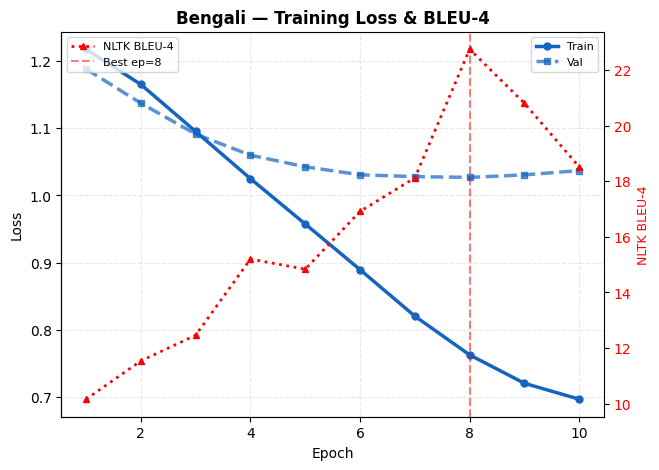

  Saved: training_curve_bn.png + .pdf


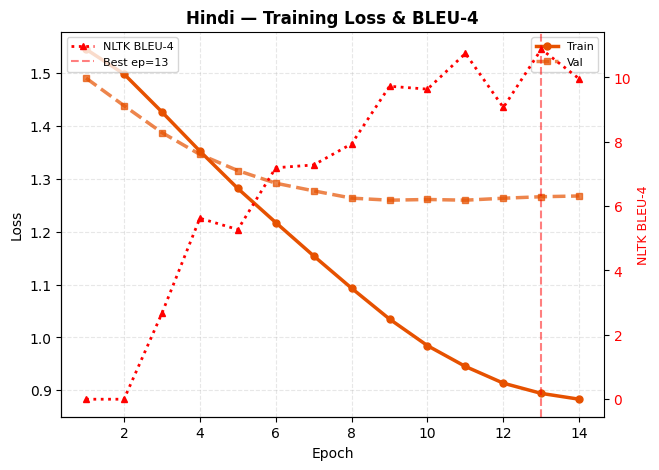

  Saved: training_curve_hi.png + .pdf


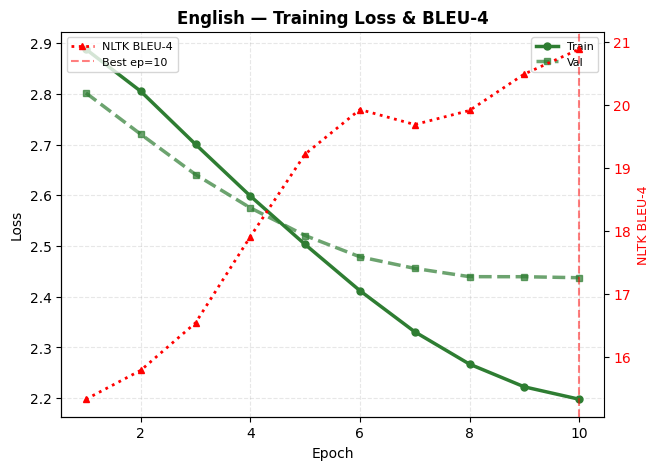

  Saved: training_curve_en.png + .pdf
Training curve figures saved.


In [14]:
# Cell 12 — Main training
def train_lang(lang, model, ds_dict, epochs, tag):
    tr_dl        = ds_dict["tr_dl"]; va_dl = ds_dict["va_dl"]
    va_records   = {"bn": va_bn, "hi": va_hi, "en": va_en}[lang]
    val_img2caps = {"bn": va_bn_img2caps, "hi": va_hi_img2caps, "en": va_en_img2caps}[lang]

    mlp_warmup = CFG.MLP_WARMUP_EPOCHS
    if mlp_warmup > 0 and not model.mlp_frozen:
        print(f"\n  [{lang.upper()}] MLP WARMUP: {mlp_warmup} epoch(s) with MLP trainable...")
        wu_steps = mlp_warmup * len(tr_dl) // CFG.GRAD_ACCUM
        wu_opt   = AdamW(list(model.parameters()), lr=CFG.LR * 0.5,
                         weight_decay=CFG.WEIGHT_DECAY)
        wu_sched, _ = make_scheduler(wu_opt, wu_steps)
        sc = 0
        for _ in range(mlp_warmup):
            _, sc = train_one_epoch(model, tr_dl, wu_opt, wu_sched, CFG.GRAD_ACCUM, sc)
        model.freeze_mlp()
        print(f"  [{lang.upper()}] MLP frozen after warmup. Trainable params: "
              f"{sum(p.numel() for p in model.parameters() if p.requires_grad)/1e6:.1f}M")
        del wu_opt, wu_sched; gc.collect()

    total_steps   = epochs * len(tr_dl) // CFG.GRAD_ACCUM
    opt           = make_optimizer(model)
    sched, warmup = make_scheduler(opt, total_steps)

    best_bleu4 = -1.0
    best_vl    = float("inf")
    pat_ct     = 0
    best_path  = f"{CFG.CKPT_DIR}/{tag}_best.pt"
    step_ctr   = 0

    hist = {"train": [], "val": [], "lr": [], "epoch_sec": [],
            "BLEU-1": [], "BLEU-2": [], "BLEU-3": [], "BLEU-4": [],
            "BLEU-4-sacre": [],
            "METEOR": [], "ROUGE-L": [], "CIDEr": [], "BERTScore-F1": []}

    trainable_M = sum(p.numel() for p in model.parameters() if p.requires_grad) / 1e6
    print(f"\n{'='*68}")
    print(f"TRAINING [{lang.upper()}]  epochs={epochs}"
          f"  steps={total_steps:,}  warmup={warmup}"
          f"  trainable={trainable_M:.1f}M  no_repeat_ngram={CFG.NO_REPEAT_NGRAM[lang]}")
    print(f"{'='*68}")

    for ep in range(epochs):
        if (time.time() - GLOBAL_START) / 3600 >= CFG.TIMEOUT_H:
            print(f"  *** TIMEOUT ***"); break

        t0 = time.time()
        tr_l, step_ctr = train_one_epoch(
            model, tr_dl, opt, sched, CFG.GRAD_ACCUM, step_ctr)
        va_l  = eval_loss(model, va_dl)
        ep_s  = time.time() - t0
        hist["train"].append(tr_l); hist["val"].append(va_l)
        hist["lr"].append(opt.param_groups[0]["lr"])
        hist["epoch_sec"].append(ep_s)
        best_vl = min(best_vl, va_l)

        print(f"\n[{lang.upper()}] EP {ep+1}/{epochs}"
              f"  train={tr_l:.5f}  val={va_l:.5f}"
              f"  {ep_s/60:.1f}min"
              f"  {(time.time()-GLOBAL_START)/3600:.2f}h")

        em       = quick_eval(model, va_records, val_img2caps, lang)
        ep_bleu4 = 0.0
        if em:
            ep_bleu4 = em.get("BLEU-4", 0.)
            for k in ["BLEU-1","BLEU-2","BLEU-3","BLEU-4","BLEU-4-sacre",
                      "METEOR","ROUGE-L","CIDEr","BERTScore-F1"]:
                hist[k].append(em.get(k, 0.))
            print(f"  NLTK B4={ep_bleu4:.2f}"
                  f"  sacre B4={em.get('BLEU-4-sacre',0):.2f}"
                  f"  B1={em.get('BLEU-1',0):.2f}"
                  f"  METEOR={em.get('METEOR',0):.2f}"
                  f"  CIDEr={em.get('CIDEr',0):.2f}")

        sample_preds(model, va_records, n=2, tag=f"{lang.upper()} Ep{ep+1}")

        ep_path = f"{CFG.CKPT_DIR}/{tag}_ep{ep+1}.pt"
        save_epoch(model, ep_path, ep+1)

        if ep_bleu4 > best_bleu4:
            best_bleu4 = ep_bleu4; pat_ct = 0
            save_best(model, best_path)
            print(f"  New best NLTK BLEU-4={best_bleu4:.2f}")
        else:
            pat_ct += 1
            print(f"  Patience {pat_ct}/{CFG.PATIENCE}"
                  f"  (best NLTK BLEU-4={best_bleu4:.2f})")
            if pat_ct >= CFG.PATIENCE:
                print(f"  Early stop."); break

    if not Path(best_path).exists():
        _write_ckpt(model, best_path)
    total_h = sum(hist["epoch_sec"]) / 3600
    print(f"\n[{lang.upper()}] Done.  Best NLTK BLEU-4={best_bleu4:.2f}  Time={total_h:.2f}h")
    return hist, best_path


all_hists = {}; all_ckpts = {}

for lang in ["bn", "hi", "en"]:
    if (time.time() - GLOBAL_START) / 3600 >= CFG.TIMEOUT_H:
        print(f"Timeout — skipping {lang}"); break
    gc.collect(); torch.cuda.empty_cache()
    hist, ckpt = train_lang(lang, models[lang], datasets[lang],
                             CFG.EPOCHS[lang], f"clipcap_{lang}")
    all_hists[lang] = hist; all_ckpts[lang] = ckpt
    models[lang].cpu(); gc.collect(); torch.cuda.empty_cache()
    models[lang].to(DEVICE)

print(f"\nAll training done.  {(time.time()-GLOBAL_START)/3600:.2f}h total")

with open(f"{CFG.OUTPUT_DIR}/training_histories.json", "w") as f:
    json.dump({lang: {k: [float(x) for x in v] for k, v in h.items()}
               for lang, h in all_hists.items()}, f, indent=2)

# ── Separate per-language training-curve figures ──
for lang in ["bn","hi","en"]:
    h = all_hists.get(lang, {})
    if not h.get("train"): continue
    fig, ax = plt.subplots(figsize=(7,5))
    ep_r = range(1, len(h["train"]) + 1)
    ax.plot(ep_r, h["train"], color=LANG_COLS[lang], lw=2.5, marker="o", ms=5, label="Train")
    ax.plot(ep_r, h["val"],   color=LANG_COLS[lang], lw=2.5, marker="s", ms=5, ls="--",
            label="Val", alpha=0.7)
    if h.get("BLEU-4"):
        ax2 = ax.twinx()
        ax2.plot(range(1, len(h["BLEU-4"])+1), h["BLEU-4"],
                 color="red", lw=2, ls=":", marker="^", ms=5, label="NLTK BLEU-4")
        ax2.set_ylabel("NLTK BLEU-4", color="red", fontsize=9)
        ax2.tick_params(axis="y", labelcolor="red")
        best_ep = int(np.argmax(h["BLEU-4"])) + 1
        ax2.axvline(best_ep, color="red", lw=1.5, ls="--", alpha=0.5,
                    label=f"Best ep={best_ep}")
        ax2.legend(fontsize=8, loc="upper left")
    ax.set_title(f"{LANG_NAMES[lang]} — Training Loss & BLEU-4", fontsize=12, fontweight="bold")
    ax.set_xlabel("Epoch"); ax.set_ylabel("Loss")
    ax.legend(fontsize=8); ax.grid(alpha=0.3, ls="--")
    ax.spines[["top","right"]].set_visible(False)
    save_show_dual(fig, f"{CFG.FIG_DIR}/training_curve_{lang}")
print("Training curve figures saved.")

# **Model Evaluation**

In [15]:
# Cell 13 — Model evaluation
print("="*65)
print("FULL EVALUATION — Loading best checkpoints")
print("="*65)
gc.collect(); torch.cuda.empty_cache()

for lang in ["bn","hi","en"]:
    if lang in all_ckpts:
        load_ckpt(models[lang], all_ckpts[lang])
    models[lang].to(DEVICE); models[lang].eval()

@torch.no_grad()
def evaluate_language(lang, model, test_records, img2caps, bert_lang="en"):
    model.eval()
    seen = set(); recs = []
    for r in test_records:
        if r["image"] not in seen and r["lang"] == lang \
                and get_emb_path(r["image"]).exists():
            seen.add(r["image"]); recs.append(r)
    if not recs:
        return {m: 0. for m in ["BLEU-1","BLEU-2","BLEU-3","BLEU-4","BLEU-4-sacre",
                                  "CIDEr","METEOR","ROUGE-L","BERTScore-F1",
                                  "Precision","Recall","F1","N"]}

    img_ids = []; refs_d = {}; hyps_d = {}; hyps = []; refs_per = []
    for r in recs:
        try:
            emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
            gen = model.generate(emb)
        except Exception: gen = "."
        all_refs = img2caps.get(r["image"], [r["caption"]]); gen = gen or "."
        img_ids.append(r["image"]); refs_d[r["image"]] = all_refs
        hyps_d[r["image"]] = gen; hyps.append(gen); refs_per.append(all_refs)

    print(f"  [{lang.upper()}] n={len(hyps)}  Diversity:{len(set(hyps))}/{len(hyps)}")
    mean_len = np.mean([len(h.split()) for h in hyps])
    print(f"  [{lang.upper()}] mean gen length: {mean_len:.1f} words")

    nltk_b4  = compute_bleu_nltk(refs_per, hyps, 4)
    sacre_b4 = compute_bleu_sacre(refs_per, hyps, 4)
    print(f"  NLTK BLEU-4={nltk_b4:.2f}  sacrebleu BLEU-4={sacre_b4:.2f}")

    best_refs = [rp[0] for rp in refs_per]
    p, rc, f  = compute_token_prf(refs_per, hyps)
    return {
        "BLEU-1":       compute_bleu_nltk(refs_per, hyps, 1),
        "BLEU-2":       compute_bleu_nltk(refs_per, hyps, 2),
        "BLEU-3":       compute_bleu_nltk(refs_per, hyps, 3),
        "BLEU-4":       nltk_b4,
        "BLEU-4-sacre": sacre_b4,
        "CIDEr":        compute_cider(img_ids, refs_d, hyps_d),
        "METEOR":       compute_meteor(refs_per, hyps),
        "ROUGE-L":      compute_rougeL(refs_per, hyps, lang=lang),
        "BERTScore-F1": compute_bertscore(best_refs, hyps, lang=bert_lang),
        "Precision": p, "Recall": rc, "F1": f, "N": len(img_ids),
    }

print("\nBengali evaluation...")
res_bn = evaluate_language("bn", models["bn"], te_bn, te_bn_img2caps, bert_lang="bn")
print("\nHindi evaluation...")
res_hi = evaluate_language("hi", models["hi"], te_hi, te_hi_img2caps, bert_lang="hi")
print("\nEnglish evaluation...")
res_en = evaluate_language("en", models["en"], te_en, te_en_img2caps, bert_lang="en")

res_ov = {m: (res_bn[m]+res_hi[m]+res_en[m])/3
          for m in ["BLEU-1","BLEU-2","BLEU-3","BLEU-4","BLEU-4-sacre",
                     "CIDEr","METEOR","ROUGE-L","BERTScore-F1","Precision","Recall","F1"]}
res_ov["N"] = res_bn["N"] + res_hi["N"] + res_en["N"]

all_res = {"overall": res_ov, "bn": res_bn, "hi": res_hi, "en": res_en}
with open(f"{CFG.OUTPUT_DIR}/all_results.json","w",encoding="utf-8") as f:
    json.dump(all_res, f, indent=2, ensure_ascii=False)

METRICS = ["BLEU-1","BLEU-2","BLEU-3","BLEU-4","BLEU-4-sacre",
           "CIDEr","METEOR","ROUGE-L","BERTScore-F1","Precision","Recall","F1"]
print("\n" + "="*105)
print(f"{'Metric':<16}{'Overall':>22}{'Bengali':>18}{'Hindi':>18}{'English':>18}")
print("-"*105)
for m in METRICS:
    print(f"{m:<16}{res_ov[m]:>22.2f}{res_bn[m]:>18.2f}{res_hi[m]:>18.2f}{res_en[m]:>18.2f}")
print("="*105)
print(f"\nEvaluation done. Total elapsed: {(time.time()-GLOBAL_START)/3600:.2f}h")

FULL EVALUATION — Loading best checkpoints
  Loaded: clipcap_bn_best.pt
  Loaded: clipcap_hi_best.pt
  Loaded: clipcap_en_best.pt

Bengali evaluation...
  [BN] n=801  Diversity:374/801
  [BN] mean gen length: 5.2 words
  NLTK BLEU-4=18.00  sacrebleu BLEU-4=18.39


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.



Hindi evaluation...
  [HI] n=100  Diversity:86/100
  [HI] mean gen length: 10.6 words
  NLTK BLEU-4=11.27  sacrebleu BLEU-4=11.29


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.



English evaluation...
  [EN] n=810  Diversity:767/810
  [EN] mean gen length: 15.0 words
  NLTK BLEU-4=18.51  sacrebleu BLEU-4=17.70


Loading weights:   0%|          | 0/389 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-large
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.



Metric                         Overall           Bengali             Hindi           English
---------------------------------------------------------------------------------------------------------
BLEU-1                           50.68             51.39             44.27             56.38
BLEU-2                           33.78             35.28             26.28             39.79
BLEU-3                           22.79             24.30             16.73             27.35
BLEU-4                           15.93             18.00             11.27             18.51
BLEU-4-sacre                     15.79             18.39             11.29             17.70
CIDEr                            44.31             57.28             35.63             40.01
METEOR                           37.29             38.94             26.53             46.41
ROUGE-L                          51.52             63.47             47.60             43.50
BERTScore-F1                     82.09             81.09

# **Results bar chart and Quantitative table**

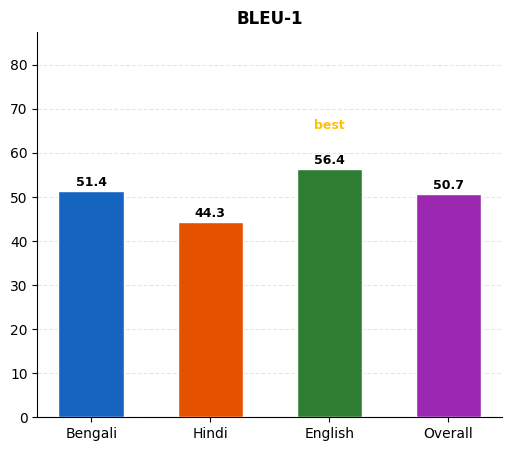

  Saved: results_bar_bleu1.png + .pdf


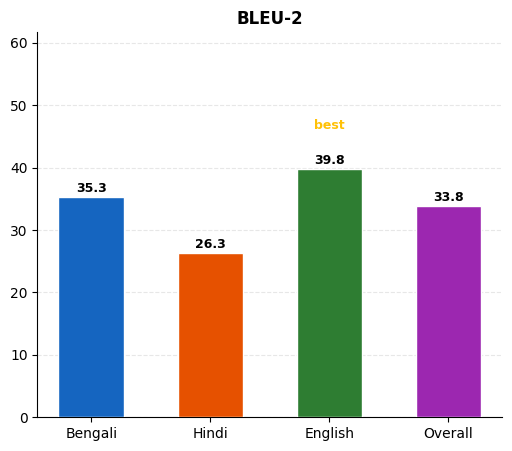

  Saved: results_bar_bleu2.png + .pdf


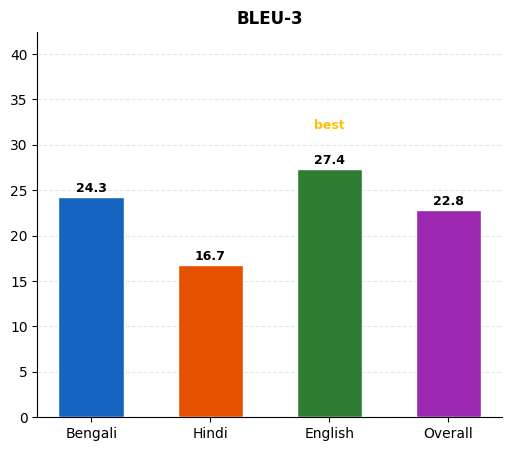

  Saved: results_bar_bleu3.png + .pdf


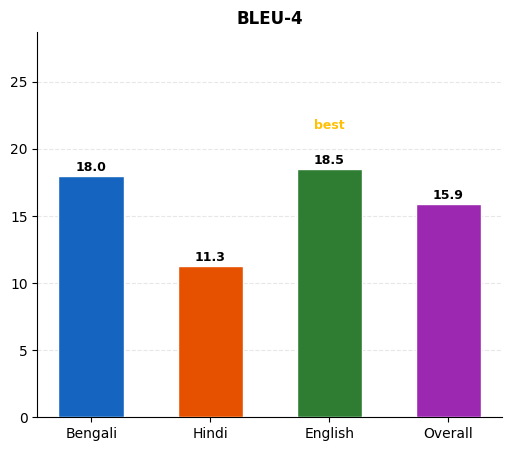

  Saved: results_bar_bleu4.png + .pdf


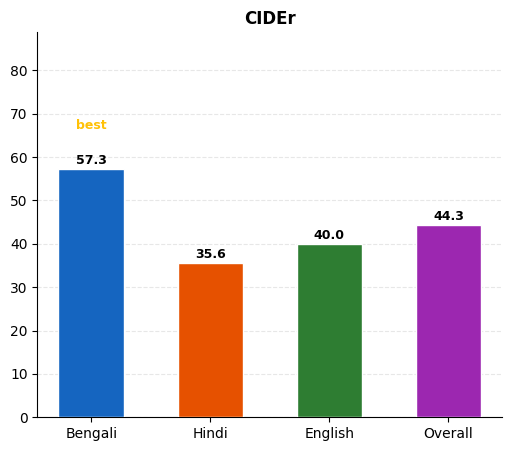

  Saved: results_bar_cider.png + .pdf


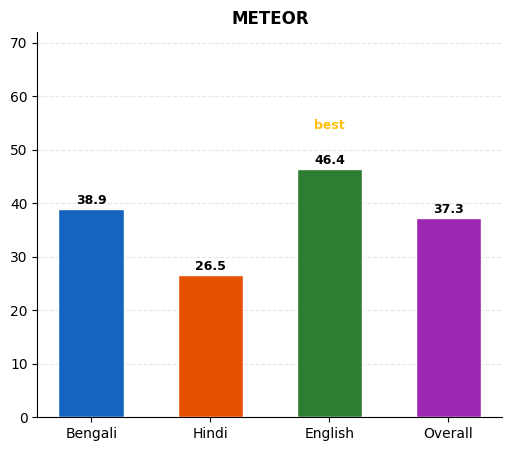

  Saved: results_bar_meteor.png + .pdf


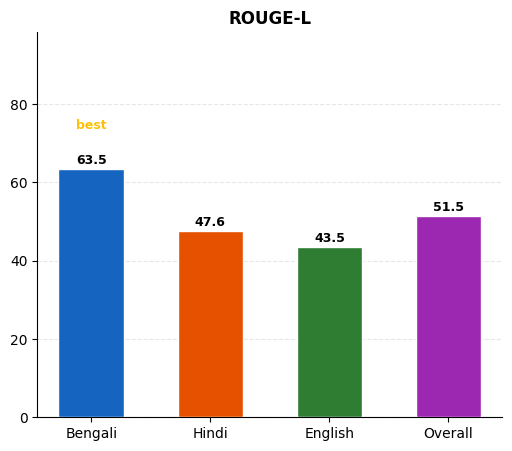

  Saved: results_bar_rougel.png + .pdf


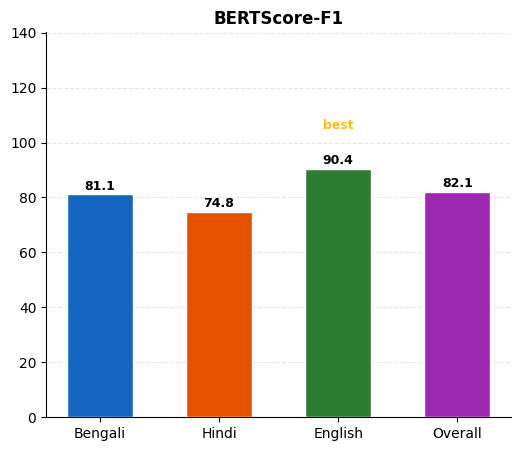

  Saved: results_bar_bertscoref1.png + .pdf


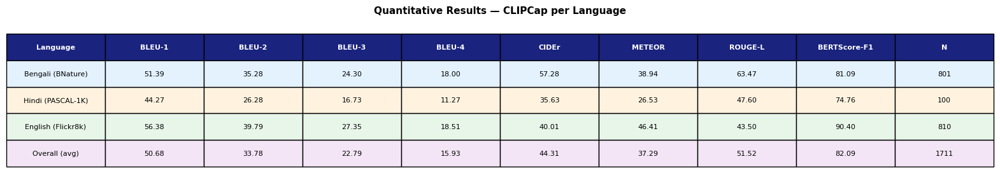

  Saved: results_table.png + .pdf
Results figures saved.


In [16]:
# Cell 14 — Results bar charts (one figure per metric) + quantitative table
LORDER = ["bn","hi","en","overall"]
LLBL   = {"bn":"Bengali","hi":"Hindi","en":"English","overall":"Overall"}
LCOL   = {"bn":"#1565C0","hi":"#E65100","en":"#2E7D32","overall":"#9C27B0"}
MQUAN  = ["BLEU-1","BLEU-2","BLEU-3","BLEU-4","CIDEr","METEOR","ROUGE-L","BERTScore-F1"]

for metric in MQUAN:
    vals = [all_res[l][metric] for l in LORDER]
    fig, ax = plt.subplots(figsize=(6,5))
    bars = ax.bar([LLBL[l] for l in LORDER], vals, color=[LCOL[l] for l in LORDER],
                  edgecolor="white", width=0.55, zorder=3)
    mx = max(vals) if max(vals) > 0 else 10
    ax.set_ylim(0, mx*1.55)
    ax.set_title(metric, fontsize=12, fontweight="bold")
    ax.grid(axis="y", alpha=0.3, ls="--"); ax.spines[["top","right"]].set_visible(False)
    for bar, val in zip(bars, vals):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+mx*0.02,
                f"{val:.1f}", ha="center", fontsize=9, fontweight="bold")
    bi = int(np.argmax(vals))
    ax.text(bi, vals[bi]+mx*0.16, "best", ha="center", fontsize=9, color="#FFC107", fontweight="bold")
    save_show_dual(fig, f"{CFG.FIG_DIR}/results_bar_{metric.replace('-','').lower()}")

rows = [
    ["Bengali (BNature)"]   + [f"{res_bn[m]:.2f}" for m in MQUAN] + [str(res_bn["N"])],
    ["Hindi (PASCAL-1K)"]   + [f"{res_hi[m]:.2f}" for m in MQUAN] + [str(res_hi["N"])],
    ["English (Flickr8k)"]  + [f"{res_en[m]:.2f}" for m in MQUAN] + [str(res_en["N"])],
    ["Overall (avg)"]       + [f"{res_ov[m]:.2f}" for m in MQUAN] + [str(res_ov["N"])],
]
col_lbl = ["Language"] + MQUAN + ["N"]
fig, ax = plt.subplots(figsize=(20,3)); ax.axis("off")
tbl = ax.table(cellText=rows, colLabels=col_lbl, cellLoc="center", loc="center")
tbl.auto_set_font_size(False); tbl.set_fontsize(8); tbl.scale(1.0, 2.5)
for ci in range(len(col_lbl)):
    tbl[0,ci].set_facecolor("#1A237E"); tbl[0,ci].set_text_props(color="white", fontweight="bold")
for ri, clr in enumerate(["#E3F2FD","#FFF3E0","#E8F5E9","#F3E5F5"], start=1):
    for ci in range(len(col_lbl)): tbl[ri,ci].set_facecolor(clr)
ax.set_title("Quantitative Results — CLIPCap per Language", fontsize=11, fontweight="bold", pad=15)
save_show_dual(fig, f"{CFG.FIG_DIR}/results_table")
print("Results figures saved.")

# **Baseline Comparison**

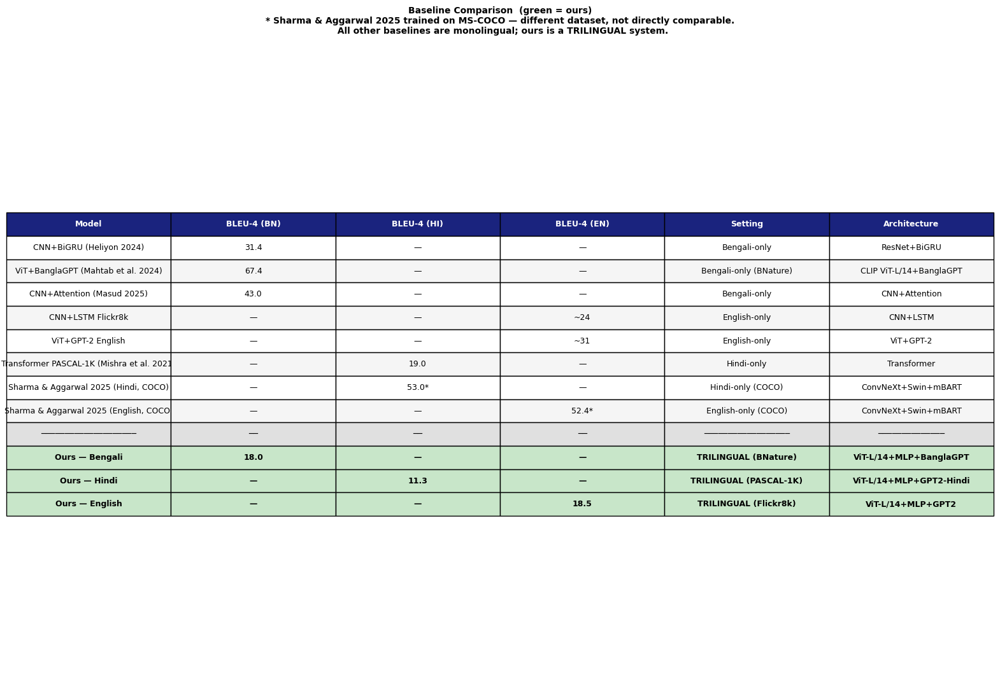

  Saved: baseline_comparison.png + .pdf
Baseline comparison saved.


In [17]:
# Cell 15 — Baseline comparison table
bn = res_bn; hi = res_hi; en = res_en

baseline_data = [
    ["CNN+BiGRU (Heliyon 2024)",          "31.4","—","—","Bengali-only","ResNet+BiGRU"],
    ["ViT+BanglaGPT (Mahtab et al. 2024)","67.4","—","—","Bengali-only (BNature)","CLIP ViT-L/14+BanglaGPT"],
    ["CNN+Attention (Masud 2025)",        "43.0","—","—","Bengali-only","CNN+Attention"],
    ["CNN+LSTM Flickr8k",                 "—","—","~24","English-only","CNN+LSTM"],
    ["ViT+GPT-2 English",                 "—","—","~31","English-only","ViT+GPT-2"],
    ["Transformer PASCAL-1K (Mishra et al. 2021)", "—","19.0","—","Hindi-only","Transformer"],
    ["Sharma & Aggarwal 2025 (Hindi, COCO)",   "—","53.0*","—","Hindi-only (COCO)","ConvNeXt+Swin+mBART"],
    ["Sharma & Aggarwal 2025 (English, COCO)", "—","—","52.4*","English-only (COCO)","ConvNeXt+Swin+mBART"],
]
separator = ["─"*20, "──", "──", "──", "─"*18, "─"*14]
our_data = [
    ["Ours — Bengali", f"{bn['BLEU-4']:.1f}","—","—","TRILINGUAL (BNature)","ViT-L/14+MLP+BanglaGPT"],
    ["Ours — Hindi",   "—",f"{hi['BLEU-4']:.1f}","—","TRILINGUAL (PASCAL-1K)","ViT-L/14+MLP+GPT2-Hindi"],
    ["Ours — English", "—","—",f"{en['BLEU-4']:.1f}","TRILINGUAL (Flickr8k)","ViT-L/14+MLP+GPT2"],
]

all_rows   = baseline_data + [separator] + our_data
n_baseline = len(baseline_data)
n_our      = len(our_data)
col_bl     = ["Model","BLEU-4 (BN)","BLEU-4 (HI)","BLEU-4 (EN)","Setting","Architecture"]
n_cols     = len(col_bl)

fig, ax = plt.subplots(figsize=(20, len(all_rows)*0.82+3))
ax.axis("off")
tbl = ax.table(cellText=all_rows, colLabels=col_bl, cellLoc="center", loc="center")
tbl.auto_set_font_size(False); tbl.set_fontsize(9); tbl.scale(1.0, 2.2)
for ci in range(n_cols):
    tbl[0,ci].set_facecolor("#1A237E"); tbl[0,ci].set_text_props(color="white", fontweight="bold")
for ri in range(1, n_baseline+1):
    clr = "#F5F5F5" if ri%2==0 else "white"
    for ci in range(n_cols): tbl[ri,ci].set_facecolor(clr)
sep_ri = n_baseline+1
for ci in range(n_cols): tbl[sep_ri,ci].set_facecolor("#E0E0E0")
our_start = sep_ri+1
for ri in range(our_start, our_start+n_our):
    for ci in range(n_cols):
        tbl[ri,ci].set_facecolor("#C8E6C9"); tbl[ri,ci].set_text_props(fontweight="bold")
ax.set_title(
    "Baseline Comparison  (green = ours)\n"
    "* Sharma & Aggarwal 2025 trained on MS-COCO — different dataset, not directly comparable.\n"
    "  All other baselines are monolingual; ours is a TRILINGUAL system.",
    fontsize=10, fontweight="bold", pad=18)
save_show_dual(fig, f"{CFG.FIG_DIR}/baseline_comparison")
print("Baseline comparison saved.")

# **Qualitative examples**

  Loaded: clipcap_bn_best.pt
  Loaded: clipcap_hi_best.pt
  Loaded: clipcap_en_best.pt


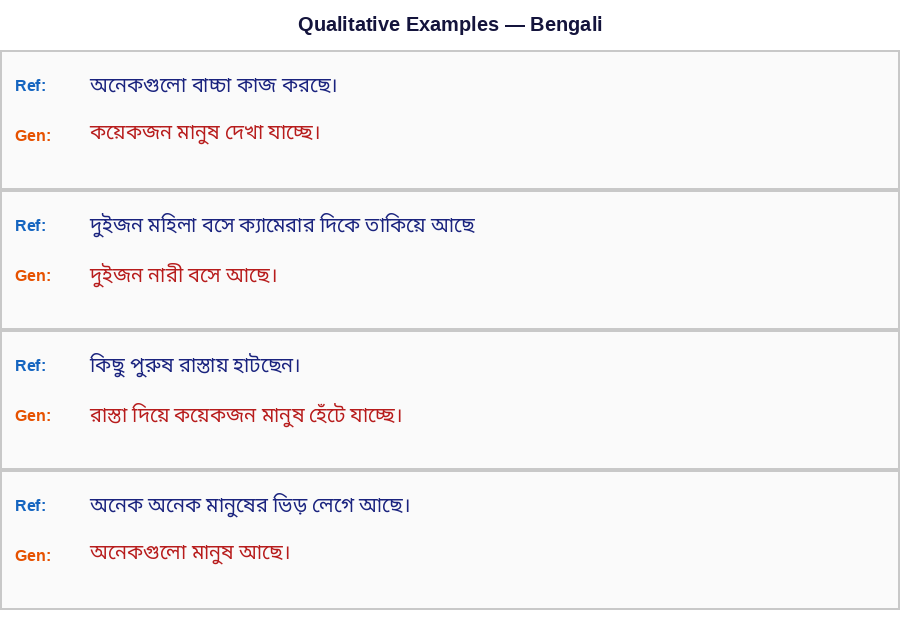

  Saved: qualitative_bn.png + .pdf


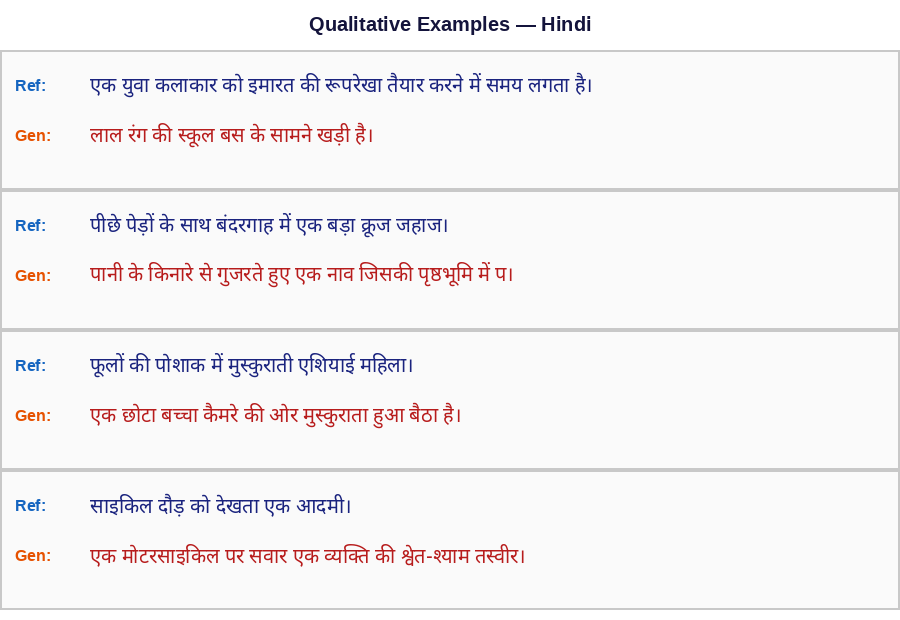

  Saved: qualitative_hi.png + .pdf


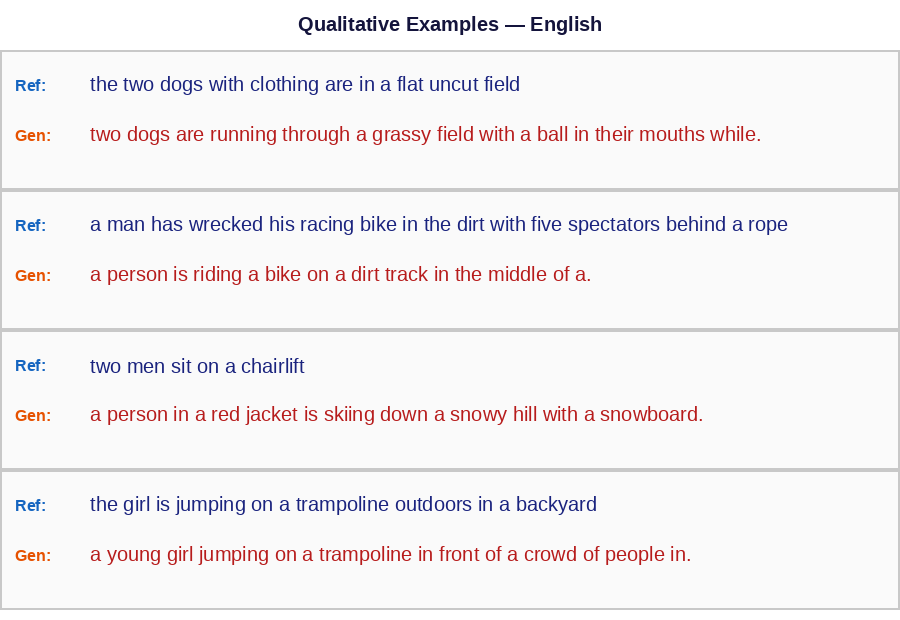

  Saved: qualitative_en.png + .pdf
Qualitative figures saved.


In [18]:
# Cell 16 — Qualitative examples (PIL, one figure per language)
for lang in ["bn","hi","en"]:
    load_ckpt(models[lang], all_ckpts[lang])
    models[lang].to(DEVICE); models[lang].eval()

def build_qual_card(ref, ref_lang, gen, gen_lang):
    W, H = 900, 140
    img = Image.new("RGB", (W,H), (250,250,250))
    d = ImageDraw.Draw(img)
    d.rectangle([0,0,W-1,H-1], outline=(200,200,200), width=2)
    f_lbl = get_font("en", 16, bold=True)
    draw_left(d, "Ref:", 15, 35, f_lbl, (21,101,192))
    draw_left(d, ref[:90],  90, 35, pick_font(ref, ref_lang, 20), (26,35,126))
    draw_left(d, "Gen:", 15, 85, f_lbl, (230,81,0))
    draw_left(d, gen[:90],  90, 85, pick_font(gen, gen_lang, 20), (183,28,28))
    return img

for lang in ["bn","hi","en"]:
    te_recs = {"bn":te_bn,"hi":te_hi,"en":te_en}[lang]
    pool = [r for r in te_recs if get_emb_path(r["image"]).exists()]
    picks = random.Random(SEED).sample(pool, min(4, len(pool)))
    cards = []
    with torch.no_grad():
        for r in picks:
            emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
            gen = models[lang].generate(emb) or "."
            cards.append(build_qual_card(r["caption"], lang, gen, lang))

    W = cards[0].width; H = sum(c.height for c in cards) + 60
    grid = Image.new("RGB", (W, H), (255,255,255))
    d = ImageDraw.Draw(grid)
    draw_center(d, f"Qualitative Examples — {LANG_NAMES[lang]}",
                W//2, 25, get_font("en",20,bold=True), (20,20,60))
    y = 50
    for c in cards:
        grid.paste(c, (0,y)); y += c.height
    save_show_dual(grid, f"{CFG.FIG_DIR}/qualitative_{lang}")
print("Qualitative figures saved.")

# **Beam search analysis (Greedy vs Beam)**

  Loaded: clipcap_bn_best.pt
  Loaded: clipcap_hi_best.pt


The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


  Loaded: clipcap_en_best.pt
  k=1: NLTK BLEU-4=14.96  METEOR=40.22
  k=2: NLTK BLEU-4=18.94  METEOR=41.38
  k=3: NLTK BLEU-4=16.28  METEOR=39.68
  k=4: NLTK BLEU-4=16.55  METEOR=39.49
  k=5: NLTK BLEU-4=16.46  METEOR=40.91
  k=6: NLTK BLEU-4=16.53  METEOR=41.35

  Best beam k=2 — updating CFG.BEST_BEAM['bn']=2


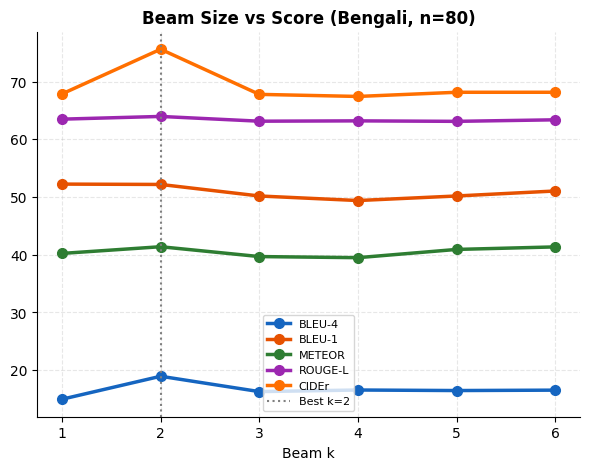

  Saved: beam_bn_lineplot.png + .pdf


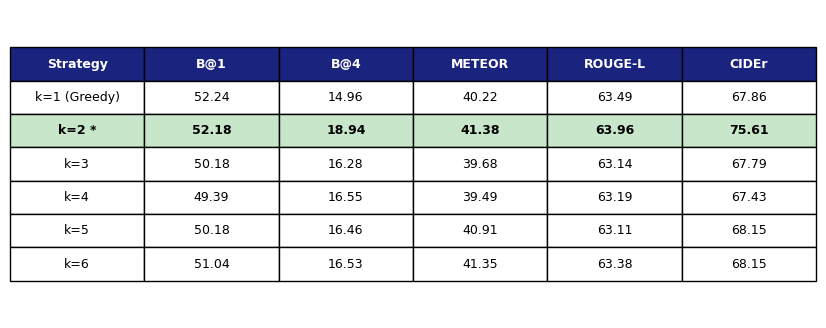

  Saved: beam_bn_table.png + .pdf


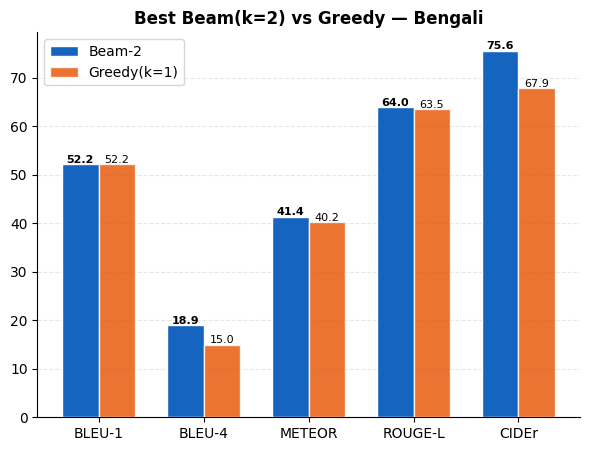

  Saved: beam_bn_vs_greedy.png + .pdf
Beam analysis figures saved.


In [19]:
# Cell 17 — Beam search analysis (Bengali, greedy vs beam)
for lang in ["bn","hi","en"]:
    load_ckpt(models[lang], all_ckpts[lang]); models[lang].eval()

lang     = "bn"; model_bn = models["bn"]
bn_sub   = [r for r in te_bn if get_emb_path(r["image"]).exists()][:80]
beam_res = {}

for bk in CFG.BEAMS_TEST:
    rd = {}; hd = {}
    with torch.no_grad():
        for r in bn_sub:
            try:
                emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
                gen = model_bn.generate(emb, beam=bk)
            except Exception: gen = "."
            rd[r["image"]] = te_bn_img2caps.get(r["image"], [r["caption"]])
            hd[r["image"]] = gen or "."
    iids = list(rd.keys()); hl = [hd[i] for i in iids]; rp = [rd[i] for i in iids]
    beam_res[bk] = {
        "BLEU-1":  compute_bleu_nltk(rp, hl, 1),
        "BLEU-4":  compute_bleu_nltk(rp, hl, 4),
        "METEOR":  compute_meteor(rp, hl),
        "ROUGE-L": compute_rougeL(rp, hl, "bn"),
        "CIDEr":   compute_cider(iids, rd, hd),
    }
    print(f"  k={bk}: NLTK BLEU-4={beam_res[bk]['BLEU-4']:.2f}  METEOR={beam_res[bk]['METEOR']:.2f}")

best_k = max(CFG.BEAMS_TEST, key=lambda k: beam_res[k]["BLEU-4"])
print(f"\n  Best beam k={best_k} — updating CFG.BEST_BEAM['bn']={best_k}")
CFG.BEST_BEAM["bn"] = best_k

with open(f"{CFG.OUTPUT_DIR}/beam_analysis.json","w") as f:
    json.dump({str(k):v for k,v in beam_res.items()}, f, indent=2)

METRICS_B = ["BLEU-1","BLEU-4","METEOR","ROUGE-L","CIDEr"]

# Fig 1: line plot
fig, ax = plt.subplots(figsize=(7,5))
for metric, col in [("BLEU-4","#1565C0"),("BLEU-1","#E65100"),("METEOR","#2E7D32"),
                     ("ROUGE-L","#9C27B0"),("CIDEr","#FF6F00")]:
    ax.plot(CFG.BEAMS_TEST, [beam_res[k][metric] for k in CFG.BEAMS_TEST],
            color=col, lw=2.5, marker="o", ms=7, label=metric)
ax.axvline(best_k, color="gray", lw=1.5, ls=":", label=f"Best k={best_k}")
ax.set_title("Beam Size vs Score (Bengali, n=80)", fontsize=12, fontweight="bold")
ax.set_xlabel("Beam k"); ax.set_xticks(CFG.BEAMS_TEST)
ax.legend(fontsize=8); ax.grid(alpha=0.3, ls="--"); ax.spines[["top","right"]].set_visible(False)
save_show_dual(fig, f"{CFG.FIG_DIR}/beam_bn_lineplot")

# Fig 2: table
fig, ax = plt.subplots(figsize=(8,4)); ax.axis("off")
tbl_d = [[f"k={k}"+(" *" if k==best_k else " (Greedy)" if k==1 else ""),
          f"{beam_res[k]['BLEU-1']:.2f}", f"{beam_res[k]['BLEU-4']:.2f}",
          f"{beam_res[k]['METEOR']:.2f}", f"{beam_res[k]['ROUGE-L']:.2f}",
          f"{beam_res[k]['CIDEr']:.2f}"] for k in CFG.BEAMS_TEST]
t = ax.table(cellText=tbl_d, colLabels=["Strategy","B@1","B@4","METEOR","ROUGE-L","CIDEr"],
              cellLoc="center", loc="center")
t.auto_set_font_size(False); t.set_fontsize(9); t.scale(1.3,2.0)
for ci in range(6): t[0,ci].set_facecolor("#1A237E"); t[0,ci].set_text_props(color="white",fontweight="bold")
bi = CFG.BEAMS_TEST.index(best_k)+1
for ci in range(6): t[bi,ci].set_facecolor("#C8E6C9"); t[bi,ci].set_text_props(fontweight="bold")
save_show_dual(fig, f"{CFG.FIG_DIR}/beam_bn_table")

# Fig 3: bar comparison
fig, ax = plt.subplots(figsize=(7,5))
x = np.arange(len(METRICS_B)); w = 0.35
br1 = ax.bar(x-w/2, [beam_res[best_k][m] for m in METRICS_B], w, label=f"Beam-{best_k}",
              color="#1565C0", edgecolor="white", zorder=3)
br2 = ax.bar(x+w/2, [beam_res[1][m] for m in METRICS_B], w, label="Greedy(k=1)",
              color="#E65100", edgecolor="white", alpha=0.8, zorder=3)
ax.set_xticks(x); ax.set_xticklabels(METRICS_B)
ax.set_title(f"Best Beam(k={best_k}) vs Greedy — Bengali", fontsize=12, fontweight="bold")
ax.legend(); ax.grid(axis="y", alpha=0.3, ls="--"); ax.spines[["top","right"]].set_visible(False)
for bar,val in zip(br1,[beam_res[best_k][m] for m in METRICS_B]):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3, f"{val:.1f}", ha="center", fontsize=8, fontweight="bold")
for bar,val in zip(br2,[beam_res[1][m] for m in METRICS_B]):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3, f"{val:.1f}", ha="center", fontsize=8)
save_show_dual(fig, f"{CFG.FIG_DIR}/beam_bn_vs_greedy")
print("Beam analysis figures saved.")

# **Beam vs Greedy comprehensive comparison**

  [BN] Best k=2 NLTK BLEU-4=18.94  Greedy=14.96
  [HI] Best k=2 NLTK BLEU-4=6.79  Greedy=0.00
  [EN] Best k=6 NLTK BLEU-4=16.25  Greedy=11.71

Updated CFG.BEST_BEAM = {'bn': 2, 'hi': 2, 'en': 6}


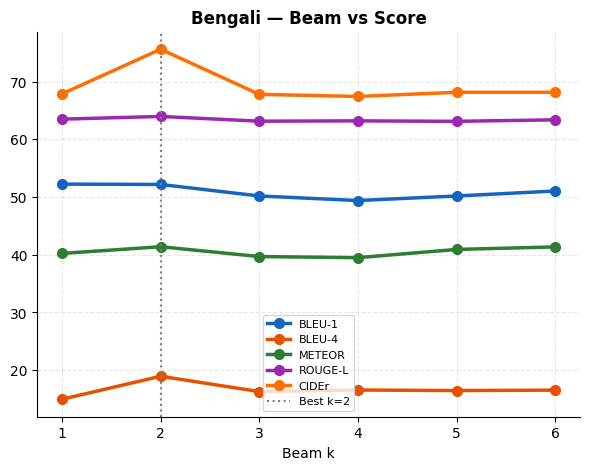

  Saved: beam_lineplot_bn.png + .pdf


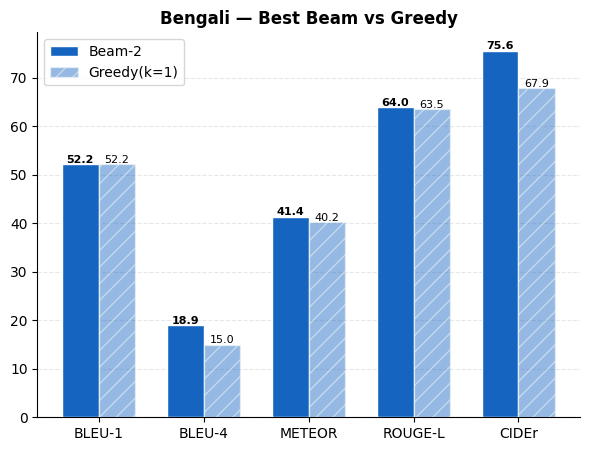

  Saved: beam_vs_greedy_bn.png + .pdf


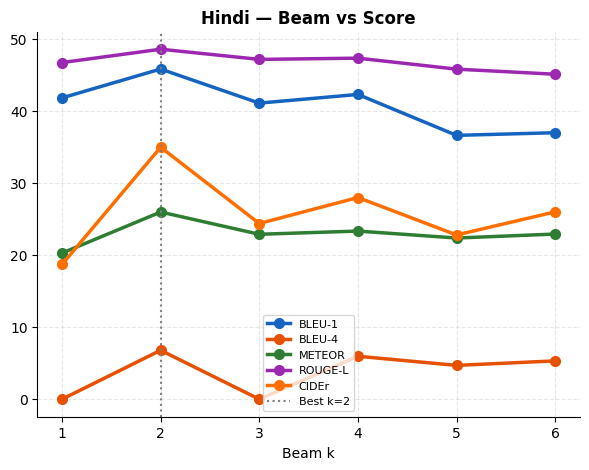

  Saved: beam_lineplot_hi.png + .pdf


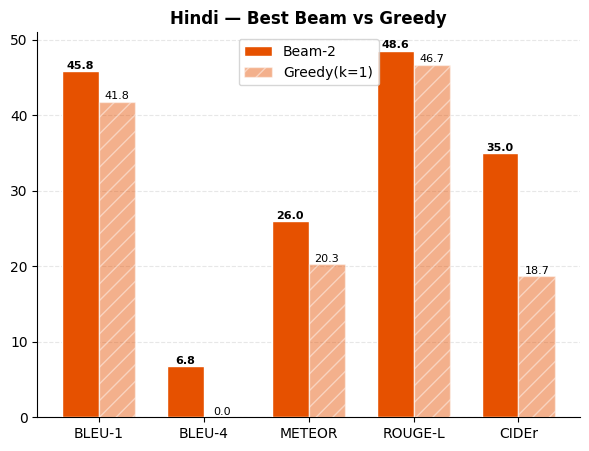

  Saved: beam_vs_greedy_hi.png + .pdf


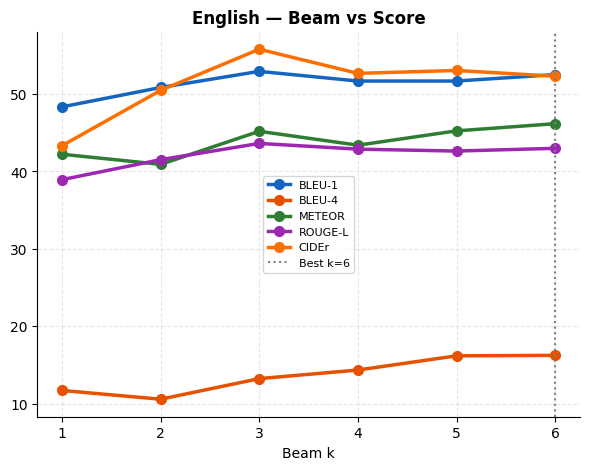

  Saved: beam_lineplot_en.png + .pdf


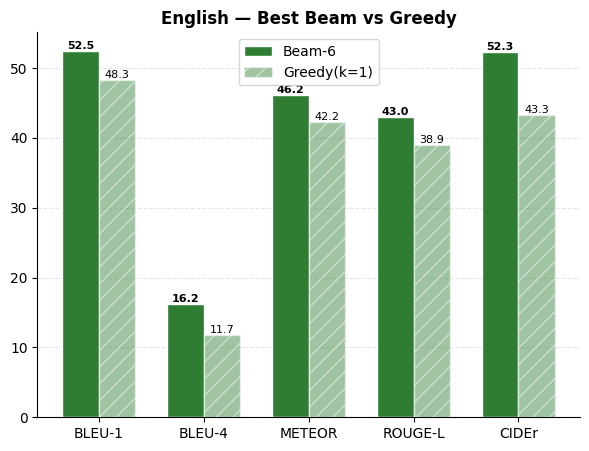

  Saved: beam_vs_greedy_en.png + .pdf
Beam vs Greedy figures saved.


In [20]:
# Cell 18 — Beam vs Greedy, all languages (separate figures)
beam_all = {}
for lang, te_recs, img2c in [("bn",te_bn,te_bn_img2caps),
                               ("hi",te_hi,te_hi_img2caps),
                               ("en",te_en,te_en_img2caps)]:
    model_l = models[lang]; model_l.eval()
    sub = [r for r in te_recs
           if r["lang"] == lang and get_emb_path(r["image"]).exists()][:80]
    lb = {}
    for bk in CFG.BEAMS_TEST:
        rd = {}; hd = {}
        with torch.no_grad():
            for r in sub:
                try:
                    emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
                    gen = model_l.generate(emb, beam=bk)
                except Exception: gen = "."
                rd[r["image"]] = img2c.get(r["image"], [r["caption"]])
                hd[r["image"]] = gen or "."
        iids = list(rd.keys()); hl = [hd[i] for i in iids]; rp = [rd[i] for i in iids]
        if not rp:
            lb[bk] = {"BLEU-1":0,"BLEU-4":0,"METEOR":0,"ROUGE-L":0,"CIDEr":0}
            continue
        lb[bk] = {
            "BLEU-1":  compute_bleu_nltk(rp, hl, 1),
            "BLEU-4":  compute_bleu_nltk(rp, hl, 4),
            "METEOR":  compute_meteor(rp, hl),
            "ROUGE-L": compute_rougeL(rp, hl, lang),
            "CIDEr":   compute_cider(iids, rd, hd),
        }
    beam_all[lang] = lb
    bk_best = max(CFG.BEAMS_TEST, key=lambda k: lb[k]["BLEU-4"])
    CFG.BEST_BEAM[lang] = bk_best
    print(f"  [{lang.upper()}] Best k={bk_best} NLTK BLEU-4={lb[bk_best]['BLEU-4']:.2f}"
          f"  Greedy={lb[1]['BLEU-4']:.2f}")

print(f"\nUpdated CFG.BEST_BEAM = {CFG.BEST_BEAM}")
with open(f"{CFG.OUTPUT_DIR}/beam_vs_greedy_all.json","w") as f:
    json.dump({l:{str(k):v for k,v in d.items()} for l,d in beam_all.items()},f,indent=2)

MB = ["BLEU-1","BLEU-4","METEOR","ROUGE-L","CIDEr"]
MC = ["#1565C0","#E65100","#2E7D32","#9C27B0","#FF6F00"]

for lang in ["bn","hi","en"]:
    lb = beam_all[lang]; bk_best = CFG.BEST_BEAM[lang]

    fig, ax = plt.subplots(figsize=(7,5))
    for metric, col in zip(MB, MC):
        ax.plot(CFG.BEAMS_TEST, [lb[k][metric] for k in CFG.BEAMS_TEST],
                color=col, lw=2.5, marker="o", ms=7, label=metric)
    ax.axvline(bk_best, color="gray", lw=1.5, ls=":", label=f"Best k={bk_best}")
    ax.set_title(f"{LANG_NAMES[lang]} — Beam vs Score", fontsize=12, fontweight="bold")
    ax.set_xlabel("Beam k"); ax.set_xticks(CFG.BEAMS_TEST)
    ax.legend(fontsize=8); ax.grid(alpha=0.3, ls="--"); ax.spines[["top","right"]].set_visible(False)
    save_show_dual(fig, f"{CFG.FIG_DIR}/beam_lineplot_{lang}")

    fig, ax = plt.subplots(figsize=(7,5))
    x = np.arange(len(MB)); w = 0.35
    br1 = ax.bar(x-w/2, [lb[bk_best][m] for m in MB], w, label=f"Beam-{bk_best}",
                  color=LANG_COLS[lang], edgecolor="white", zorder=3)
    br2 = ax.bar(x+w/2, [lb[1][m] for m in MB], w, label="Greedy(k=1)",
                  color=LANG_COLS[lang], edgecolor="white", alpha=0.45, hatch="//", zorder=3)
    ax.set_xticks(x); ax.set_xticklabels(MB)
    ax.set_title(f"{LANG_NAMES[lang]} — Best Beam vs Greedy", fontsize=12, fontweight="bold")
    ax.legend(); ax.grid(axis="y", alpha=0.3, ls="--"); ax.spines[["top","right"]].set_visible(False)
    for bar,val in zip(br1,[lb[bk_best][m] for m in MB]):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3, f"{val:.1f}", ha="center", fontsize=8, fontweight="bold")
    for bar,val in zip(br2,[lb[1][m] for m in MB]):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3, f"{val:.1f}", ha="center", fontsize=8)
    save_show_dual(fig, f"{CFG.FIG_DIR}/beam_vs_greedy_{lang}")
print("Beam vs Greedy figures saved.")

# **Confusion Matrix**

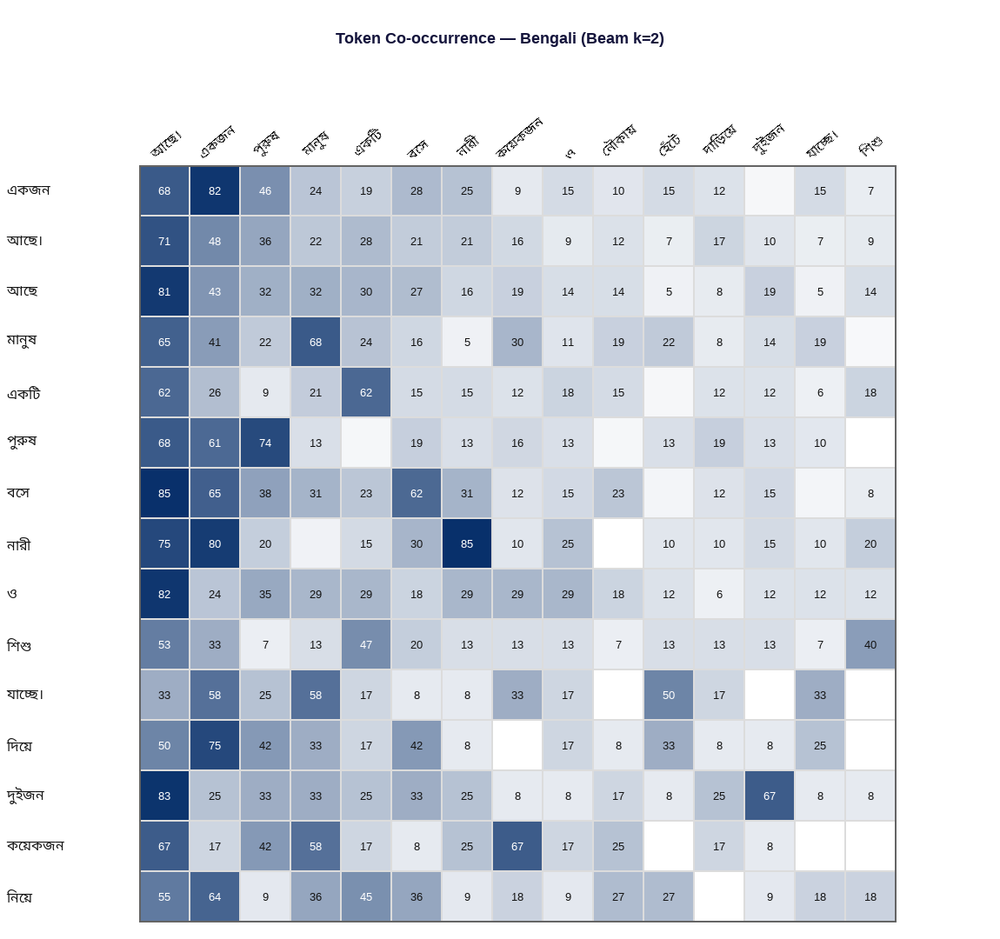

  Saved: confusion_matrix_bn.png + .pdf


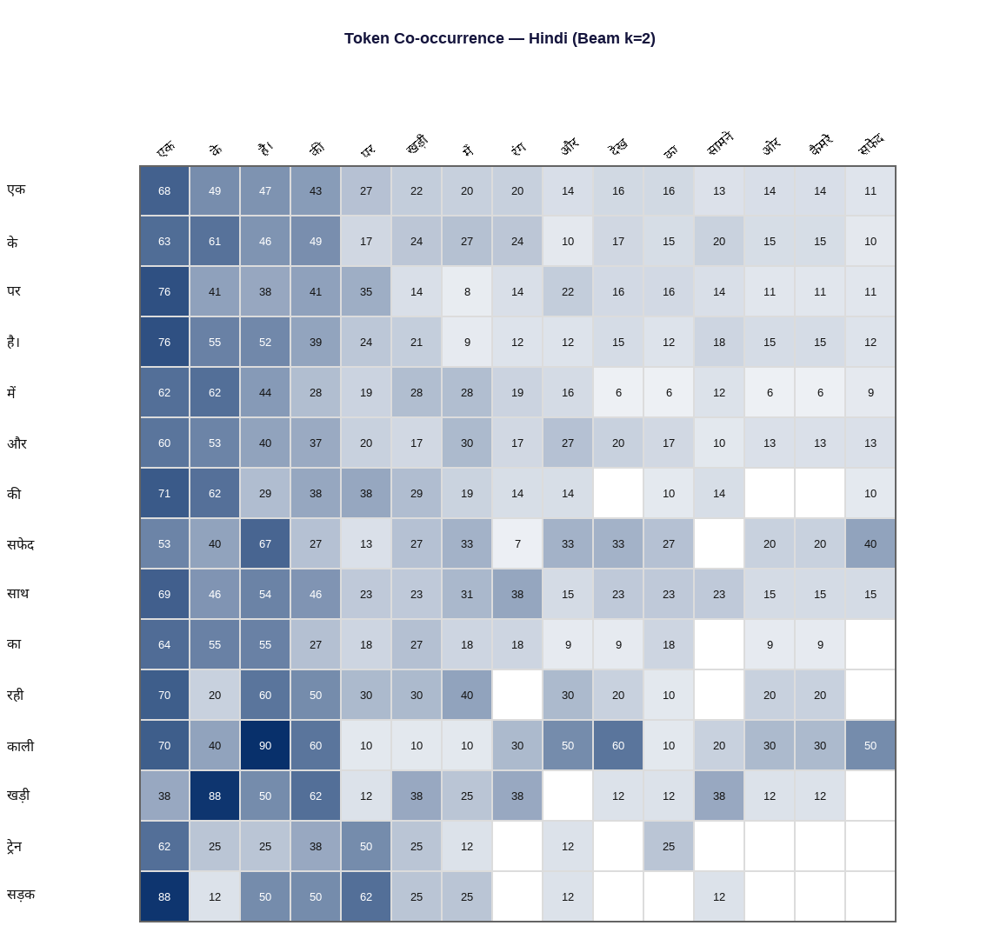

  Saved: confusion_matrix_hi.png + .pdf


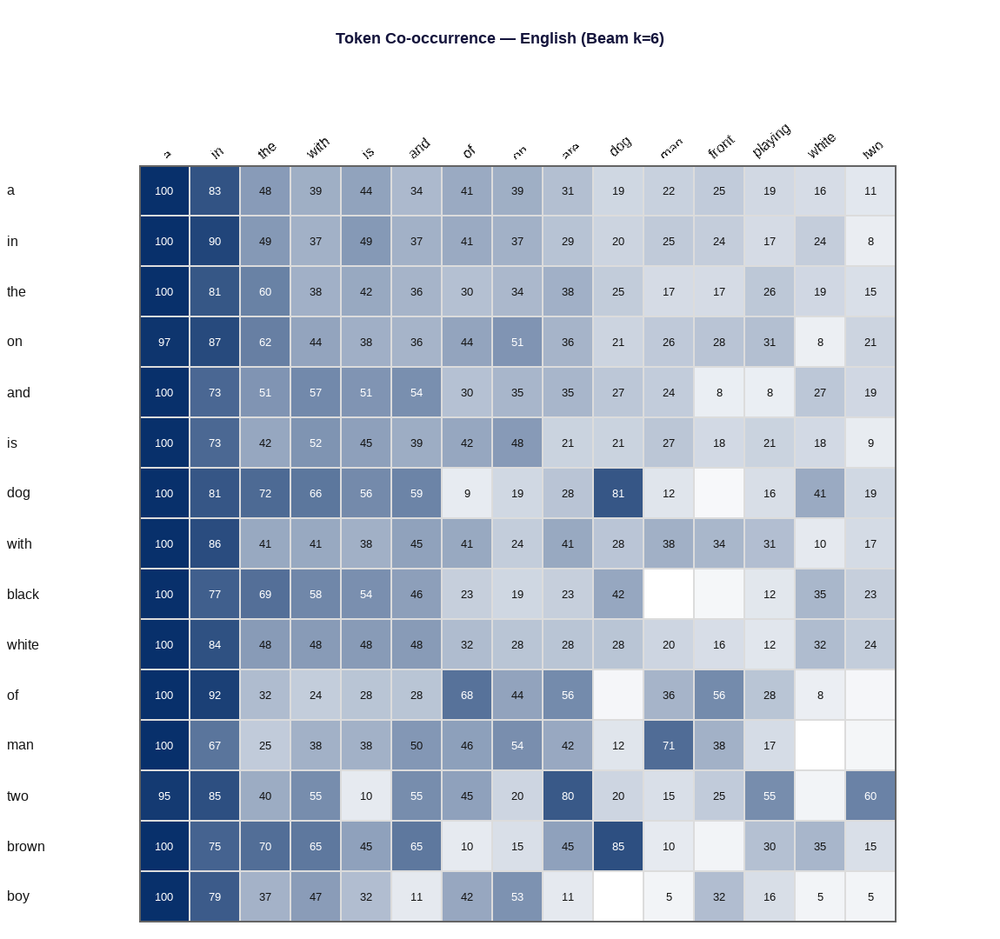

  Saved: confusion_matrix_en.png + .pdf
Confusion matrix figures saved.


In [21]:
# Cell 19 — Confusion matrix (token co-occurrence), PIL, one figure per language
def build_cooc(records, lang, model_l, beam_k, top_n=15, max_s=150):
    seen = set(); rf = Counter(); pc = defaultdict(Counter)
    with torch.no_grad():
        for r in records:
            if r["image"] in seen or not get_emb_path(r["image"]).exists(): continue
            seen.add(r["image"])
            if len(seen) > max_s: break
            try:
                emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
                gen = model_l.generate(emb, beam=beam_k)
            except Exception: gen = "."
            gen = gen or "."
            for rw in set(r["caption"].split()):
                rf[rw] += 1
                for gw in set(gen.split()): pc[rw][gw] += 1
    top_ref = [w for w, _ in rf.most_common(top_n)]
    if not top_ref: return np.zeros((top_n, top_n)), ["?"]*top_n, ["?"]*top_n
    gf = Counter()
    for rw in top_ref: gf.update(pc[rw])
    top_gen = [w for w, _ in gf.most_common(top_n)] or top_ref[:]
    mat = np.zeros((len(top_ref), len(top_gen)), dtype=float)
    for ri, rw in enumerate(top_ref):
        tot = rf[rw] or 1
        for ci, gw in enumerate(top_gen): mat[ri,ci] = pc[rw][gw]/tot*100
    return mat, top_ref, top_gen

def build_cm_pil_lang(mat, row_labels, col_labels, lang, title):
    n_r, n_c = len(row_labels), len(col_labels)
    CELL=58; YLAB_W=140; XLAB_H=120; PAD=20; TITLE_H=50; CB_W=40
    mw, mh = n_c*CELL, n_r*CELL
    img_w = PAD + YLAB_W + mw + CB_W + 60 + PAD
    img_h = PAD + TITLE_H + XLAB_H + mh + PAD
    img = Image.new("RGB",(img_w,img_h),(255,255,255))
    d = ImageDraw.Draw(img)
    draw_center(d, title, img_w//2, PAD+TITLE_H//2, get_font("en",18,bold=True), (20,20,60))
    mx0, my0 = PAD+YLAB_W, PAD+TITLE_H+XLAB_H
    vmax = max(mat.max(), 1)

    def blues(v):
        r = int(255-v*(255-8)); g = int(255-v*(255-48)); b = int(255-v*(255-107))
        return (max(0,r),max(0,g),max(0,b))

    for i in range(n_r):
        for j in range(n_c):
            v = mat[i,j]/vmax
            x0,y0 = mx0+j*CELL, my0+i*CELL
            d.rectangle([x0,y0,x0+CELL-1,y0+CELL-1], fill=blues(v), outline=(220,220,220))
            if mat[i,j] > 5:
                col = (255,255,255) if v>0.5 else (20,20,20)
                draw_center(d, f"{mat[i,j]:.0f}", x0+CELL//2, y0+CELL//2, get_font("en",13), col)
    for i,w in enumerate(row_labels):
        draw_left(d, w, 8, my0+i*CELL+CELL//2, pick_font(w, lang, 16), (20,20,20))
    for j,w in enumerate(col_labels):
        f = pick_font(w, lang, 16)
        tw,th,_ = text_wh(d, w, f)
        tmp = Image.new("RGBA",(tw+6,th+6),(255,255,255,0))
        ImageDraw.Draw(tmp).text((3,3), w, font=f, fill=(20,20,20))
        tmp_r = tmp.rotate(40, expand=True)
        img.paste(tmp_r, (mx0+j*CELL+CELL//2-tmp_r.width//2, my0-tmp_r.height-4), tmp_r)
    d.rectangle([mx0,my0,mx0+mw,my0+mh], outline=(100,100,100), width=2)
    return img

LANG_CM = [("bn","Bengali",te_bn),("hi","Hindi",te_hi),("en","English",te_en)]
for lang, lname, te_recs in LANG_CM:
    model_l = models[lang]; model_l.eval()
    mat, tr_, tg = build_cooc(te_recs, lang, model_l, CFG.BEST_BEAM[lang], 15, 150)
    img = build_cm_pil_lang(mat, tr_, tg, lang, f"Token Co-occurrence — {lname} (Beam k={CFG.BEST_BEAM[lang]})")
    save_show_dual(img, f"{CFG.FIG_DIR}/confusion_matrix_{lang}")
print("Confusion matrix figures saved.")

  Loaded: clipcap_bn_best.pt
  Loaded: clipcap_hi_best.pt
  Loaded: clipcap_en_best.pt


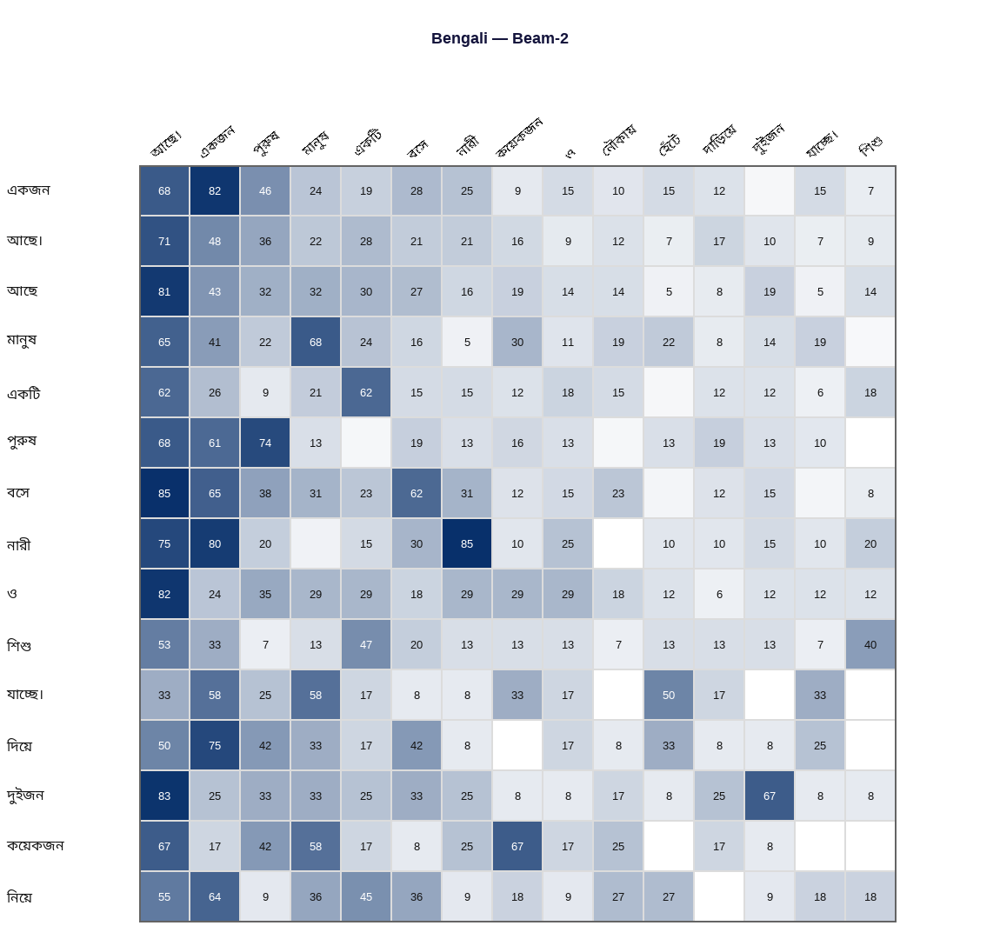

  Saved: confusion_matrix_bn_beam2.png + .pdf


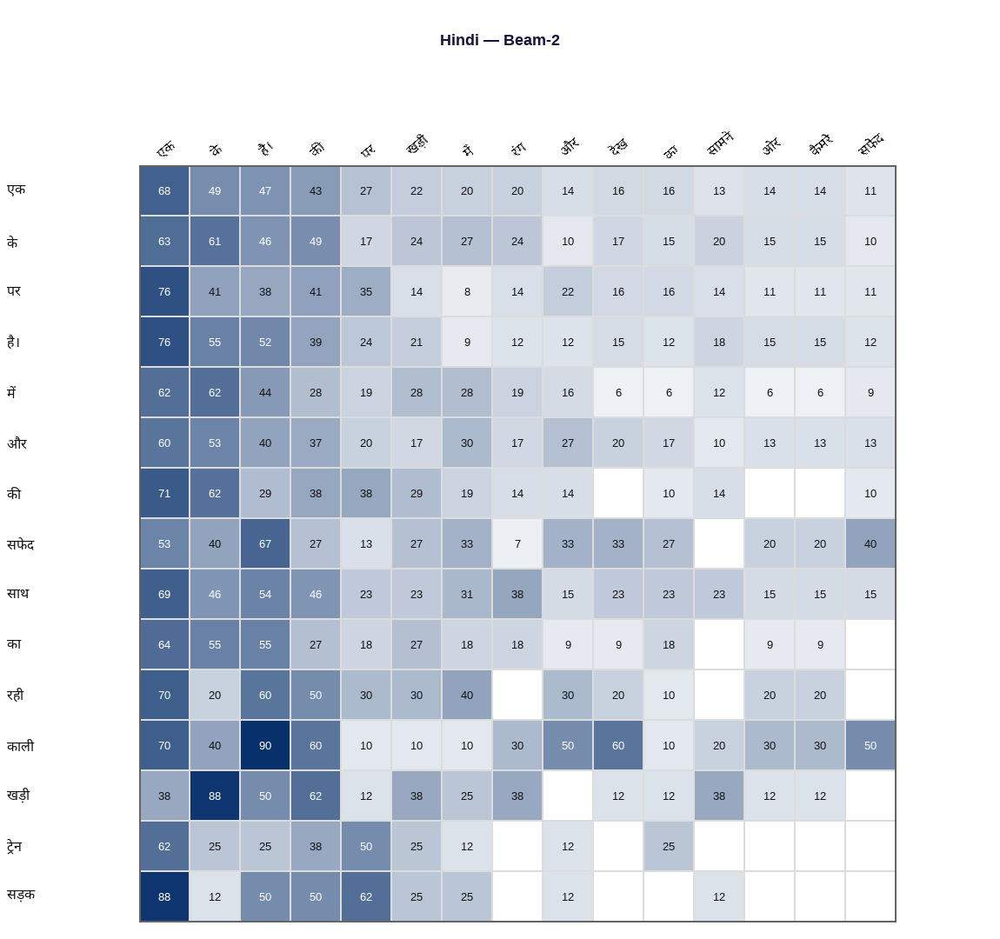

  Saved: confusion_matrix_hi_beam2.png + .pdf


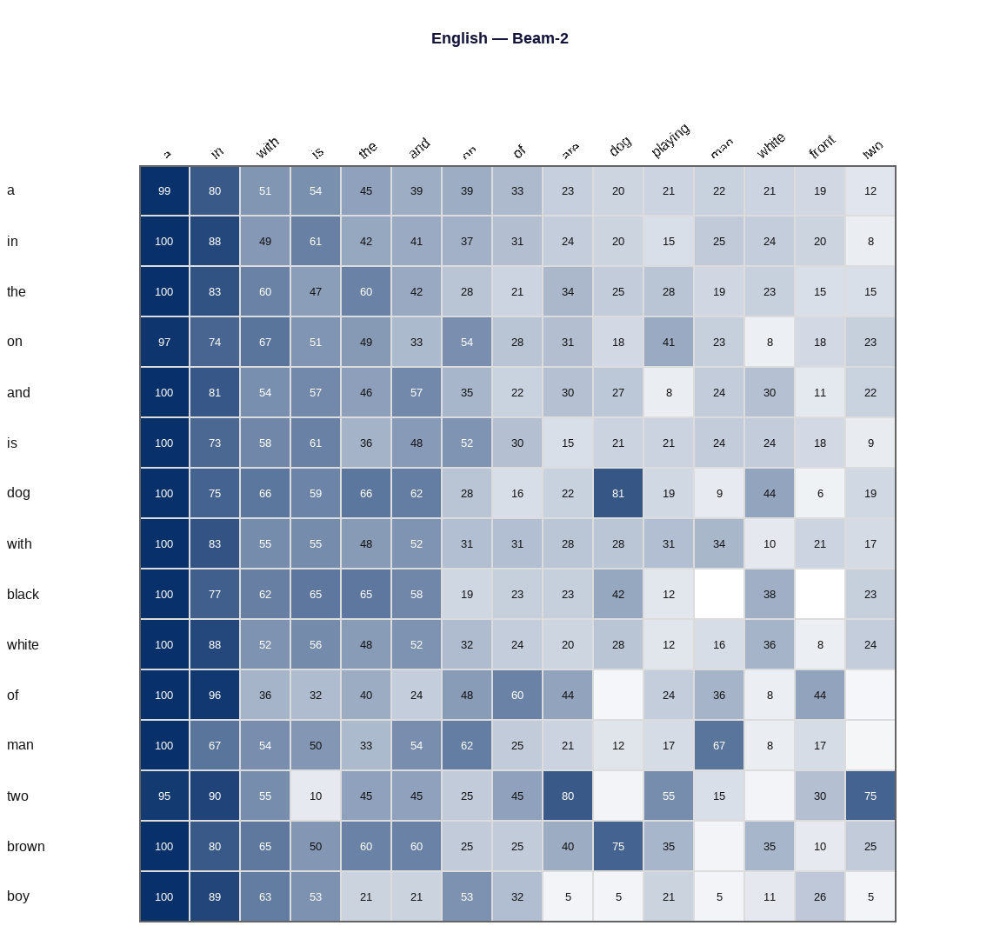

  Saved: confusion_matrix_en_beam2.png + .pdf


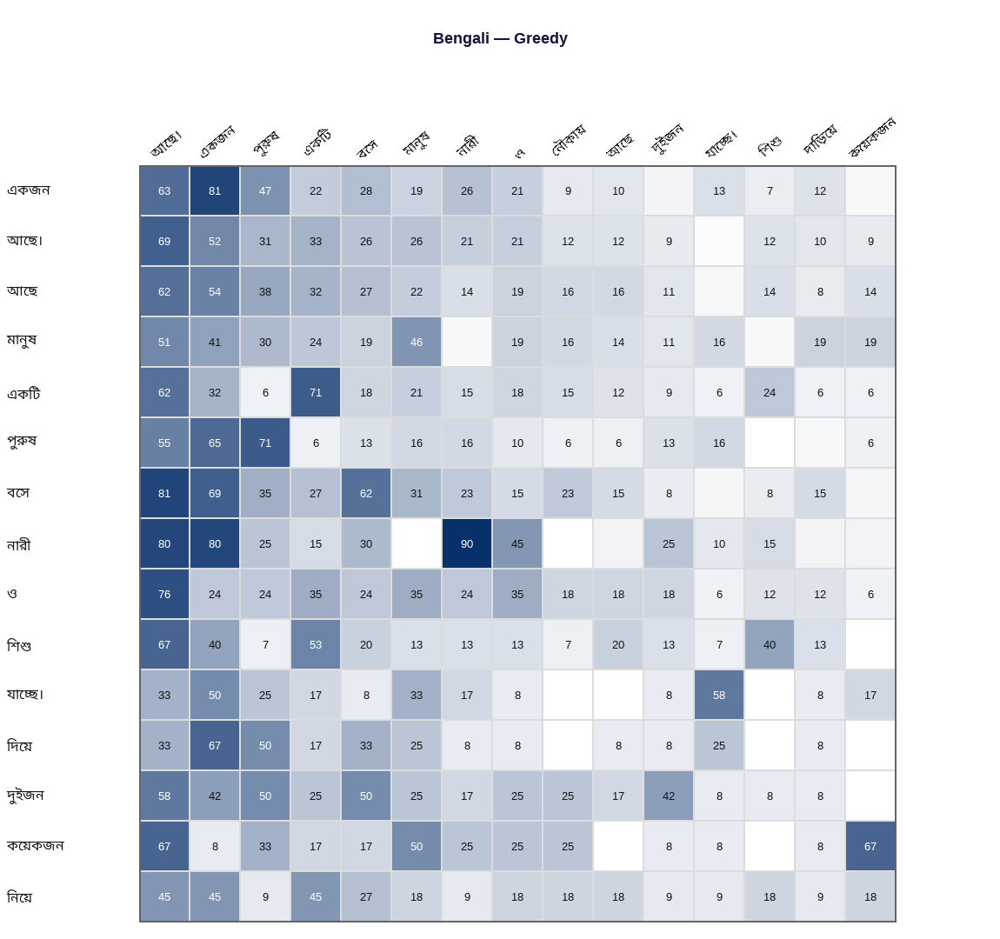

  Saved: confusion_matrix_bn_greedy.png + .pdf


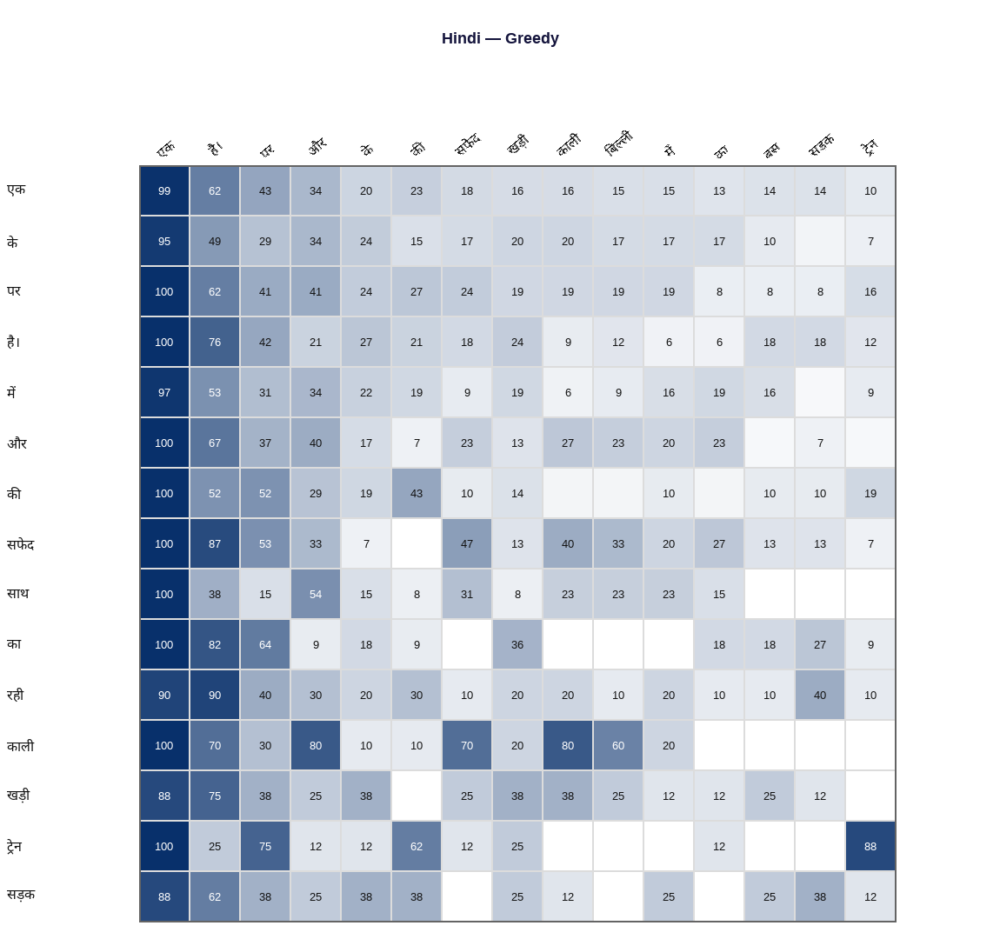

  Saved: confusion_matrix_hi_greedy.png + .pdf


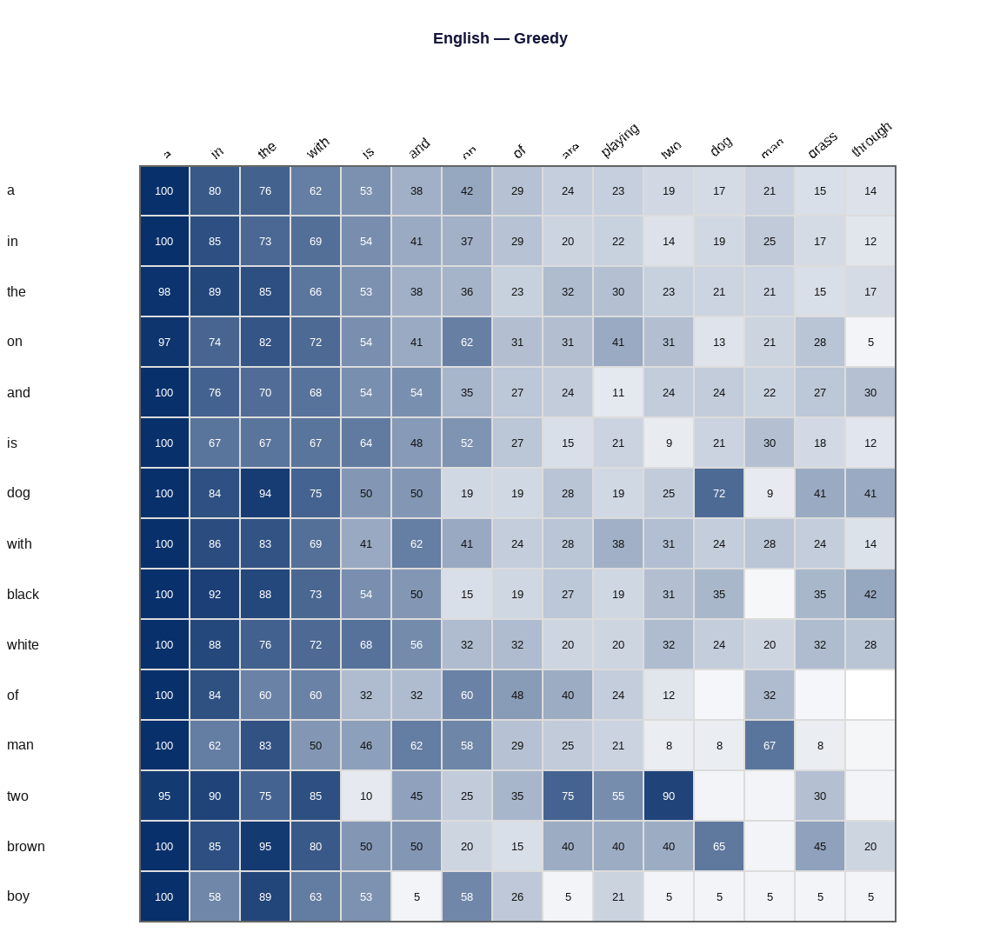

  Saved: confusion_matrix_en_greedy.png + .pdf
Beam vs Greedy confusion matrix figures saved.


In [22]:
# Cell 19B — Beam vs Greedy confusion matrices (PIL, separate per lang per strategy)
for lang in ["bn","hi","en"]:
    load_ckpt(models[lang], all_ckpts[lang]); models[lang].eval()

STRATEGIES = [(f"Beam-{CFG.BEST_BEAM['bn']}", CFG.BEST_BEAM["bn"]), ("Greedy", 1)]
LANG_CM_EXT = [("bn","Bengali",te_bn),("hi","Hindi",te_hi),("en","English",te_en)]

for strategy_name, beam_k in STRATEGIES:
    for lang, lname, te_recs in LANG_CM_EXT:
        model_l = models[lang]; model_l.eval()
        mat, tr_, tg = build_cooc(te_recs, lang, model_l, beam_k, 15, 150)
        img = build_cm_pil_lang(mat, tr_, tg, lang, f"{lname} — {strategy_name}")
        save_show_dual(img, f"{CFG.FIG_DIR}/confusion_matrix_{lang}_{strategy_name.lower().replace('-','')}")
print("Beam vs Greedy confusion matrix figures saved.")

# **Sample Predictions**

  Loaded: clipcap_bn_best.pt
  Loaded: clipcap_hi_best.pt
  Loaded: clipcap_en_best.pt


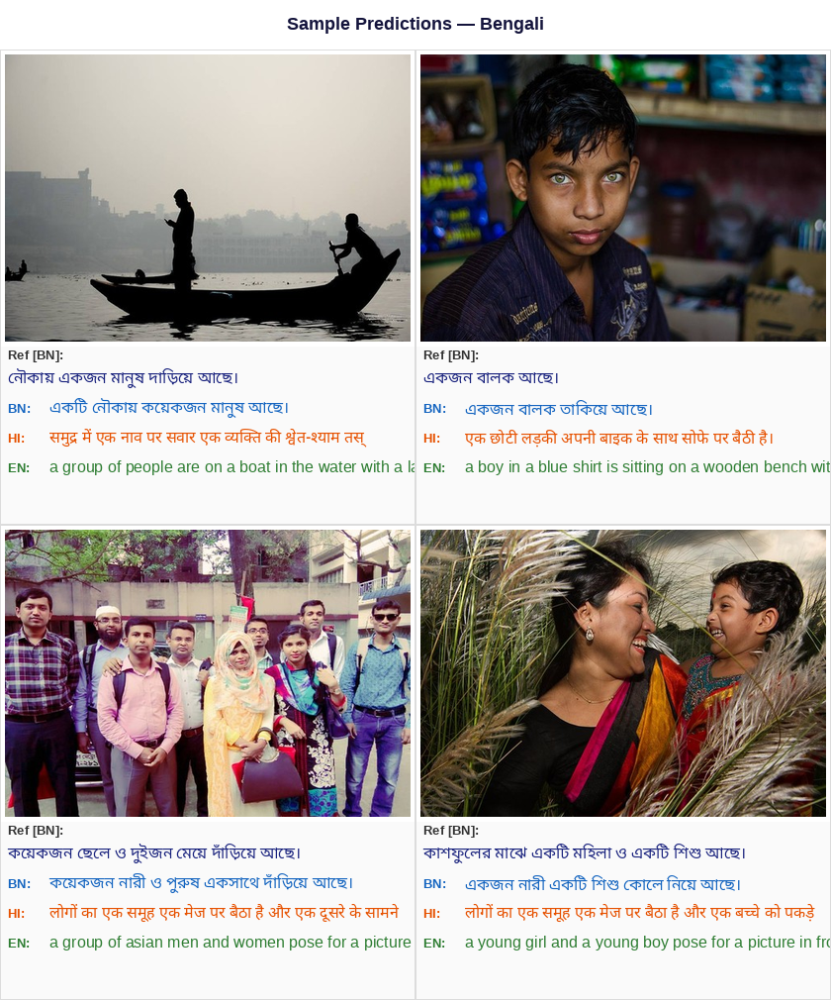

  Saved: sample_predictions_bn.png + .pdf


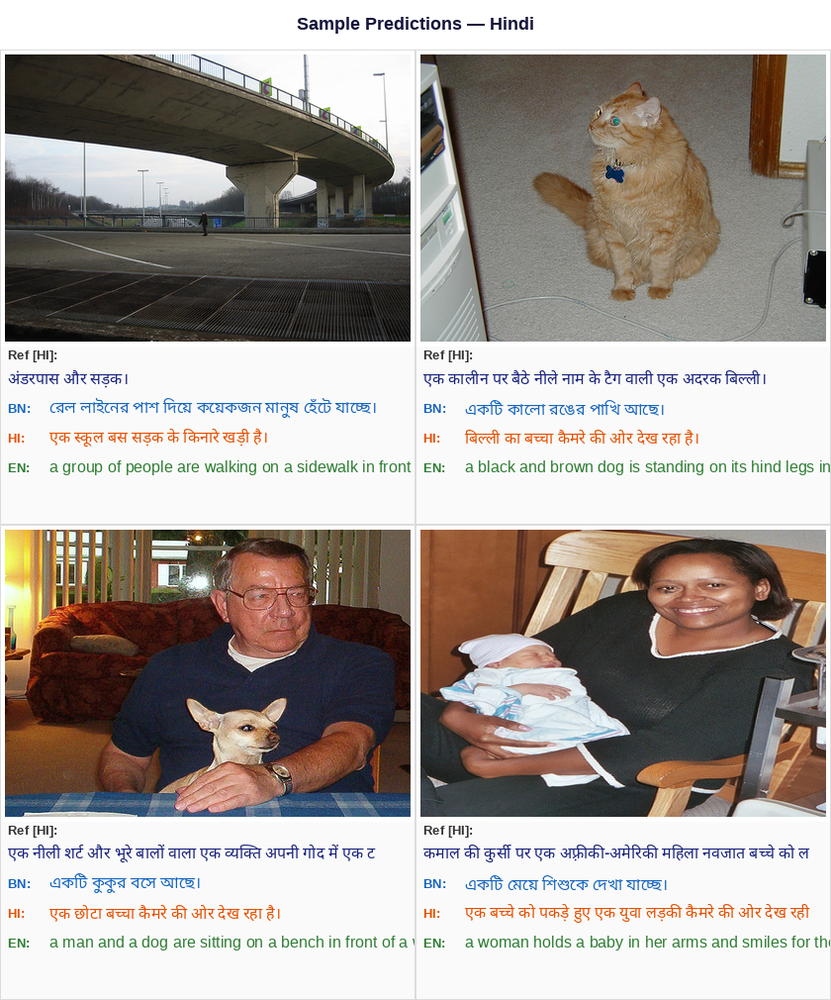

  Saved: sample_predictions_hi.png + .pdf


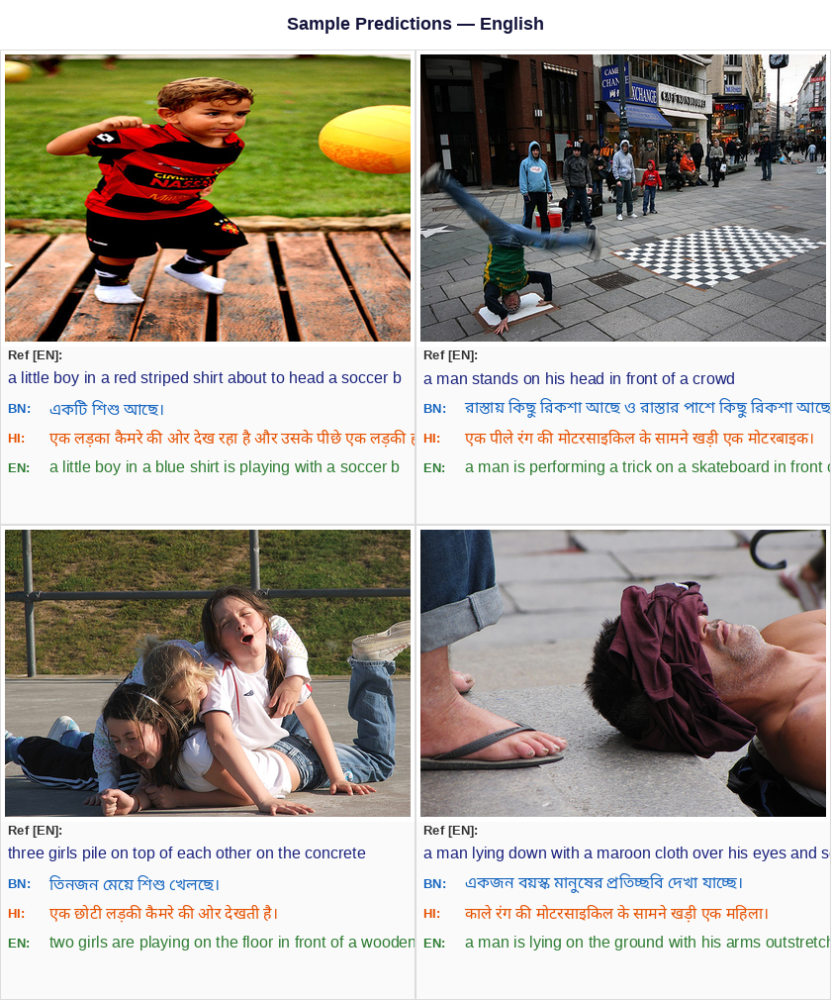

  Saved: sample_predictions_en.png + .pdf
Sample prediction figures saved.


In [23]:
# Cell 19C — Sample predictions (PIL, one grid per language)
for lang in ["bn","hi","en"]:
    load_ckpt(models[lang], all_ckpts[lang]); models[lang].eval()

def get_caption_for_image(img_path, lang):
    ep = get_emb_path(img_path)
    if not ep.exists(): return "[embedding missing]"
    try:
        emb = torch.load(str(ep), weights_only=True).float()
        return models[lang].generate(emb) or "."
    except Exception:
        return "[err]"

def build_sample_card(img_path, ref, ref_lang):
    CARD_W, IMG_H, TEXT_H = 420, 300, 180
    card = Image.new("RGB",(CARD_W, IMG_H+TEXT_H),(255,255,255))
    d = ImageDraw.Draw(card)
    try:
        pil = Image.open(img_path).convert("RGB").resize((CARD_W-10, IMG_H-10), Image.LANCZOS)
        card.paste(pil,(5,5))
    except Exception:
        d.rectangle([5,5,CARD_W-5,IMG_H-5], fill=(180,180,180))
    d.rectangle([0,IMG_H,CARD_W,IMG_H+TEXT_H], fill=(250,250,250))
    y = IMG_H+10
    draw_left(d, f"Ref [{ref_lang.upper()}]:", 8, y, get_font("en",13,bold=True), (50,50,50)); y+=22
    draw_left(d, ref[:60], 8, y, pick_font(ref, ref_lang, 16), (26,35,126)); y+=30
    for gl, col in [("bn",(21,101,192)),("hi",(230,81,0)),("en",(46,125,50))]:
        gen = get_caption_for_image(img_path, gl)
        draw_left(d, f"{gl.upper()}:", 8, y, get_font("en",13,bold=True), col)
        draw_left(d, gen[:55], 50, y, pick_font(gen, gl, 16), col); y+=30
    d.rectangle([0,0,CARD_W-1,IMG_H+TEXT_H-1], outline=(220,220,220), width=1)
    return card

for lang in ["bn","hi","en"]:
    te_recs = {"bn":te_bn,"hi":te_hi,"en":te_en}[lang]
    pool = [r for r in te_recs if get_emb_path(r["image"]).exists()]
    picks = random.Random(SEED+1).sample(pool, min(4, len(pool)))
    cards = [build_sample_card(r["image"], r["caption"], lang) for r in picks]
    cols, rows = 2, math.ceil(len(cards)/2)
    CW, CH = cards[0].width, cards[0].height
    grid = Image.new("RGB",(cols*CW, rows*CH+50),(255,255,255))
    d = ImageDraw.Draw(grid)
    draw_center(d, f"Sample Predictions — {LANG_NAMES[lang]}", grid.width//2, 25,
                get_font("en",18,bold=True),(20,20,60))
    for i,c in enumerate(cards):
        r,cc = i//cols, i%cols
        grid.paste(c, (cc*CW, 50+r*CH))
    save_show_dual(grid, f"{CFG.FIG_DIR}/sample_predictions_{lang}")
print("Sample prediction figures saved.")

# **Token overlap heatmap**

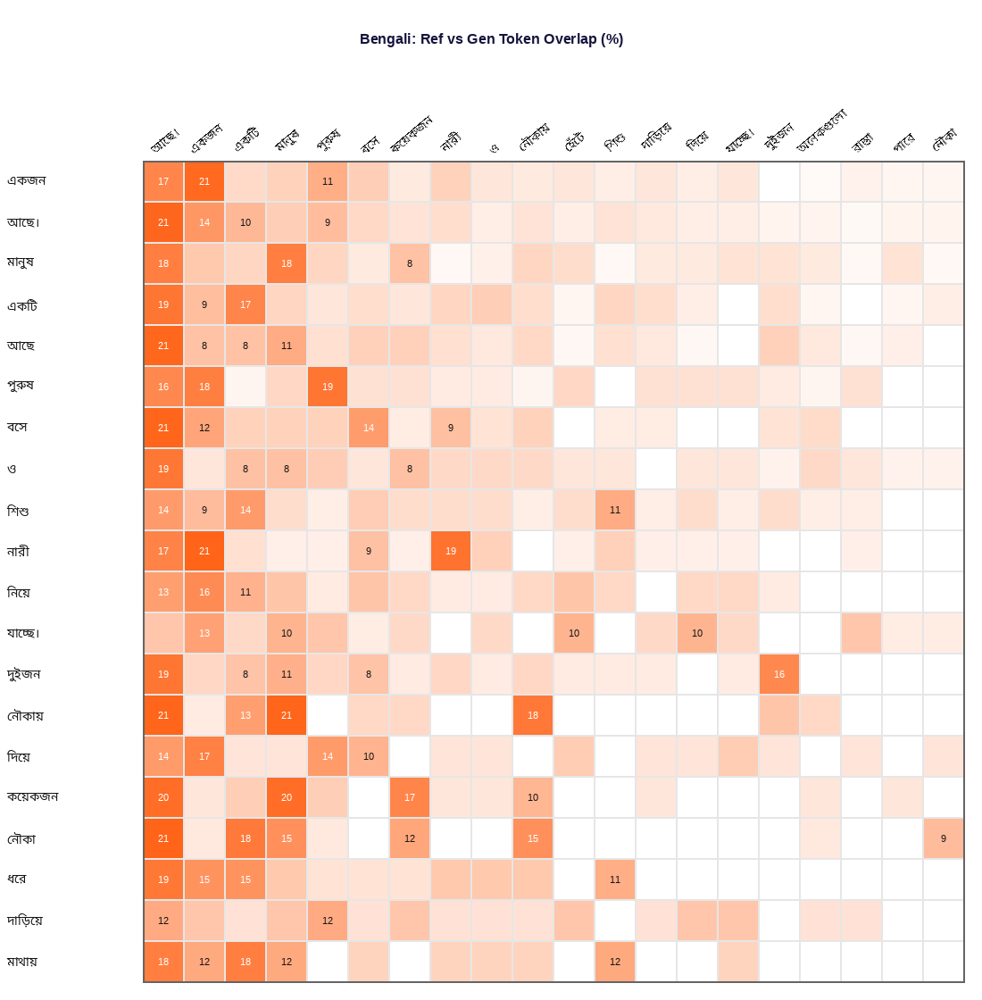

  Saved: token_heatmap_bn.png + .pdf


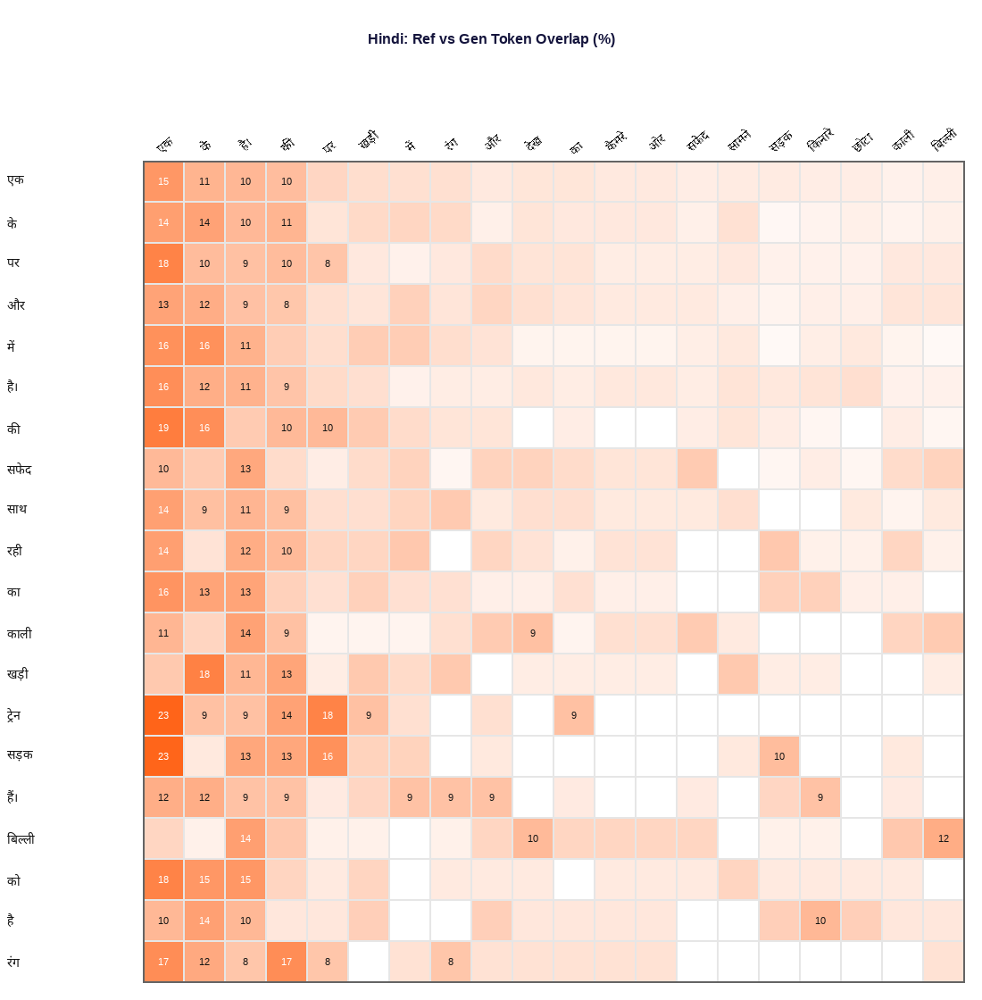

  Saved: token_heatmap_hi.png + .pdf


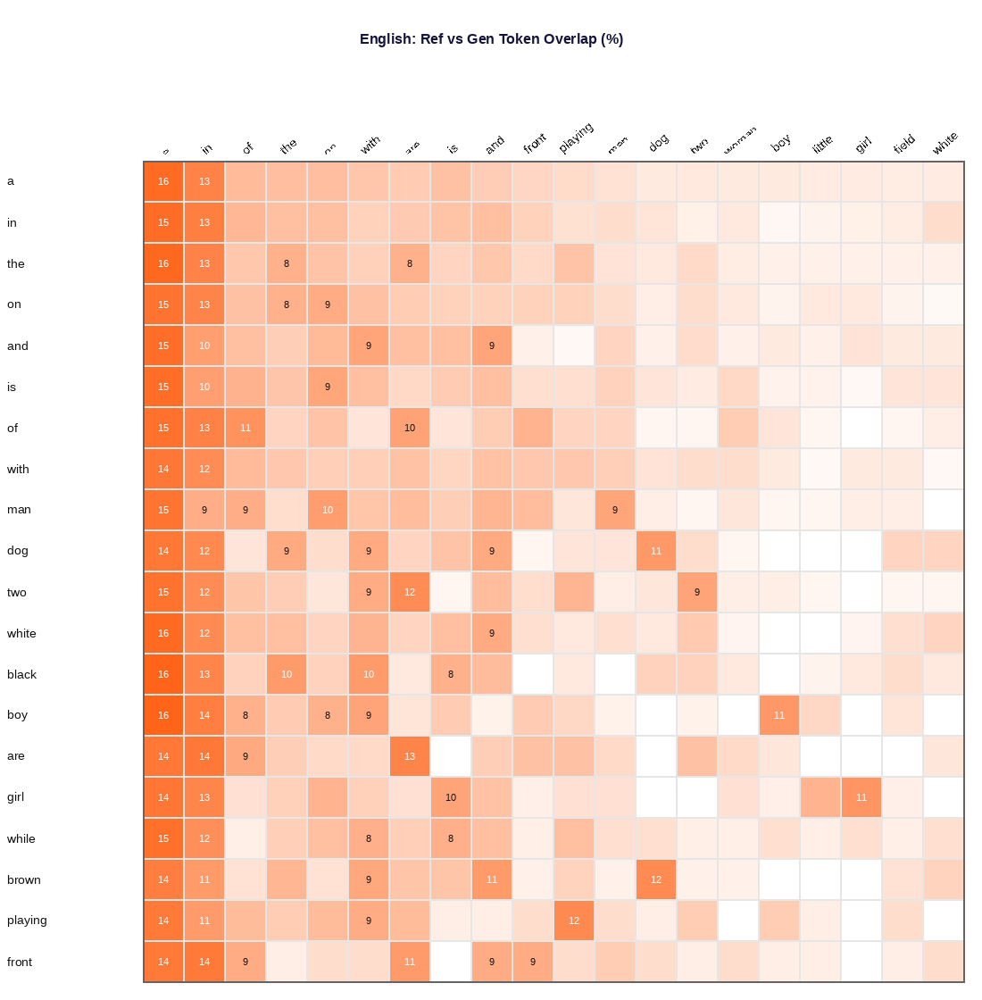

  Saved: token_heatmap_en.png + .pdf
Token heatmap figures saved.


In [24]:
# Cell 20 — Token overlap heatmap (PIL, one figure per language)
def build_heatmap(records, lang, model_l, top_n=20, max_s=100):
    seen = set(); rts = []; hts = []
    with torch.no_grad():
        for r in records:
            if r["image"] in seen or not get_emb_path(r["image"]).exists(): continue
            seen.add(r["image"])
            if len(seen) > max_s: break
            try:
                emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
                gen = model_l.generate(emb, beam=CFG.BEST_BEAM[lang])
            except Exception: gen = "."
            gen = gen or "."
            rts.extend(r["caption"].split()); hts.extend(gen.split())
    rv = [w for w, _ in Counter(rts).most_common(top_n)]
    hv = [w for w, _ in Counter(hts).most_common(top_n)]
    if not rv or not hv: return np.zeros((top_n, top_n)), rv or ["?"], hv or ["?"]
    cooc = np.zeros((len(rv), len(hv)), dtype=float)
    seen2 = set()
    with torch.no_grad():
        for r in records:
            if r["image"] in seen2 or not get_emb_path(r["image"]).exists(): continue
            seen2.add(r["image"])
            if len(seen2) > max_s: break
            try:
                emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
                gen = model_l.generate(emb, beam=CFG.BEST_BEAM[lang])
            except Exception: gen = "."
            gen = gen or "."
            rt = set(r["caption"].split()); ht = set(gen.split())
            for ri, rw in enumerate(rv):
                if rw in rt:
                    for ci, hw in enumerate(hv):
                        if hw in ht: cooc[ri,ci] += 1
    rs = cooc.sum(axis=1, keepdims=True)
    return np.where(rs > 0, cooc/rs*100, 0), rv, hv

def build_heatmap_pil(mat, rv, hv, lang, title):
    CELL=46; YLAB_W=140; XLAB_H=110; PAD=20; TITLE_H=50
    mw,mh = len(hv)*CELL, len(rv)*CELL
    img = Image.new("RGB",(PAD+YLAB_W+mw+PAD, PAD+TITLE_H+XLAB_H+mh+PAD),(255,255,255))
    d = ImageDraw.Draw(img)
    draw_center(d, title, img.width//2, PAD+TITLE_H//2, get_font("en",16,bold=True),(20,20,60))
    mx0,my0 = PAD+YLAB_W, PAD+TITLE_H+XLAB_H
    vmax = max(mat.max(),1)
    def ylorrd(v):
        r=255; g=int(255-v*155); b=int(255-v*230)
        return (r,max(0,g),max(0,b))
    for i in range(len(rv)):
        for j in range(len(hv)):
            v = mat[i,j]/vmax
            x0,y0 = mx0+j*CELL, my0+i*CELL
            d.rectangle([x0,y0,x0+CELL-1,y0+CELL-1], fill=ylorrd(v), outline=(230,230,230))
            if mat[i,j] > 8:
                col = (255,255,255) if v>0.6 else (20,20,20)
                draw_center(d, f"{mat[i,j]:.0f}", x0+CELL//2, y0+CELL//2, get_font("en",11), col)
    for i,w in enumerate(rv):
        draw_left(d, w, 8, my0+i*CELL+CELL//2, pick_font(w, lang, 14), (20,20,20))
    for j,w in enumerate(hv):
        f = pick_font(w, lang, 14)
        tw,th,_ = text_wh(d,w,f)
        tmp = Image.new("RGBA",(tw+6,th+6),(255,255,255,0))
        ImageDraw.Draw(tmp).text((3,3),w,font=f,fill=(20,20,20))
        tmp_r = tmp.rotate(40, expand=True)
        img.paste(tmp_r, (mx0+j*CELL+CELL//2-tmp_r.width//2, my0-tmp_r.height-4), tmp_r)
    d.rectangle([mx0,my0,mx0+mw,my0+mh], outline=(100,100,100), width=2)
    return img

for lang, lname, te_recs in [("bn","Bengali",te_bn),("hi","Hindi",te_hi),("en","English",te_en)]:
    model_l = models[lang]; model_l.eval()
    mat, rv, hv = build_heatmap(te_recs, lang, model_l, 20, 100)
    img = build_heatmap_pil(mat, rv, hv, lang, f"{lname}: Ref vs Gen Token Overlap (%)")
    save_show_dual(img, f"{CFG.FIG_DIR}/token_heatmap_{lang}")
print("Token heatmap figures saved.")

# **Error Analysis**


  [BN] Mean sent-BLEU-4=23.80  n=100


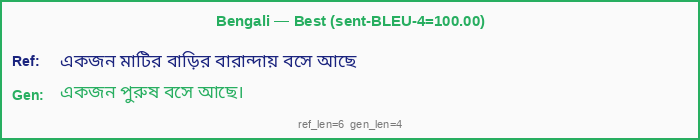

  Saved: error_bn_best.png + .pdf


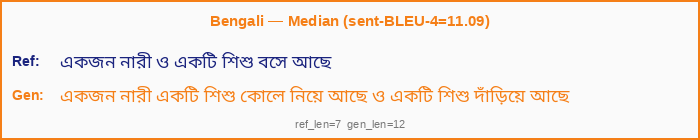

  Saved: error_bn_median.png + .pdf


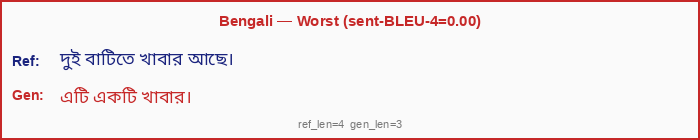

  Saved: error_bn_worst.png + .pdf

  [HI] Mean sent-BLEU-4=9.58  n=100


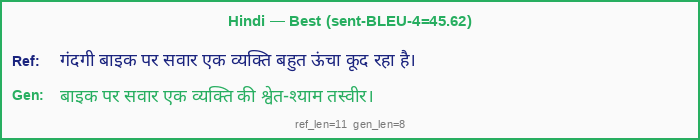

  Saved: error_hi_best.png + .pdf


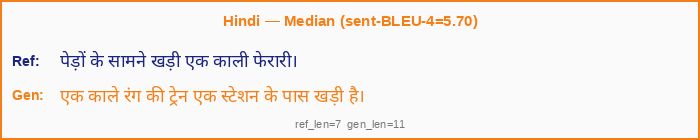

  Saved: error_hi_median.png + .pdf


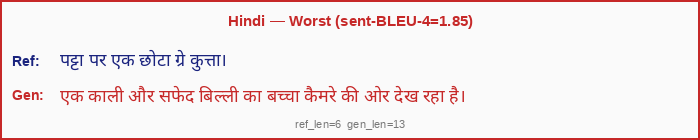

  Saved: error_hi_worst.png + .pdf

  [EN] Mean sent-BLEU-4=15.42  n=100


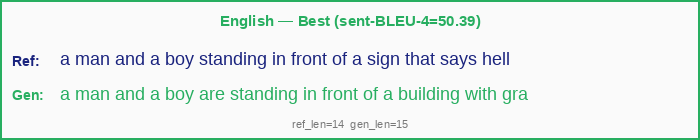

  Saved: error_en_best.png + .pdf


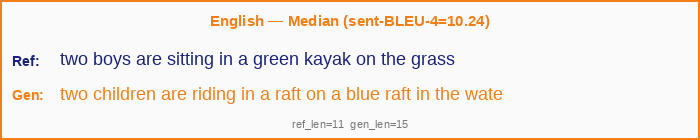

  Saved: error_en_median.png + .pdf


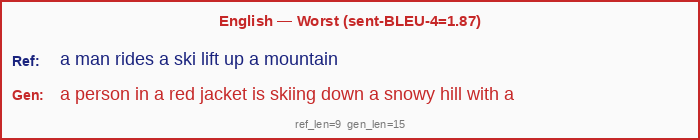

  Saved: error_en_worst.png + .pdf
Error analysis figures saved.


In [25]:
# Cell 21 — Error analysis (PIL, one figure per language x {Best, Median, Worst})
for lang in ["bn","hi","en"]: models[lang].eval()

def run_error_analysis(lang, model_l, test_records, img2caps, n_samples=100):
    seen = set(); scores = []
    with torch.no_grad():
        for r in test_records:
            if r["image"] in seen or r["lang"] != lang \
                    or not get_emb_path(r["image"]).exists(): continue
            seen.add(r["image"])
            if len(seen) > n_samples: break
            try:
                emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
                gen = model_l.generate(emb)
            except Exception: gen = "."
            gen = gen or "."
            all_refs = img2caps.get(r["image"], [r["caption"]])
            score    = compute_sent_bleu4(all_refs, gen)
            scores.append({"lang":lang,"ref":all_refs[0],"gen":gen,"bleu4":score,
                           "ref_len":len(all_refs[0].split()),
                           "gen_len":len(gen.split())})
    scores.sort(key=lambda x: x["bleu4"])
    mid = len(scores) // 2
    return scores[:3], scores[max(0,mid-1):mid+2], scores[-3:][::-1], scores

def build_error_card(sample, gname, lang, color):
    W,H = 700, 140
    img = Image.new("RGB",(W,H),(250,250,250))
    d = ImageDraw.Draw(img)
    d.rectangle([0,0,W-1,H-1], outline=color, width=2)
    draw_center(d, f"{LANG_NAMES[lang]} — {gname} (sent-BLEU-4={sample['bleu4']:.2f})",
                W//2, 22, get_font("en",15,bold=True), color)
    draw_left(d, "Ref:", 12, 60, get_font("en",14,bold=True), (26,35,126))
    draw_left(d, sample["ref"][:60], 60, 60, pick_font(sample["ref"], lang, 18), (26,35,126))
    draw_left(d, "Gen:", 12, 95, get_font("en",14,bold=True), color)
    draw_left(d, sample["gen"][:60], 60, 95, pick_font(sample["gen"], lang, 18), color)
    draw_center(d, f"ref_len={sample['ref_len']}  gen_len={sample['gen_len']}",
                W//2, 125, get_font("en",11), (120,120,120))
    return img

error_data = {}
for lang, te_recs, img2c in [("bn",te_bn,te_bn_img2caps),("hi",te_hi,te_hi_img2caps),("en",te_en,te_en_img2caps)]:
    worst, median, best, all_s = run_error_analysis(lang, models[lang], te_recs, img2c)
    error_data[lang] = {"worst":worst,"median":median,"best":best}
    mean_b4 = np.mean([s["bleu4"] for s in all_s]) if all_s else 0.
    print(f"\n  [{lang.upper()}] Mean sent-BLEU-4={mean_b4:.2f}  n={len(all_s)}")
    for gname, samples, color in [("Best", best, (39,174,96)),
                                    ("Median", median, (245,127,23)),
                                    ("Worst", worst, (198,40,40))]:
        if samples:
            img = build_error_card(samples[0], gname, lang, color)
            save_show_dual(img, f"{CFG.FIG_DIR}/error_{lang}_{gname.lower()}")

with open(f"{CFG.OUTPUT_DIR}/error_analysis.json","w",encoding="utf-8") as f:
    json.dump({l:{k:[{kk:vv for kk,vv in s.items()} for s in v] for k,v in d.items()}
               for l,d in error_data.items()},f,indent=2,ensure_ascii=False)
print("Error analysis figures saved.")

# **Prefix length Ablation**

PREFIX LENGTH ABLATION — testing [6, 10, 14]
  ABL train=3878  test=80

  prefix_len=6 ...
  [bn] Loading shahidul034/BanglaGPT ...


Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

  [bn] MLP trainable (warmup phase).
  [bn] Total:135.3M  Trainable:135.3M
    6: BLEU-4=0.00  METEOR=13.57

  prefix_len=10 ...
  [bn] Loading shahidul034/BanglaGPT ...


Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

  [bn] MLP trainable (warmup phase).
  [bn] Total:141.6M  Trainable:141.6M
    10: BLEU-4=0.00  METEOR=13.41

  prefix_len=14 ...
  [bn] Loading shahidul034/BanglaGPT ...


Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

  [bn] MLP trainable (warmup phase).
  [bn] Total:147.8M  Trainable:147.8M
    14: BLEU-4=7.02  METEOR=21.27

  Best prefix length: 14


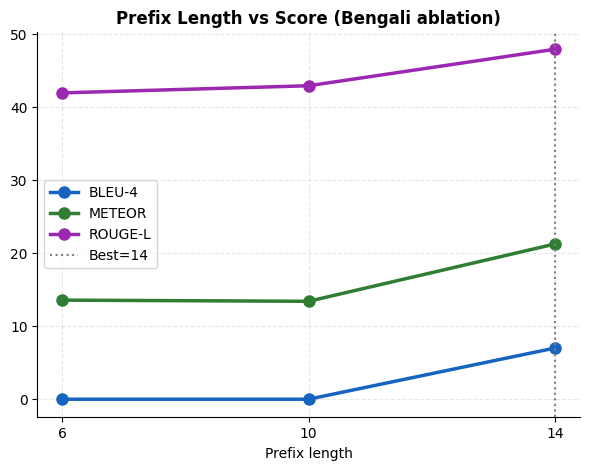

  Saved: prefix_ablation_lineplot.png + .pdf


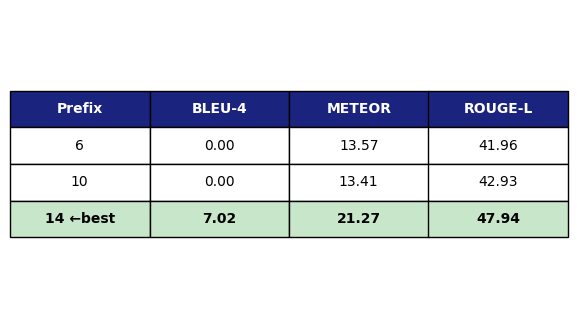

  Saved: prefix_ablation_table.png + .pdf
Prefix ablation figures saved.


In [26]:
# Cell 22 — Prefix length ablation
print(f"PREFIX LENGTH ABLATION — testing {CFG.PREFIX_VALS}")

abl_tr = random.Random(42).sample(
    [r for r in bnature if get_emb_path(r["image"]).exists()],
    int(len(bnature) * CFG.ABL_FRAC)
)
abl_te = [r for r in te_bn if get_emb_path(r["image"]).exists()][:80]
print(f"  ABL train={len(abl_tr)}  test={len(abl_te)}")
prefix_results = {}

for plen in CFG.PREFIX_VALS:
    print(f"\n  prefix_len={plen} ...")
    gc.collect(); torch.cuda.empty_cache()

    m_p  = CLIPCapModel("bn", prefix_len=plen, mlp_frozen=False)
    p_ds = CaptionDataset(abl_tr, "bn")
    p_dl = DataLoader(p_ds, batch_size=CFG.BATCH, shuffle=True, num_workers=2,
                      pin_memory=True, drop_last=True, collate_fn=p_ds.collate)
    opt_p      = AdamW(list(m_p.parameters()), lr=CFG.LR, weight_decay=CFG.WEIGHT_DECAY)
    sched_p, _ = make_scheduler(opt_p, len(p_dl)*3)

    m_p.train(); opt_p.zero_grad(set_to_none=True)
    for ep_a in range(3):
        for step, (embs, ids, labs) in enumerate(p_dl):
            try:
                loss = m_p(embs.to(DEVICE), ids.to(DEVICE), labs.to(DEVICE))
                if torch.isnan(loss) or torch.isinf(loss):
                    opt_p.zero_grad(set_to_none=True); continue
                (loss/CFG.GRAD_ACCUM).backward()
                if (step+1)%CFG.GRAD_ACCUM==0 or (step+1)==len(p_dl):
                    nn.utils.clip_grad_norm_(m_p.parameters(), 1.0)
                    opt_p.step(); opt_p.zero_grad(set_to_none=True); sched_p.step()
            except RuntimeError as e:
                if "out of memory" in str(e).lower():
                    opt_p.zero_grad(set_to_none=True); gc.collect(); torch.cuda.empty_cache()
                else: raise

    m_p.eval()
    refs_a = []; hyps_a = []; seen_a = set()
    with torch.no_grad():
        for r in abl_te:
            if r["image"] in seen_a: continue
            seen_a.add(r["image"])
            try:
                emb = torch.load(str(get_emb_path(r["image"])), map_location="cpu", weights_only=True).float()
                gen = m_p.generate(emb, beam=1)
            except Exception: gen = "."
            refs_a.append([r["caption"]]); hyps_a.append(gen or ".")

    prefix_results[plen] = {
        "BLEU-4":  compute_bleu_nltk(refs_a, hyps_a, 4),
        "METEOR":  compute_meteor(refs_a, hyps_a),
        "ROUGE-L": compute_rougeL(refs_a, hyps_a, "bn"),
    }
    print(f"    {plen}: BLEU-4={prefix_results[plen]['BLEU-4']:.2f}  METEOR={prefix_results[plen]['METEOR']:.2f}")
    del m_p; gc.collect(); torch.cuda.empty_cache()

with open(f"{CFG.OUTPUT_DIR}/prefix_ablation.json","w") as f:
    json.dump({str(k):v for k,v in prefix_results.items()}, f, indent=2)

best_pref = max(CFG.PREFIX_VALS, key=lambda n: prefix_results[n]["BLEU-4"])
print(f"\n  Best prefix length: {best_pref}")

fig, ax = plt.subplots(figsize=(7,5))
for metric, col in zip(["BLEU-4","METEOR","ROUGE-L"],["#1565C0","#2E7D32","#9C27B0"]):
    ax.plot(CFG.PREFIX_VALS, [prefix_results[n][metric] for n in CFG.PREFIX_VALS],
            color=col, lw=2.5, marker="o", ms=8, label=metric)
ax.axvline(best_pref, color="gray", lw=1.5, ls=":", label=f"Best={best_pref}")
ax.set_title("Prefix Length vs Score (Bengali ablation)", fontsize=12, fontweight="bold")
ax.set_xlabel("Prefix length"); ax.set_xticks(CFG.PREFIX_VALS)
ax.legend(); ax.grid(alpha=0.3, ls="--"); ax.spines[["top","right"]].set_visible(False)
save_show_dual(fig, f"{CFG.FIG_DIR}/prefix_ablation_lineplot")

fig, ax = plt.subplots(figsize=(6,4)); ax.axis("off")
tbl_rows = [[f"{n}"+(" ←best" if n==best_pref else ""), f"{prefix_results[n]['BLEU-4']:.2f}",
             f"{prefix_results[n]['METEOR']:.2f}", f"{prefix_results[n]['ROUGE-L']:.2f}"]
            for n in CFG.PREFIX_VALS]
t = ax.table(cellText=tbl_rows, colLabels=["Prefix","BLEU-4","METEOR","ROUGE-L"], cellLoc="center", loc="center")
t.auto_set_font_size(False); t.set_fontsize(10); t.scale(1.2,2.2)
for ci in range(4): t[0,ci].set_facecolor("#1A237E"); t[0,ci].set_text_props(color="white",fontweight="bold")
bi = CFG.PREFIX_VALS.index(best_pref)+1
for ci in range(4): t[bi,ci].set_facecolor("#C8E6C9"); t[bi,ci].set_text_props(fontweight="bold")
save_show_dual(fig, f"{CFG.FIG_DIR}/prefix_ablation_table")
print("Prefix ablation figures saved.")

# **Random seed robustness**

SEED ROBUSTNESS — Seeds: [42, 7, 123]

  Seed=42 ...
  [bn] Loading shahidul034/BanglaGPT ...


Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

  [bn] MLP trainable (warmup phase).
  [bn] Total:141.6M  Trainable:141.6M
    Seed=42: BLEU-4=6.34  METEOR=19.60

  Seed=7 ...
  [bn] Loading shahidul034/BanglaGPT ...


Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

  [bn] MLP trainable (warmup phase).
  [bn] Total:141.6M  Trainable:141.6M
    Seed=7: BLEU-4=0.00  METEOR=15.72

  Seed=123 ...
  [bn] Loading shahidul034/BanglaGPT ...


Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

  [bn] MLP trainable (warmup phase).
  [bn] Total:141.6M  Trainable:141.6M
    Seed=123: BLEU-4=0.00  METEOR=15.21

Mean ± Std:
  BLEU-4: 2.11 ± 2.99
  METEOR: 16.84 ± 1.96
  ROUGE-L: 46.18 ± 1.44


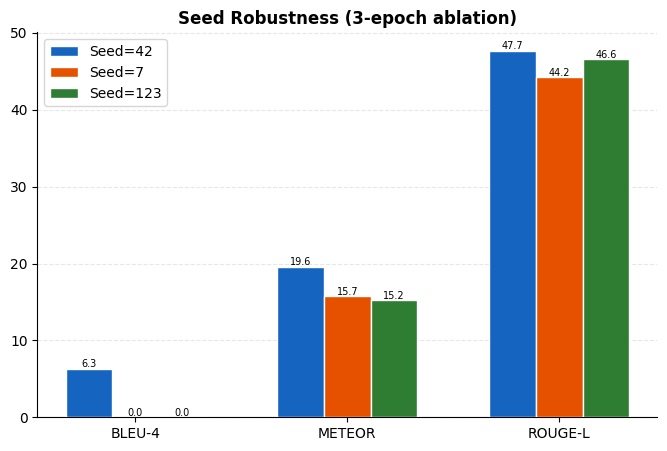

  Saved: seed_robustness_perseed.png + .pdf


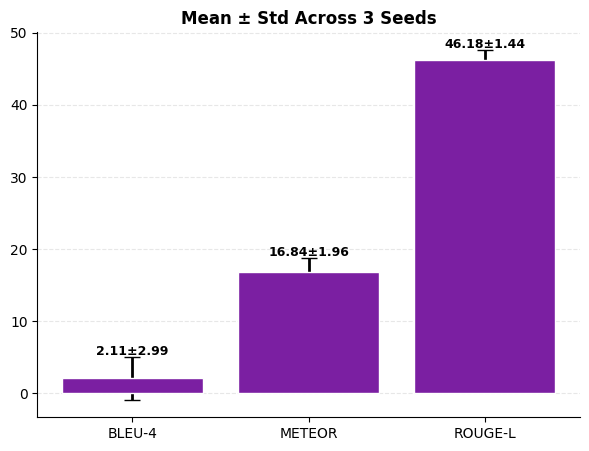

  Saved: seed_robustness_mean.png + .pdf
Seed robustness figures saved.


In [27]:
# Cell 23 — Random seed robustness
print(f"SEED ROBUSTNESS — Seeds: {CFG.SEEDS_ROB}")

abl_tr_s = random.Random(42).sample(
    [r for r in bnature if get_emb_path(r["image"]).exists()],
    int(len(bnature)*CFG.ABL_FRAC)
)
abl_te_s = [r for r in te_bn if get_emb_path(r["image"]).exists()][:80]
seed_results = {}

for sv in CFG.SEEDS_ROB:
    print(f"\n  Seed={sv} ...")
    random.seed(sv); np.random.seed(sv); torch.manual_seed(sv)
    if torch.cuda.is_available(): torch.cuda.manual_seed_all(sv)
    gc.collect(); torch.cuda.empty_cache()

    m_s  = CLIPCapModel("bn", mlp_frozen=False)
    s_ds = CaptionDataset(abl_tr_s, "bn")
    s_dl = DataLoader(s_ds, batch_size=CFG.BATCH, shuffle=True, num_workers=2,
                      pin_memory=True, drop_last=True, collate_fn=s_ds.collate)
    opt_s    = AdamW(list(m_s.parameters()), lr=CFG.LR, weight_decay=CFG.WEIGHT_DECAY)
    sch_s, _ = make_scheduler(opt_s, len(s_dl)*3)

    m_s.train(); opt_s.zero_grad(set_to_none=True)
    for ep_sv in range(3):
        for step, (embs, ids, labs) in enumerate(s_dl):
            try:
                loss = m_s(embs.to(DEVICE), ids.to(DEVICE), labs.to(DEVICE))
                if torch.isnan(loss) or torch.isinf(loss):
                    opt_s.zero_grad(set_to_none=True); continue
                (loss/CFG.GRAD_ACCUM).backward()
                if (step+1)%CFG.GRAD_ACCUM==0 or (step+1)==len(s_dl):
                    nn.utils.clip_grad_norm_(m_s.parameters(), 1.0)
                    opt_s.step(); opt_s.zero_grad(set_to_none=True); sch_s.step()
            except RuntimeError as e:
                if "out of memory" in str(e).lower():
                    opt_s.zero_grad(set_to_none=True); gc.collect(); torch.cuda.empty_cache()
                else: raise

    m_s.eval()
    refs_s = []; hyps_s = []; seen_s = set()
    with torch.no_grad():
        for r in abl_te_s:
            if r["image"] in seen_s: continue
            seen_s.add(r["image"])
            try:
                emb = torch.load(str(get_emb_path(r["image"])), map_location="cpu", weights_only=True).float()
                gen = m_s.generate(emb, beam=1)
            except Exception: gen = "."
            refs_s.append([r["caption"]]); hyps_s.append(gen or ".")

    seed_results[sv] = {
        "BLEU-4":  compute_bleu_nltk(refs_s, hyps_s, 4),
        "METEOR":  compute_meteor(refs_s, hyps_s),
        "ROUGE-L": compute_rougeL(refs_s, hyps_s, "bn"),
    }
    print(f"    Seed={sv}: BLEU-4={seed_results[sv]['BLEU-4']:.2f}  METEOR={seed_results[sv]['METEOR']:.2f}")
    del m_s; gc.collect(); torch.cuda.empty_cache()

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed_all(SEED)

MSEED = ["BLEU-4","METEOR","ROUGE-L"]
means = {m: np.mean([seed_results[s][m] for s in CFG.SEEDS_ROB]) for m in MSEED}
stds  = {m: np.std( [seed_results[s][m] for s in CFG.SEEDS_ROB]) for m in MSEED}
print("\nMean ± Std:")
for m in MSEED: print(f"  {m}: {means[m]:.2f} ± {stds[m]:.2f}")

with open(f"{CFG.OUTPUT_DIR}/seed_robustness.json","w") as f:
    json.dump({str(k):v for k,v in seed_results.items()}, f, indent=2)

fig, ax = plt.subplots(figsize=(8,5))
x = np.arange(len(MSEED)); w = 0.22
for i,(sv,col) in enumerate(zip(CFG.SEEDS_ROB, ["#1565C0","#E65100","#2E7D32"])):
    vals=[seed_results[sv][m] for m in MSEED]
    bars = ax.bar(x+i*w, vals, w, label=f"Seed={sv}", color=col, edgecolor="white", zorder=3)
    for bar,val in zip(bars,vals):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.2, f"{val:.1f}", ha="center", fontsize=7)
ax.set_xticks(x+w); ax.set_xticklabels(MSEED)
ax.set_title("Seed Robustness (3-epoch ablation)", fontsize=12, fontweight="bold")
ax.legend(); ax.grid(axis="y", alpha=0.3, ls="--"); ax.spines[["top","right"]].set_visible(False)
save_show_dual(fig, f"{CFG.FIG_DIR}/seed_robustness_perseed")

fig, ax = plt.subplots(figsize=(7,5))
mv=[means[m] for m in MSEED]; se=[stds[m] for m in MSEED]
bars = ax.bar(range(len(MSEED)), mv, color="#7B1FA2", edgecolor="white", zorder=3)
ax.errorbar(range(len(MSEED)), mv, yerr=se, fmt="none", color="black", capsize=6, lw=2)
ax.set_xticks(range(len(MSEED))); ax.set_xticklabels(MSEED)
ax.set_title(f"Mean ± Std Across {len(CFG.SEEDS_ROB)} Seeds", fontsize=12, fontweight="bold")
ax.grid(axis="y", alpha=0.3, ls="--"); ax.spines[["top","right"]].set_visible(False)
for bar,val,std in zip(bars,mv,se):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+std+0.3, f"{val:.2f}±{std:.2f}",
            ha="center", fontsize=9, fontweight="bold")
save_show_dual(fig, f"{CFG.FIG_DIR}/seed_robustness_mean")
print("Seed robustness figures saved.")

# **Encoder Ablation (Contribution 2)**

ENCODER ABLATION: CLIP CLS (trained) vs Random Embedding baseline
  Loaded: clipcap_bn_best.pt
  CLIP CLS (trained): BLEU-4=9.21  METEOR=32.64
  [bn] Loading shahidul034/BanglaGPT ...


Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

  [bn] MLP trainable (warmup phase).
  [bn] Total:141.6M  Trainable:141.6M
  Random embedding:   BLEU-4=0.00  METEOR=9.86


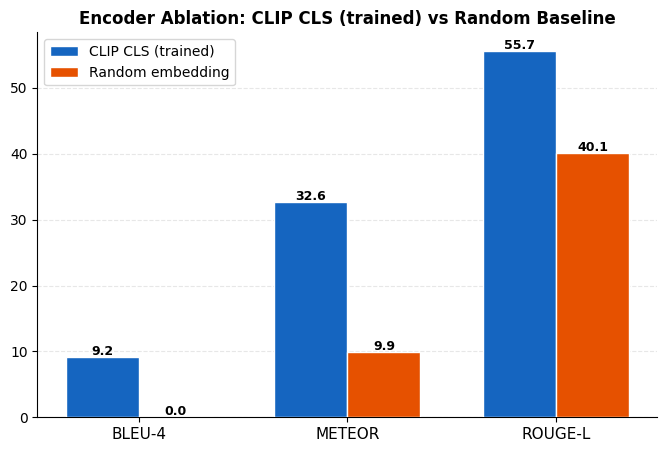

  Saved: encoder_ablation.png + .pdf
Encoder ablation figure saved.


In [28]:
# Cell 24 — Encoder ablation (Contribution 2)
print("ENCODER ABLATION: CLIP CLS (trained) vs Random Embedding baseline")

abl_tr_e = random.Random(42).sample(
    [r for r in bnature if get_emb_path(r["image"]).exists()],
    int(len(bnature)*CFG.ABL_FRAC)
)
abl_te_e = [r for r in te_bn if get_emb_path(r["image"]).exists()][:80]

load_ckpt(models["bn"], all_ckpts["bn"])
models["bn"].eval()

refs_r = []; hyps_r = []; seen_r = set()
with torch.no_grad():
    for r in abl_te_e:
        if r["image"] in seen_r: continue
        seen_r.add(r["image"])
        try:
            emb = torch.load(str(get_emb_path(r["image"])), map_location="cpu", weights_only=True).float()
            gen = models["bn"].generate(emb, beam=1)
        except Exception: gen = "."
        refs_r.append([r["caption"]]); hyps_r.append(gen or ".")

res_cls_real = {
    "BLEU-4":  compute_bleu_nltk(refs_r, hyps_r, 4),
    "METEOR":  compute_meteor(refs_r, hyps_r),
    "ROUGE-L": compute_rougeL(refs_r, hyps_r, "bn"),
}
print(f"  CLIP CLS (trained): BLEU-4={res_cls_real['BLEU-4']:.2f}  METEOR={res_cls_real['METEOR']:.2f}")

gc.collect(); torch.cuda.empty_cache()
m_rand = CLIPCapModel("bn", mlp_frozen=False)
p_ds   = CaptionDataset(abl_tr_e, "bn")
p_dl   = DataLoader(p_ds, batch_size=CFG.BATCH, shuffle=True, num_workers=2,
                    pin_memory=True, drop_last=True, collate_fn=p_ds.collate)
opt_rand    = AdamW(list(m_rand.parameters()), lr=CFG.LR, weight_decay=CFG.WEIGHT_DECAY)
sch_rand, _ = make_scheduler(opt_rand, len(p_dl)*3)

m_rand.train(); opt_rand.zero_grad(set_to_none=True)
for ep_rnd in range(3):
    for step, (embs, ids, labs) in enumerate(p_dl):
        try:
            rand_embs = torch.randn_like(embs)
            loss = m_rand(rand_embs.to(DEVICE), ids.to(DEVICE), labs.to(DEVICE))
            if torch.isnan(loss) or torch.isinf(loss):
                opt_rand.zero_grad(set_to_none=True); continue
            (loss/CFG.GRAD_ACCUM).backward()
            if (step+1)%CFG.GRAD_ACCUM==0 or (step+1)==len(p_dl):
                nn.utils.clip_grad_norm_(m_rand.parameters(), 1.0)
                opt_rand.step(); opt_rand.zero_grad(set_to_none=True); sch_rand.step()
        except RuntimeError as e:
            if "out of memory" in str(e).lower():
                opt_rand.zero_grad(set_to_none=True); gc.collect(); torch.cuda.empty_cache()
            else: raise

m_rand.eval()
refs_rnd = []; hyps_rnd = []; seen_rnd = set()
with torch.no_grad():
    for r in abl_te_e:
        if r["image"] in seen_rnd: continue
        seen_rnd.add(r["image"])
        try:
            rand_emb = torch.randn(CFG.CLIP_DIM)
            gen = m_rand.generate(rand_emb, beam=1)
        except Exception: gen = "."
        refs_rnd.append([r["caption"]]); hyps_rnd.append(gen or ".")

res_random = {
    "BLEU-4":  compute_bleu_nltk(refs_rnd, hyps_rnd, 4),
    "METEOR":  compute_meteor(refs_rnd, hyps_rnd),
    "ROUGE-L": compute_rougeL(refs_rnd, hyps_rnd, "bn"),
}
print(f"  Random embedding:   BLEU-4={res_random['BLEU-4']:.2f}  METEOR={res_random['METEOR']:.2f}")
del m_rand; gc.collect(); torch.cuda.empty_cache()

with open(f"{CFG.OUTPUT_DIR}/encoder_ablation.json","w") as f:
    json.dump({"clip_cls_trained": res_cls_real, "random_baseline": res_random}, f, indent=2)

METRICS_ENC = ["BLEU-4","METEOR","ROUGE-L"]
fig, ax = plt.subplots(figsize=(8,5))
x = np.arange(len(METRICS_ENC)); w = 0.35
for i, (name, col, res) in enumerate([
    ("CLIP CLS (trained)", "#1565C0", res_cls_real),
    ("Random embedding",   "#E65100", res_random),
]):
    vals = [res[m] for m in METRICS_ENC]
    bars = ax.bar(x+i*w, vals, w, label=name, color=col, edgecolor="white", zorder=3)
    for bar, val in zip(bars, vals):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3, f"{val:.1f}", ha="center", fontsize=9, fontweight="bold")
ax.set_xticks(x+w/2); ax.set_xticklabels(METRICS_ENC, fontsize=11)
ax.set_title("Encoder Ablation: CLIP CLS (trained) vs Random Baseline", fontsize=12, fontweight="bold")
ax.legend(fontsize=10); ax.grid(axis="y", alpha=0.3, ls="--"); ax.spines[["top","right"]].set_visible(False)
save_show_dual(fig, f"{CFG.FIG_DIR}/encoder_ablation")
print("Encoder ablation figure saved.")

# **Stage Ablation**

STAGE ABLATION: Early (Ep1) vs Best Checkpoint
  Loaded: clipcap_bn_ep1.pt
  [BN ep1] BLEU-4=10.19
  Loaded: clipcap_bn_best.pt
  [BN best] BLEU-4=9.21
  Loaded: clipcap_hi_ep1.pt
  [HI ep1] BLEU-4=0.00
  Loaded: clipcap_hi_best.pt
  [HI best] BLEU-4=0.00
  Loaded: clipcap_en_ep1.pt
  [EN ep1] BLEU-4=0.00
  Loaded: clipcap_en_best.pt
  [EN best] BLEU-4=5.07


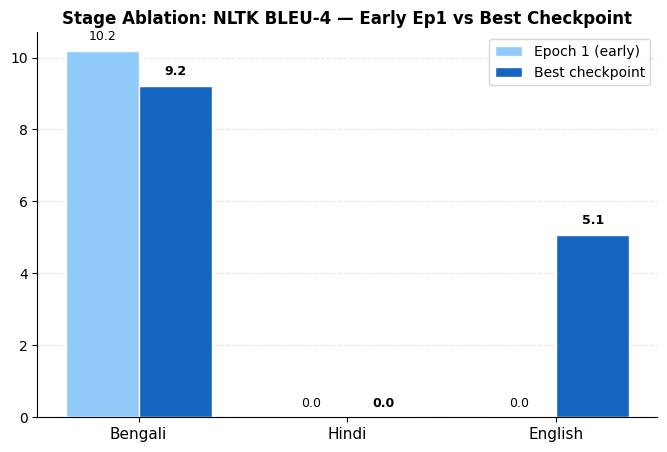

  Saved: stage_ablation.png + .pdf
Stage ablation figure saved.


In [29]:
# Cell 25 — Stage ablation (Early Ep1 vs Best checkpoint)
print("STAGE ABLATION: Early (Ep1) vs Best Checkpoint")

stage_res = {}
for lang, te_recs, img2c in [("bn",te_bn,te_bn_img2caps),
                               ("hi",te_hi,te_hi_img2caps),
                               ("en",te_en,te_en_img2caps)]:
    ep1_path  = f"{CFG.CKPT_DIR}/clipcap_{lang}_ep1.pt"
    lang_recs = [r for r in te_recs if r["lang"] == lang]
    for ep_label, path in [("ep1", ep1_path), ("best", all_ckpts.get(lang,""))]:
        if not Path(path).exists():
            stage_res.setdefault(lang, {})[ep_label] = {"BLEU-4":0.,"METEOR":0.}
            continue
        load_ckpt(models[lang], path); models[lang].eval()
        refs_s = []; hyps_s = []; seen_s = set()
        with torch.no_grad():
            for r in lang_recs[:80]:
                if r["image"] in seen_s or not get_emb_path(r["image"]).exists(): continue
                seen_s.add(r["image"])
                try:
                    emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
                    gen = models[lang].generate(emb, beam=1)
                except Exception: gen = "."
                refs_s.append([r["caption"]]); hyps_s.append(gen or ".")
        stage_res.setdefault(lang, {})[ep_label] = {
            "BLEU-4": compute_bleu_nltk(refs_s, hyps_s, 4),
            "METEOR": compute_meteor(refs_s, hyps_s),
        }
        print(f"  [{lang.upper()} {ep_label}] BLEU-4={stage_res[lang][ep_label]['BLEU-4']:.2f}")

with open(f"{CFG.OUTPUT_DIR}/stage_ablation.json","w") as f:
    json.dump(stage_res, f, indent=2)

fig, ax = plt.subplots(figsize=(8,5))
x = np.arange(3); w = 0.35; langs = ["bn","hi","en"]
s1_vals = [stage_res.get(l,{}).get("ep1",{}).get("BLEU-4",0.) for l in langs]
s2_vals = [stage_res.get(l,{}).get("best",{}).get("BLEU-4",0.) for l in langs]
br1 = ax.bar(x-w/2, s1_vals, w, label="Epoch 1 (early)", color="#90CAF9", edgecolor="white", zorder=3)
br2 = ax.bar(x+w/2, s2_vals, w, label="Best checkpoint", color="#1565C0", edgecolor="white", zorder=3)
ax.set_xticks(x); ax.set_xticklabels([LANG_NAMES[l] for l in langs], fontsize=11)
ax.set_title("Stage Ablation: NLTK BLEU-4 — Early Ep1 vs Best Checkpoint", fontsize=12, fontweight="bold")
ax.legend(); ax.grid(axis="y", alpha=0.3, ls="--"); ax.spines[["top","right"]].set_visible(False)
for bar, val in zip(br1, s1_vals):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3, f"{val:.1f}", ha="center", fontsize=9)
for bar, val in zip(br2, s2_vals):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3, f"{val:.1f}", ha="center", fontsize=9, fontweight="bold")
save_show_dual(fig, f"{CFG.FIG_DIR}/stage_ablation")
print("Stage ablation figure saved.")

# **Vocabulary analysis**

  Loaded: clipcap_bn_best.pt
  Loaded: clipcap_hi_best.pt
  Loaded: clipcap_en_best.pt
[Bengali] ref:3030 hyp:380 shared:330 hyp_mean:5.3 novelty:1.5%


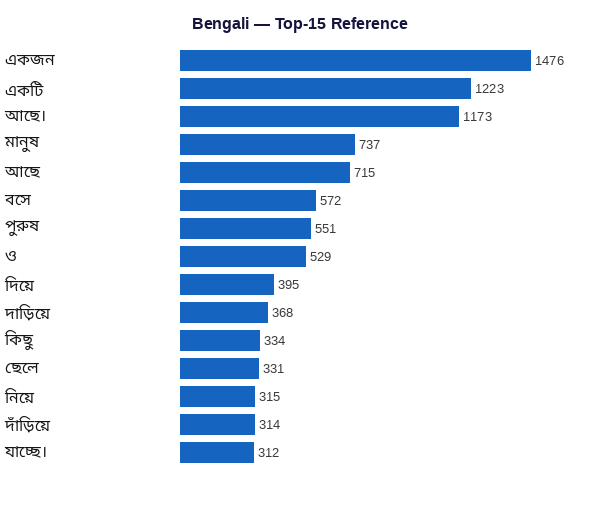

  Saved: vocab_bn_ref.png + .pdf


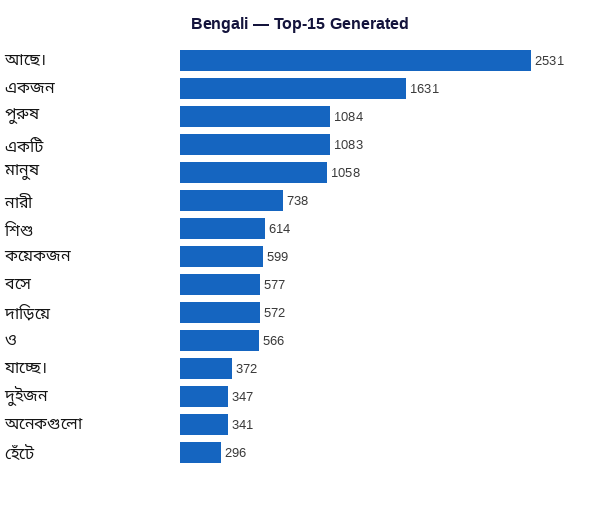

  Saved: vocab_bn_hyp.png + .pdf
[Hindi] ref:1021 hyp:184 shared:163 hyp_mean:9.1 novelty:3.1%


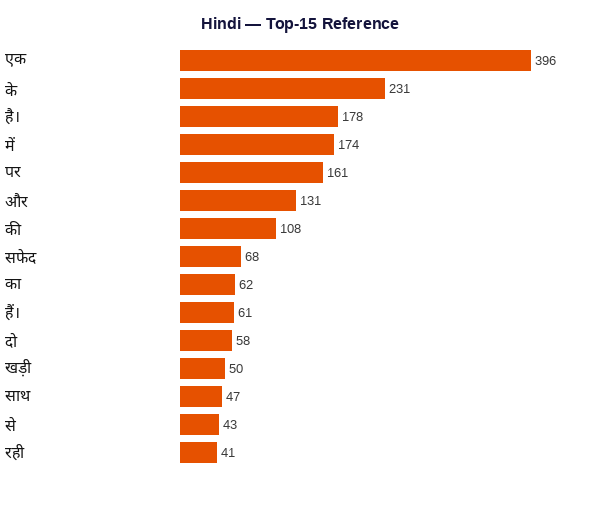

  Saved: vocab_hi_ref.png + .pdf


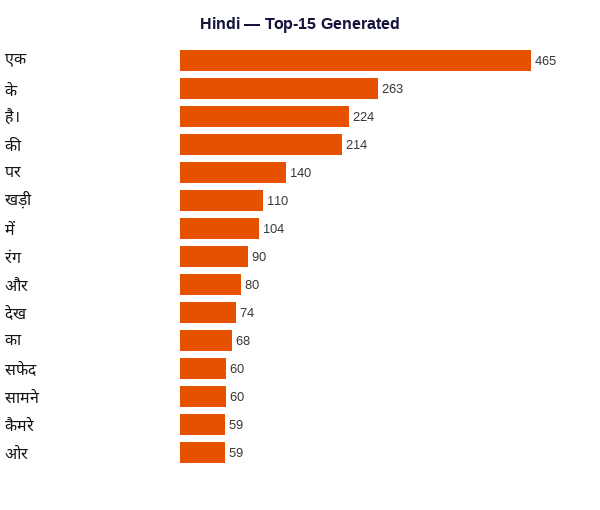

  Saved: vocab_hi_hyp.png + .pdf
[English] ref:2880 hyp:720 shared:519 hyp_mean:15.0 novelty:7.1%


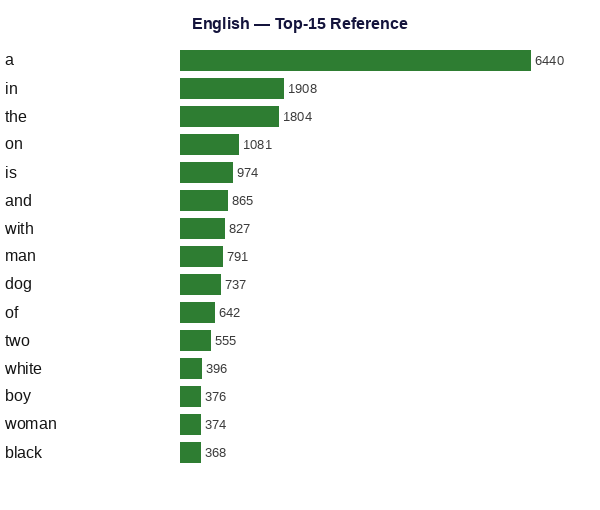

  Saved: vocab_en_ref.png + .pdf


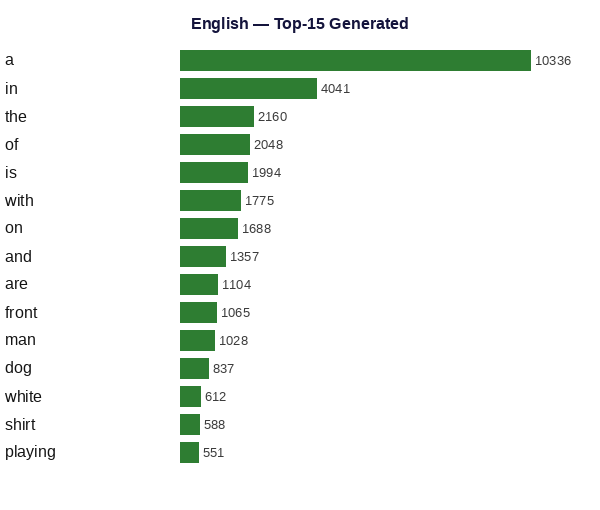

  Saved: vocab_en_hyp.png + .pdf
Vocabulary analysis figures saved.


In [30]:
# Cell 26 — Vocabulary analysis (PIL, one figure per language x {Reference, Generated})
for lang in ["bn","hi","en"]:
    load_ckpt(models[lang], all_ckpts[lang]); models[lang].eval()

gen_cache = {}
for lang, te_recs in [("bn",te_bn),("hi",te_hi),("en",te_en)]:
    with torch.no_grad():
        for r in te_recs:
            if r["image"] in gen_cache or not get_emb_path(r["image"]).exists(): continue
            try:
                emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
                gen = models[lang].generate(emb)
            except Exception: gen = "."
            gen_cache[r["image"]] = (lang, gen or ".")

lang_refs = {"bn":[],"hi":[],"en":[]}; lang_hyps = {"bn":[],"hi":[],"en":[]}
for lang, te_recs in [("bn",te_bn),("hi",te_hi),("en",te_en)]:
    for r in te_recs:
        lang_refs[lang].append(r["caption"])
        lang_hyps[lang].append(gen_cache.get(r["image"],("","."))[1])

def vocab_stats(refs, hyps):
    rc = Counter(); hc = Counter()
    for r in refs: rc.update(r.split())
    for h in hyps: hc.update(h.split())
    novel    = sum(1 for h in hyps for w in h.split() if w not in rc)
    total_ht = sum(len(h.split()) for h in hyps)
    return {"unique_ref":len(rc),"unique_hyp":len(hc),
            "shared":len(set(rc.keys())&set(hc.keys())),
            "hyp_mean":float(np.mean([len(h.split()) for h in hyps])) if hyps else 0,
            "novelty":novel/max(total_ht,1)*100,
            "top_ref":rc.most_common(15),"top_hyp":hc.most_common(15)}

def build_freq_chart_pil(words, counts, lang, title, color):
    W, H = 600, 30*len(words)+60
    img = Image.new("RGB",(W,H),(255,255,255))
    d = ImageDraw.Draw(img)
    draw_center(d, title, W//2, 25, get_font("en",16,bold=True), (20,20,60))
    maxc = max(counts) if counts else 1
    for i,(w_,c) in enumerate(zip(words,counts)):
        y = 50 + i*28
        bar_w = int((c/maxc)*350)
        d.rectangle([180, y, 180+bar_w, y+20], fill=color)
        draw_left(d, w_, 5, y+10, pick_font(w_, lang, 16), (20,20,20))
        draw_left(d, str(c), 185+bar_w, y+10, get_font("en",13), (60,60,60))
    return img

LANG_COLORS_RGB = {"bn":(21,101,192),"hi":(230,81,0),"en":(46,125,50)}
all_vocab = {}
for lang, lname in [("bn","Bengali"),("hi","Hindi"),("en","English")]:
    refs, hyps = lang_refs[lang], lang_hyps[lang]
    if not refs: continue
    vs = vocab_stats(refs, hyps); all_vocab[lang] = vs
    print(f"[{lname}] ref:{vs['unique_ref']} hyp:{vs['unique_hyp']} shared:{vs['shared']} "
          f"hyp_mean:{vs['hyp_mean']:.1f} novelty:{vs['novelty']:.1f}%")
    for tag, data in [("ref", vs["top_ref"]), ("hyp", vs["top_hyp"])]:
        words = [w for w,_ in data]; counts=[c for _,c in data]
        img = build_freq_chart_pil(words, counts, lang,
                f"{lname} — Top-15 {'Reference' if tag=='ref' else 'Generated'}",
                LANG_COLORS_RGB[lang])
        save_show_dual(img, f"{CFG.FIG_DIR}/vocab_{lang}_{tag}")

with open(f"{CFG.OUTPUT_DIR}/vocab_stats.json","w",encoding="utf-8") as f:
    json.dump({l:{k:v for k,v in d.items() if k not in ["top_ref","top_hyp"]}
               for l,d in all_vocab.items()}, f, indent=2, ensure_ascii=False)
print("Vocabulary analysis figures saved.")

# **Deployment Analysis (Contribution 6)**

  Loaded: clipcap_bn_best.pt
  Loaded: clipcap_hi_best.pt
  Loaded: clipcap_en_best.pt

Inference times (ms/image):
  [BN] mean=428.3ms  min=416.7  max=443.2
  [HI] mean=270.4ms  min=262.3  max=294.5
  [EN] mean=311.8ms  min=307.4  max=324.5


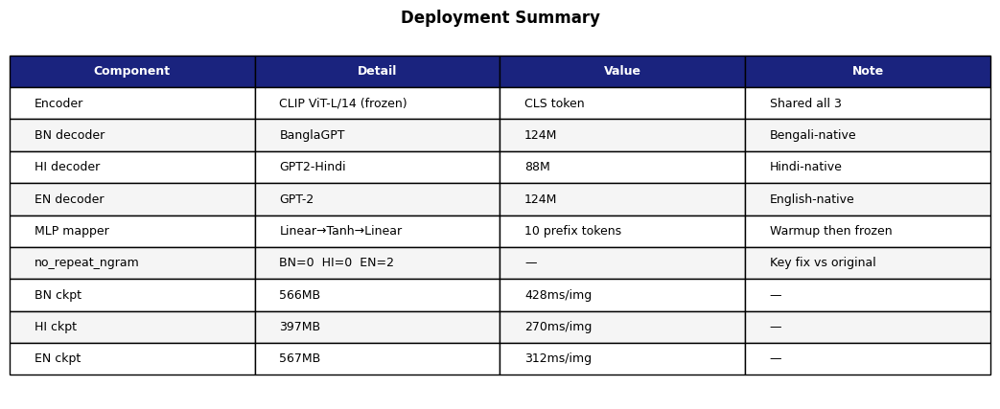

  Saved: deployment_table.png + .pdf


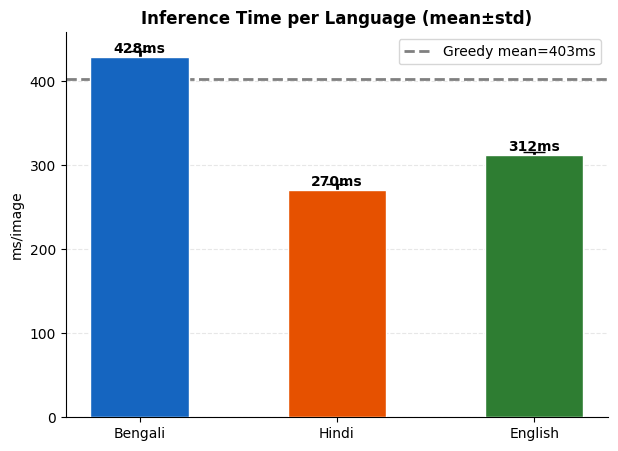

  Saved: deployment_latency.png + .pdf
Deployment figures saved.


In [31]:
# Cell 27 — Deployment analysis (Contribution 6)
for lang in ["bn","hi","en"]:
    load_ckpt(models[lang], all_ckpts[lang]); models[lang].eval()

deploy_records = []
for lang, te_recs in [("bn",te_bn),("hi",te_hi),("en",te_en)]:
    pool = [r for r in te_recs if r["lang"]==lang and get_emb_path(r["image"]).exists()]
    deploy_records.extend(random.Random(42).sample(pool, min(20,len(pool))))

timing = {"bn":[],"hi":[],"en":[]}
with torch.no_grad():
    for r in deploy_records:
        lang = r["lang"]
        try:
            emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
            if torch.cuda.is_available(): torch.cuda.synchronize()
            t0  = time.perf_counter()
            gen = models[lang].generate(emb)
            if torch.cuda.is_available(): torch.cuda.synchronize()
            timing[lang].append((time.perf_counter()-t0)*1000)
        except Exception: pass

greedy_t = []
with torch.no_grad():
    for r in deploy_records[:15]:
        lang = r["lang"]
        try:
            emb = torch.load(str(get_emb_path(r["image"])), weights_only=True).float()
            if torch.cuda.is_available(): torch.cuda.synchronize()
            t0  = time.perf_counter()
            gen = models[lang].generate(emb, beam=1)
            if torch.cuda.is_available(): torch.cuda.synchronize()
            greedy_t.append((time.perf_counter()-t0)*1000)
        except Exception: pass

print("\nInference times (ms/image):")
deploy_stats = {}
for lang in ["bn","hi","en"]:
    ts = timing[lang]
    if ts:
        mn,mx,avg,med = min(ts),max(ts),np.mean(ts),np.median(ts)
        deploy_stats[lang] = {"min":mn,"max":mx,"mean":avg,"median":med,"n":len(ts)}
        print(f"  [{lang.upper()}] mean={avg:.1f}ms  min={mn:.1f}  max={mx:.1f}")

greedy_mean = np.mean(greedy_t) if greedy_t else 1.
beam_mean   = np.mean([t for ts in timing.values() for t in ts]) if any(timing.values()) else 1.
total_params     = sum(sum(p.numel() for p in models[l].parameters()) for l in ["bn","hi","en"])
ckpt_sizes = {lang: os.path.getsize(all_ckpts[lang])/1e6
              if Path(all_ckpts.get(lang,"")).exists() else 0.
              for lang in ["bn","hi","en"]}
vram = torch.cuda.memory_allocated()/1e9 if torch.cuda.is_available() else 0.

with open(f"{CFG.OUTPUT_DIR}/deployment_stats.json","w") as f:
    json.dump({"per_lang":deploy_stats,"greedy_ms":greedy_mean,"beam_ms":beam_mean,
               "total_params_M":total_params/1e6,
               "ckpt_MB":ckpt_sizes,"vram_GB":vram}, f, indent=2)

fig, ax = plt.subplots(figsize=(11,5)); ax.axis("off")
dtbl = [
    ["Encoder","CLIP ViT-L/14 (frozen)","CLS token","Shared all 3"],
    ["BN decoder","BanglaGPT","124M","Bengali-native"],
    ["HI decoder","GPT2-Hindi","88M","Hindi-native"],
    ["EN decoder","GPT-2","124M","English-native"],
    ["MLP mapper","Linear→Tanh→Linear","10 prefix tokens","Warmup then frozen"],
    ["no_repeat_ngram","BN=0  HI=0  EN=2","—","Key fix vs original"],
    ["BN ckpt",f"{ckpt_sizes.get('bn',0):.0f}MB", f"{deploy_stats.get('bn',{}).get('mean',0):.0f}ms/img","—"],
    ["HI ckpt",f"{ckpt_sizes.get('hi',0):.0f}MB", f"{deploy_stats.get('hi',{}).get('mean',0):.0f}ms/img","—"],
    ["EN ckpt",f"{ckpt_sizes.get('en',0):.0f}MB", f"{deploy_stats.get('en',{}).get('mean',0):.0f}ms/img","—"],
]
t = ax.table(cellText=dtbl, colLabels=["Component","Detail","Value","Note"], cellLoc="left", loc="center")
t.auto_set_font_size(False); t.set_fontsize(9); t.scale(1.2, 2.0)
for ci in range(4): t[0,ci].set_facecolor("#1A237E"); t[0,ci].set_text_props(color="white",fontweight="bold")
for ri in range(1, len(dtbl)+1):
    clr = "#F5F5F5" if ri%2==0 else "white"
    for ci in range(4): t[ri,ci].set_facecolor(clr)
ax.set_title("Deployment Summary", fontsize=12, fontweight="bold")
save_show_dual(fig, f"{CFG.FIG_DIR}/deployment_table")

fig, ax = plt.subplots(figsize=(7,5))
ld  = ["Bengali","Hindi","English"]
ms_ = [deploy_stats.get(l,{}).get("mean",0) for l in ["bn","hi","en"]]
sd_ = [np.std(timing[l]) if timing[l] else 0 for l in ["bn","hi","en"]]
bars = ax.bar(ld, ms_, color=["#1565C0","#E65100","#2E7D32"], edgecolor="white", width=0.5, zorder=3)
ax.errorbar(range(3), ms_, yerr=sd_, fmt="none", color="black", capsize=8, lw=2)
ax.axhline(greedy_mean, color="gray", lw=2, ls="--", label=f"Greedy mean={greedy_mean:.0f}ms")
for bar, val in zip(bars, ms_):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+5, f"{val:.0f}ms", ha="center", fontsize=10, fontweight="bold")
ax.set_title("Inference Time per Language (mean±std)", fontsize=12, fontweight="bold")
ax.set_ylabel("ms/image"); ax.legend()
ax.grid(axis="y", alpha=0.3, ls="--"); ax.spines[["top","right"]].set_visible(False)
save_show_dual(fig, f"{CFG.FIG_DIR}/deployment_latency")
print("Deployment figures saved.")

# **Quantitative Analysis(Contributions 1) and final summary**

In [32]:
# Cell 28 — Final summary (text only — bar figures already produced in Cell 14)
for lang in ["bn","hi","en"]:
    load_ckpt(models[lang], all_ckpts[lang]); models[lang].eval()

bn = res_bn; hi = res_hi; en = res_en; ov = res_ov
TRAIN_H  = sum(sum(all_hists.get(l,{}).get("epoch_sec",[]) or [0]) for l in ["bn","hi","en"]) / 3600
TOTAL_H  = (time.time() - GLOBAL_START) / 3600

summary = f"""
FINAL RESULTS — Trilingual CLIPCap
===================================================================
Encoder  : CLIP ViT-L/14 (frozen, CLS, {CFG.CLIP_DIM}d)
Bengali  : BanglaGPT  | no_repeat_ngram=0  | max_new_tokens=40
Hindi    : GPT2-Hindi | no_repeat_ngram=0  | max_new_tokens=40
English  : GPT-2      | no_repeat_ngram=2  | max_new_tokens=25
MLP      : warmup {CFG.MLP_WARMUP_EPOCHS} epoch(s) then frozen
Hardware : Kaggle T4  | Training: {TRAIN_H:.2f}h | Total: {TOTAL_H:.2f}h

               Bengali    Hindi    English   Overall
BLEU-1     :  {bn['BLEU-1']:7.2f}  {hi['BLEU-1']:7.2f}  {en['BLEU-1']:7.2f}  {ov['BLEU-1']:7.2f}
BLEU-4     :  {bn['BLEU-4']:7.2f}  {hi['BLEU-4']:7.2f}  {en['BLEU-4']:7.2f}  {ov['BLEU-4']:7.2f}
CIDEr      :  {bn['CIDEr']:7.2f}  {hi['CIDEr']:7.2f}  {en['CIDEr']:7.2f}  {ov['CIDEr']:7.2f}
METEOR     :  {bn['METEOR']:7.2f}  {hi['METEOR']:7.2f}  {en['METEOR']:7.2f}  {ov['METEOR']:7.2f}
ROUGE-L    :  {bn['ROUGE-L']:7.2f}  {hi['ROUGE-L']:7.2f}  {en['ROUGE-L']:7.2f}  {ov['ROUGE-L']:7.2f}
BERTScore  :  {bn['BERTScore-F1']:7.2f}  {hi['BERTScore-F1']:7.2f}  {en['BERTScore-F1']:7.2f}  {ov['BERTScore-F1']:7.2f}
"""
print(summary)
with open(f"{CFG.OUTPUT_DIR}/final_summary.txt","w",encoding="utf-8") as f:
    f.write(summary)
print("Final summary saved.")

  Loaded: clipcap_bn_best.pt
  Loaded: clipcap_hi_best.pt
  Loaded: clipcap_en_best.pt

FINAL RESULTS — Trilingual CLIPCap
Encoder  : CLIP ViT-L/14 (frozen, CLS, 768d)
Bengali  : BanglaGPT  | no_repeat_ngram=0  | max_new_tokens=40
Hindi    : GPT2-Hindi | no_repeat_ngram=0  | max_new_tokens=40
English  : GPT-2      | no_repeat_ngram=2  | max_new_tokens=25
MLP      : warmup 1 epoch(s) then frozen
Hardware : Kaggle T4  | Training: 5.14h | Total: 7.55h

               Bengali    Hindi    English   Overall
BLEU-1     :    51.39    44.27    56.38    50.68
BLEU-4     :    18.00    11.27    18.51    15.93
CIDEr      :    57.28    35.63    40.01    44.31
METEOR     :    38.94    26.53    46.41    37.29
ROUGE-L    :    63.47    47.60    43.50    51.52
BERTScore  :    81.09    74.76    90.40    82.09

Final summary saved.


# **Final Zip**

In [33]:
# Cell 29 — Final ZIP (captures every .png + .pdf, plus outputs/checkpoints)
for src, dst in [
    (CFG.FIG_DIR,    "/kaggle/working/figures.zip"),
    (CFG.OUTPUT_DIR, "/kaggle/working/outputs.zip"),
]:
    with zipfile.ZipFile(dst,"w",zipfile.ZIP_DEFLATED) as z:
        for fp in Path(src).rglob("*"):
            if fp.is_file() and fp.suffix.lower() in (".png",".pdf",".json",".csv",".txt"):
                z.write(fp, fp.relative_to(src))
    print(f"  {Path(dst).name} ({os.path.getsize(dst)/1e6:.1f}MB)")

pngs = sorted(Path(CFG.FIG_DIR).glob("*.png"))
pdfs = sorted(Path(CFG.FIG_DIR).glob("*.pdf"))
print(f"\nSaved {len(pngs)} PNGs + {len(pdfs)} PDFs (one figure per file):")
for fp in pngs: print(f"  {fp.name} ({fp.stat().st_size//1024}KB)")

print("\n" + "="*68)
print("EXPERIMENT COMPLETE — CLIPCap Trilingual Image Captioning")
print("="*68)
elapsed = (time.time()-GLOBAL_START)/3600
print(f"  Total elapsed    : {elapsed:.2f}h")
for lang_name, res in [("Bengali",res_bn),("Hindi",res_hi),("English",res_en)]:
    print(f"  {lang_name:<12}: NLTK BLEU-4={res['BLEU-4']:.1f}"
          f"  METEOR={res['METEOR']:.1f}"
          f"  CIDEr={res['CIDEr']:.1f}"
          f"  BERTScore={res['BERTScore-F1']:.1f}")
_, _, free = shutil.disk_usage("/kaggle/working")
print(f"  /kaggle/working free: {free/1e9:.1f}GB")

  figures.zip (10.4MB)
  outputs.zip (0.0MB)

Saved 74 PNGs + 74 PDFs (one figure per file):
  augmentation_1.png (386KB)
  augmentation_2.png (338KB)
  augmentation_3.png (386KB)
  augmentation_4.png (364KB)
  augmentation_original.png (370KB)
  baseline_comparison.png (176KB)
  beam_bn_lineplot.png (58KB)
  beam_bn_table.png (48KB)
  beam_bn_vs_greedy.png (40KB)
  beam_lineplot_bn.png (56KB)
  beam_lineplot_en.png (61KB)
  beam_lineplot_hi.png (71KB)
  beam_vs_greedy_bn.png (49KB)
  beam_vs_greedy_en.png (47KB)
  beam_vs_greedy_hi.png (44KB)
  confusion_matrix_bn.png (79KB)
  confusion_matrix_bn_beam2.png (78KB)
  confusion_matrix_bn_greedy.png (74KB)
  confusion_matrix_en.png (83KB)
  confusion_matrix_en_beam2.png (83KB)
  confusion_matrix_en_greedy.png (84KB)
  confusion_matrix_hi.png (67KB)
  confusion_matrix_hi_beam2.png (66KB)
  confusion_matrix_hi_greedy.png (66KB)
  dataset_split_test.png (38KB)
  dataset_split_train.png (41KB)
  dataset_split_val.png (38KB)
  deployment_laten